In [6]:
import torch
from PIL import Image
import open_clip

# Scene Graph Benchmark Dataset and Dataloader

In [7]:
import os
import json
import json
import logging
import numpy as np
import base64
from collections import defaultdict
from maskrcnn_benchmark.config import cfg
from scene_graph_benchmark.config import sg_cfg
from maskrcnn_benchmark.data import make_data_loader
from maskrcnn_benchmark.data.datasets.utils.load_files import config_dataset_file
from maskrcnn_benchmark.engine.inference import inference
from scene_graph_benchmark.scene_parser import SceneParser
from scene_graph_benchmark.AttrRCNN import AttrRCNN
from maskrcnn_benchmark.utils.collect_env import collect_env_info
from maskrcnn_benchmark.utils.comm import synchronize, get_rank
from maskrcnn_benchmark.utils.logger import setup_logger
from maskrcnn_benchmark.utils.miscellaneous import mkdir

### Dataset Eval helpers

In [8]:
# Copyright (c) 2021 Microsoft Corporation. Licensed under the MIT license. 
import os
import json
import numpy as np
import base64
import torch
from collections import defaultdict
from maskrcnn_benchmark.structures.tsv_file_ops import tsv_reader
from maskrcnn_benchmark.data.datasets.evaluation.sg.evaluator import BasicSceneGraphEvaluator
from maskrcnn_benchmark.data.datasets.evaluation.sg.box import bbox_overlaps


def do_sg_evaluation(dataset, predictions, output_folder, logger):
    """
    scene graph generation evaluation
    """

    prediction_file = os.path.join(output_folder, 'predictions.tsv')

    gt_dicts = prepare_vrd_groundtruths(dataset)

    predict_dicts = prepare_vrd_predictions(prediction_file, dataset.labelmap)

    evaluator = BasicSceneGraphEvaluator.all_modes(multiple_preds=False)

    top_Ns = [20, 50, 100]
    mode = "sgdet"
    result_dict = {}
    danfei_metric = {}
    rowan_metric = {}

    result_dict[mode + '_recall'] = {20: [], 50: [], 100: []}
    for image_key, gt_boxlist in gt_dicts.items():
        sg_prediction = predict_dicts[image_key]
        if len(sg_prediction)==0:
            sg_prediction = {'bboxes':torch.as_tensor([]) , 'bbox_scores':torch.tensor([]), 'bbox_labels':torch.tensor([]), 'relation_pairs':torch.tensor([]), 'relation_scores':torch.tensor([]), 'relation_scores_all':torch.tensor([]), 'relation_labels':torch.tensor([])}

        gt_entry = {
            'gt_classes': gt_boxlist.get_field("labels").numpy(),
            'gt_relations': gt_boxlist.get_field("relation_labels").numpy().astype(int),
            'gt_boxes': gt_boxlist.bbox.numpy(),
        }

        if len(sg_prediction['relation_pairs'].numpy())==0:
            pred_entry = {
                'pred_boxes': np.array([]),
                'pred_classes': np.array([]),
                'obj_scores': np.array([]),
                'pred_rel_inds': np.array([]),
                'rel_scores': np.array([]),
            }
        else:
            obj_scores = sg_prediction['bbox_scores'].numpy()
            all_rels = sg_prediction['relation_pairs'].numpy()
            fp_pred = sg_prediction['relation_scores_all'].numpy()

            scores = np.column_stack((
                obj_scores[all_rels[:, 0]],
                obj_scores[all_rels[:, 1]],
                fp_pred[:, 1:].max(1)
            )).prod(1)
            sorted_inds = np.argsort(-scores)
            sorted_inds = sorted_inds[scores[sorted_inds] > 0]  # [:100]

            pred_entry = {
                'pred_boxes': sg_prediction['bboxes'].numpy(),
                'pred_classes': sg_prediction['bbox_labels'].numpy(),
                'obj_scores': sg_prediction['bbox_scores'].numpy(),
                'pred_rel_inds': all_rels[sorted_inds],
                'rel_scores': fp_pred[sorted_inds],
            }

        evaluator[mode].evaluate_scene_graph_entry(
            gt_entry,
            pred_entry,
        )

        evaluate(gt_boxlist.get_field("labels"), gt_boxlist.bbox, gt_boxlist.get_field("pred_labels"),
                    sg_prediction['bboxes'], sg_prediction['bbox_scores'], sg_prediction['bbox_labels'],
                    sg_prediction['relation_pairs'], sg_prediction['relation_scores_all'],
                    top_Ns, result_dict, mode)

    evaluator[mode].print_stats(logger)
    rowan_nums = {mode+str(key): np.mean(np.array(val))
                    for key, val in evaluator[mode].result_dict[mode + '_recall'].items()}
    rowan_metric.update(rowan_nums)

    logger.warning('=====================' + mode + '(IMP)' + '=========================')
    logger.warning("{}-recall@20: {}".format(mode, np.mean(np.array(result_dict[mode + '_recall'][20]))))
    logger.warning("{}-recall@50: {}".format(mode, np.mean(np.array(result_dict[mode + '_recall'][50]))))
    logger.warning("{}-recall@100: {}".format(mode, np.mean(np.array(result_dict[mode + '_recall'][100]))))
    danfei_nums = {mode+str(key): np.mean(np.array(val)) for key, val in result_dict[mode + '_recall'].items()}
    danfei_metric.update(danfei_nums)

    return {"danfei_metric": danfei_metric, "rowan_metric": rowan_metric, "result_dict": result_dict}


def evaluate(gt_classes, gt_boxes, gt_rels,
             obj_rois, obj_scores, obj_labels,
             rel_inds, rel_scores,
             top_Ns, result_dict,
             mode, iou_thresh=0.5):
    gt_classes = gt_classes.cpu()
    gt_boxes = gt_boxes.cpu()
    gt_rels = gt_rels.cpu()

    obj_rois = obj_rois.cpu()
    obj_scores = obj_scores.cpu()
    obj_labels = obj_labels.cpu()
    rel_inds = rel_inds.cpu()
    rel_scores = rel_scores.cpu()

    if gt_rels.ne(0).sum() == 0:
        return (None, None)
    
    if len(rel_inds) == 0:
        for k in result_dict[mode + '_recall']:
            result_dict[mode + '_recall'][k].append(0)
        return (None, None)

    rel_sum = ((gt_rels.sum(1) > 0).int() + (gt_rels.sum(0) > 0).int())
    ix_w_rel = rel_sum.nonzero(as_tuple=False).numpy().squeeze()

    # label = (((gt_rel_label.sum(1) == 0).int() + (gt_rel_label.sum(0) == 0).int()) == 2)
    # change_ix = label.nonzero(as_tuple=False)

    gt_boxes = gt_boxes.numpy()
    num_gt_boxes = gt_boxes.shape[0]
    gt_relations = gt_rels.nonzero(as_tuple=False).numpy()
    gt_classes = gt_classes.view(-1, 1).numpy()

    gt_rels_view = gt_rels.contiguous().view(-1)
    gt_pred_labels = gt_rels_view[gt_rels_view.nonzero(as_tuple=False).squeeze()].contiguous().view(-1, 1).numpy()

    num_gt_relations = gt_relations.shape[0]
    if num_gt_relations == 0:
        return (None, None)
    gt_class_scores = np.ones(num_gt_boxes)
    gt_predicate_scores = np.ones(num_gt_relations)
    gt_triplets, gt_triplet_boxes, _ = _triplet(gt_pred_labels,
                                                gt_relations,
                                                gt_classes,
                                                gt_boxes,
                                                gt_predicate_scores,
                                                gt_class_scores)
    

    # pred
    box_preds = obj_rois.numpy()
    num_boxes = box_preds.shape[0]

    predicate_preds = rel_scores.numpy()

    # no bg
    predicate_preds = predicate_preds[:, 1:]
    predicates = np.argmax(predicate_preds, 1).ravel() + 1
    predicate_scores = predicate_preds.max(axis=1).ravel()

    relations = rel_inds.numpy()

    # if relations.shape[0] != num_boxes * (num_boxes - 1):
    # pdb.set_trace()

    # assert(relations.shape[0] == num_boxes * (num_boxes - 1))
    assert (predicates.shape[0] == relations.shape[0])
    num_relations = relations.shape[0]
    if mode == 'predcls':
        # if predicate classification task
        # use ground truth bounding boxes
        assert (num_boxes == num_gt_boxes)
        classes = gt_classes
        class_scores = gt_class_scores
        boxes = gt_boxes
    elif mode == 'sgcls':
        assert (num_boxes == num_gt_boxes)
        # if scene graph classification task
        # use gt boxes, but predicted classes
        classes = obj_labels.numpy()  # np.argmax(class_preds, 1)
        class_scores = obj_scores.numpy()
        boxes = gt_boxes
    elif mode == 'sgdet' or mode == 'sgdet+':
        # if scene graph detection task
        # use preicted boxes and predicted classes
        classes = obj_labels.numpy()  # np.argmax(class_preds, 1)
        class_scores = obj_scores.numpy()  # class_preds.max(axis=1)
        # boxes = []
        # for i, c in enumerate(classes):
        #     boxes.append(box_preds[i, c*4:(c+1)*4])
        # boxes = np.vstack(boxes)
        boxes = box_preds
    else:
        raise NotImplementedError('Incorrect Mode! %s' % mode)

    pred_triplets, pred_triplet_boxes, relation_scores = \
        _triplet(predicates, relations, classes, boxes,
                 predicate_scores, class_scores, is_pred=False)
    sorted_inds = np.argsort(relation_scores)[::-1]
    sorted_inds_obj = np.argsort(class_scores)[::-1]
    # compue recall

    for k in result_dict[mode + '_recall']:
        this_k = min(k, num_relations)
        keep_inds = sorted_inds[:this_k]
        keep_inds_obj = sorted_inds_obj[:this_k]

        # triplets_valid = _relation_recall_triplet(gt_triplets,
        #                           pred_triplets[keep_inds,:],
        #                           gt_triplet_boxes,
        #                           pred_triplet_boxes[keep_inds,:],
        #                           iou_thresh)

        recall = _relation_recall(gt_triplets,
                                  pred_triplets[keep_inds, :],
                                  gt_triplet_boxes,
                                  pred_triplet_boxes[keep_inds, :],
                                  iou_thresh)
        num_gt = gt_triplets.shape[0]

        result_dict[mode + '_recall'][k].append(recall / num_gt)
        # result_dict[mode + '_triplets'][k].append(triplets_valid)

    # for visualization
    return pred_triplets[sorted_inds, :], pred_triplet_boxes[sorted_inds, :]


def _triplet(predicates, relations, classes, boxes,
             predicate_scores, class_scores, is_pred=False):
    # format predictions into triplets

    # compute the overlaps between boxes
    if is_pred:
        overlaps = bbox_overlaps(torch.from_numpy(boxes).contiguous(), torch.from_numpy(boxes).contiguous())

    assert (predicates.shape[0] == relations.shape[0])
    num_relations = relations.shape[0]
    triplets = np.zeros([num_relations, 3]).astype(np.int32)
    triplet_boxes = np.zeros([num_relations, 8]).astype(np.int32)
    triplet_scores = np.zeros([num_relations]).astype(np.float32)
    for i in range(num_relations):
        triplets[i, 1] = predicates[i]
        sub_i, obj_i = relations[i, :2]
        triplets[i, 0] = classes[sub_i]
        triplets[i, 2] = classes[obj_i]
        triplet_boxes[i, :4] = boxes[sub_i, :]
        triplet_boxes[i, 4:] = boxes[obj_i, :]
        # compute triplet score)
        score = class_scores[sub_i]
        score *= class_scores[obj_i]

        if is_pred:
            if overlaps[sub_i, obj_i] == 0:
                score *= 0
            else:
                score *= predicate_scores[i]
        else:
            score *= predicate_scores[i]

        triplet_scores[i] = score
    return triplets, triplet_boxes, triplet_scores


def _relation_recall(gt_triplets, pred_triplets,
                     gt_boxes, pred_boxes, iou_thresh):
    # compute the R@K metric for a set of predicted triplets
    num_gt = gt_triplets.shape[0]
    num_correct_pred_gt = 0
    for gt, gt_box in zip(gt_triplets, gt_boxes):
        keep = np.zeros(pred_triplets.shape[0]).astype(bool)
        for i, pred in enumerate(pred_triplets):
            if gt[0] == pred[0] and gt[1] == pred[1] and gt[2] == pred[2]:
                keep[i] = True
        if not np.any(keep):
            continue
        boxes = pred_boxes[keep, :]
        sub_iou = iou(gt_box[:4], boxes[:, :4])
        obj_iou = iou(gt_box[4:], boxes[:, 4:])
        inds = np.intersect1d(np.where(sub_iou >= iou_thresh)[0],
                              np.where(obj_iou >= iou_thresh)[0])
        if inds.size > 0:
            num_correct_pred_gt += 1
    return float(num_correct_pred_gt)


def _relation_recall_triplet(gt_triplets, pred_triplets,
                             gt_boxes, pred_boxes, iou_thresh):
    # compute the R@K metric for a set of predicted triplets
    num_gt = gt_triplets.shape[0]
    num_correct_pred_gt = 0
    triplets_valid = []
    boxes_valid = []
    for gt, gt_box in zip(gt_triplets, gt_boxes):
        keep = np.zeros(pred_triplets.shape[0]).astype(bool)
        for i, pred in enumerate(pred_triplets):
            if gt[0] == pred[0] and gt[1] == pred[1] and gt[2] == pred[2]:
                keep[i] = True
        if not np.any(keep):
            continue
        boxes = pred_boxes[keep, :]
        triplets = pred_triplets[keep, :]
        sub_iou = iou(gt_box[:4], boxes[:, :4])
        obj_iou = iou(gt_box[4:], boxes[:, 4:])
        inds = np.intersect1d(np.where(sub_iou >= iou_thresh)[0],
                              np.where(obj_iou >= iou_thresh)[0])
        if inds.size > 0:
            triplets_valid.append(triplets[inds[0]])
            boxes_valid.append(boxes[inds[0]])
            num_correct_pred_gt += 1
    return triplets_valid, boxes_valid


def _object_recall(gt_triplets, pred_triplets,
                   gt_boxes, pred_boxes, iou_thresh):
    # compute the R@K metric for a set of predicted triplets
    num_gt = gt_triplets.shape[0]
    num_correct_pred_gt = 0
    for gt, gt_box in zip(gt_triplets, gt_boxes):
        keep = np.zeros(pred_triplets.shape[0]).astype(bool)
        for i, pred in enumerate(pred_triplets):
            if gt[0] == pred[0]:
                keep[i] = True
        if not np.any(keep):
            continue
        boxes = pred_boxes[keep, :]
        box_iou = iou(gt_box[:4], boxes[:, :4])
        inds = np.where(box_iou >= iou_thresh)[0]
        if inds.size > 0:
            num_correct_pred_gt += 1
    return float(num_correct_pred_gt)


def _predicate_recall(gt_triplets, pred_triplets,
                      gt_boxes, pred_boxes, iou_thresh):
    # compute the R@K metric for a set of predicted triplets
    num_gt = gt_triplets.shape[0]
    num_correct_pred_gt = 0
    for gt, gt_box in zip(gt_triplets, gt_boxes):
        keep = np.zeros(pred_triplets.shape[0]).astype(bool)
        for i, pred in enumerate(pred_triplets):
            if gt[1] == pred[1]:
                keep[i] = True
        if not np.any(keep):
            continue
        boxes = pred_boxes[keep, :]
        sub_iou = iou(gt_box[:4], boxes[:, :4])
        obj_iou = iou(gt_box[4:], boxes[:, 4:])
        inds = np.intersect1d(np.where(sub_iou >= iou_thresh)[0],
                              np.where(obj_iou >= iou_thresh)[0])
        if inds.size > 0:
            num_correct_pred_gt += 1
    return float(num_correct_pred_gt)


def iou(gt_box, pred_boxes):
    # computer Intersection-over-Union between two sets of boxes
    ixmin = np.maximum(gt_box[0], pred_boxes[:, 0])
    iymin = np.maximum(gt_box[1], pred_boxes[:, 1])
    ixmax = np.minimum(gt_box[2], pred_boxes[:, 2])
    iymax = np.minimum(gt_box[3], pred_boxes[:, 3])
    iw = np.maximum(ixmax - ixmin + 1., 0.)
    ih = np.maximum(iymax - iymin + 1., 0.)
    inters = iw * ih
    # union
    uni = ((gt_box[2] - gt_box[0] + 1.) * (gt_box[3] - gt_box[1] + 1.) +
           (pred_boxes[:, 2] - pred_boxes[:, 0] + 1.) *
           (pred_boxes[:, 3] - pred_boxes[:, 1] + 1.) - inters)
    overlaps = inters / uni
    return overlaps

def prepare_vrd_predictions(pred_tsv_file, labelmap):
    predictions_dict = defaultdict(dict)
    for row in tsv_reader(pred_tsv_file):
        img_key = row[0]
        predictions = json.loads(row[1])
        bboxes = []
        bbox_scores = []
        bbox_labels = []
        for obj in predictions['objects']:
            bboxes.append(obj['rect'])
            bbox_scores.append(obj['conf'])
            bbox_labels.append(labelmap['class_to_ind'][obj['class']])
        idx_pairs = []
        relation_scores = []
        relation_scores_all = []
        relation_labels = []
        for triplet in predictions['relations']:
            idx_pairs.append([triplet['subj_id'], triplet['obj_id']])
            relation_scores.append(triplet['conf'])
            relation_scores_all.append(np.frombuffer(base64.b64decode(triplet['scores_all']), np.float32))
            relation_labels.append(labelmap['relation_to_ind'][triplet['class']])

        predictions_dict[img_key] = {'bboxes':torch.as_tensor(bboxes).reshape(-1, 4) , 'bbox_scores':torch.tensor(bbox_scores), 'bbox_labels':torch.tensor(bbox_labels), 'relation_pairs':torch.tensor(idx_pairs), 'relation_scores':torch.tensor(relation_scores), 'relation_scores_all':torch.tensor(relation_scores_all), 'relation_labels':torch.tensor(relation_labels)}
    return predictions_dict

def prepare_vrd_groundtruths(dataset):
    gt_dict = defaultdict(dict)
    for idx in range(len(dataset)):
        img_key = dataset.get_img_key(idx)
        gt_boxlist = dataset.get_groundtruth(idx)
        gt_dict[img_key] = gt_boxlist
    return gt_dict


# Bounding Boxes Union
def boxes_union(boxes1, boxes2):
    assert boxes1.shape == boxes2.shape
    xmin = np.minimum(boxes1[:, 0], boxes2[:, 0])
    ymin = np.minimum(boxes1[:, 1], boxes2[:, 1])
    xmax = np.maximum(boxes1[:, 2], boxes2[:, 2])
    ymax = np.maximum(boxes1[:, 3], boxes2[:, 3])
    return np.vstack((xmin, ymin, xmax, ymax)).transpose()

In [9]:
# check pointing for train model

MODEL_CHECKPOINT_PATH = './models/relation_danfeiX_FPN50/openclip'
def save_model_checkpoint(name, model, optimizer, it, memo_count):
    torch.save({
        'it': it,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'memo_count': memo_count
    }, f"{MODEL_CHECKPOINT_PATH}/{name}_it_{str(it)}.pt")
    
def get_model_checkpoint(checkpoint_name):
    checkpoint = torch.load(f"{MODEL_CHECKPOINT_PATH}/{checkpoint_name}")
    
    return checkpoint

In [10]:
#Setup config
CONFIG_FILE="./sgg_configs/vg_vrd/rel_danfeiX_FPN50_baseline.yaml"
LOCAL_RANK=True
OPTS = None
num_gpus=1
DISTRIBUTED=False

cfg.set_new_allowed(True)
cfg.merge_from_other_cfg(sg_cfg)
cfg.set_new_allowed(False)
cfg.merge_from_file(CONFIG_FILE)
# cfg.merge_from_list(OPTS)
cfg.freeze()

In [11]:
#Load Validation Dataset

data_loaders_val = make_data_loader(cfg, is_train=False, is_distributed=False)
dataset = data_loaders_val[0].dataset

In [12]:
label_map = dataset.labelmap
class_to_ind = label_map['class_to_ind']
ind_to_class = dict((v,k) for k,v in class_to_ind.items())

relation_to_ind = label_map['relation_to_ind']
ind_to_relation = dict((v,k) for k,v in relation_to_ind.items())

In [13]:
# generating sentences from pair (for testing)
relations = [ind_to_relation[key] for key in range(len(ind_to_relation))]
relations.pop(0)

def get_sentences_from_pair(pair, relations=relations):
    CLIP_TRIPLE_SENTENCE = '{} {} {}'
    sentences = []

    for relation in relations:
        sentences.append(CLIP_TRIPLE_SENTENCE.format(ind_to_class[pair[0]], relation, ind_to_class[pair[1]]))
    
    return sentences

In [14]:
#Ground Truth Dict
from maskrcnn_benchmark.engine.inference import convert_predictions_to_tsv
from maskrcnn_benchmark.structures.tsv_file_ops import tsv_reader
from maskrcnn_benchmark.data.datasets.utils.image_ops import img_from_base64

groundtruth_predictions_path = os.path.join('./models/relation_danfeiX_FPN50/benchmarks/baseline_replicated/', 'predictions_groundtruth.pth')
predictions = torch.load(groundtruth_predictions_path)

#Label map file
labelmap_file = config_dataset_file(cfg.DATA_DIR, cfg.DATASETS.LABELMAP_FILE)

#Save to tsv file format
output_tsv_path = './models/relation_danfeiX_FPN50/inference/openclip/'
output_tsv_name = 'predictions.tsv'

#convert predictions to tsv
convert_predictions_to_tsv(
    predictions, dataset, output_tsv_path,
    data_subset=cfg.TEST.TSV_SAVE_SUBSET,
    labelmap_file=labelmap_file,
    output_tsv_name=output_tsv_name,
    relation_on=cfg.MODEL.RELATION_ON)


In [ ]:
#Get ground truth annotations from dataset
gt_dicts = prepare_vrd_groundtruths(dataset)

#Get predicted results from scene graph benchmark models
predict_dicts = prepare_vrd_predictions(os.path.join(output_tsv_path, output_tsv_name), dataset.labelmap)

# Open CLIP Evaluation of Scene Graph Benchmark

## (I) Zero shot detection

### Step 1/ Iterate through images and convert them to the correct format
- Load images from the dataset
- Convert the image to RGB
- Crop the image based on the ground truth bounding boxes

### Step 2/ Create Prompted Labels
- Classification Task: an image of a {OBJECT}
- Visual Relationship Detection Task: {OBJECT_1} {ENUM_PREDICATE} {OBJECT_2}
- Selects the top_n PREDICATE Label
- Save the predictions

### Step 3/ Evaluate
- Iterate through the predictions generated from the CLIP model
- Evaluate the predictions based on Recall Metric:
-     See whether the the result is competitive when compared to Existing approaches using Frequency Bias

### Step 4/ Rinse and Repeat for different model sizes

## (II) Check Generalizations as well


#### Helper functions for visualizations

In [11]:
# Show n images by triplets
def show_image_by_triplets(triplet, n=10):
    images_list_line_no = list(triplets_to_img_key[(class_to_ind[triplet[0]], relation_to_ind[triplet[1]], class_to_ind[triplet[2]])])

    for i in range(min(n, len(images_list_line_no))):
        display(dataset.get_image(int(images_list_line_no[i])))

# Convert triplet to text
def triplet_ind_to_text(triplet):
    return (ind_to_class[triplet[0]], ind_to_relation[triplet[1]], ind_to_class[triplet[2]])

# Convert [triplet] to text
def triplets_ind_to_text(triplets):
    return [triplet_ind_to_text(triplet) for triplet in triplets]

# Get wrongly predicted relationship
def get_wrongly_predicted_relationship(triplet, sorted_confusion_matrix, n=10):
    results = []
    scores = []
    i = 0
    for pair, score in sorted_confusion_matrix:
        if (triplet == pair[0]):
            results.append(pair)
            scores.append(score)
            i += 1
            
        if (i == n):
            break
    return results, scores


#### Long tail visualization

In [12]:
def get_triplet_counts(triplets={},objects={},subjects={},predicates={}):
    for image_key, gt_boxlist in gt_dicts.items():
        ## Get the ground truth triplets
        gt_classes = gt_boxlist.get_field("labels").cpu()
        gt_boxes = gt_boxlist.bbox.cpu()
        gt_rels = gt_boxlist.get_field("pred_labels").cpu()

        gt_boxes = gt_boxes.numpy()
        num_gt_boxes = gt_boxes.shape[0]
        gt_relations = gt_rels.nonzero(as_tuple=False).numpy()
        gt_classes = gt_classes.view(-1, 1).numpy()

        gt_rels_view = gt_rels.contiguous().view(-1)
        gt_pred_labels = gt_rels_view[gt_rels_view.nonzero(as_tuple=False).squeeze()].contiguous().view(-1, 1).numpy()

        num_gt_relations = gt_relations.shape[0]
        if num_gt_relations == 0:
            continue

        gt_class_scores = np.ones(num_gt_boxes)
        gt_predicate_scores = np.ones(num_gt_relations)

        gt_triplets, gt_triplet_boxes, _ = _triplet(gt_pred_labels,
                                                    gt_relations,
                                                    gt_classes,
                                                    gt_boxes,
                                                    gt_predicate_scores,
                                                    gt_class_scores)
        text_triplets = triplets_ind_to_text(gt_triplets)
        
        for triple in text_triplets:
            triplets[triple] += 1
            subjects[triple[0]] += 1
            predicates[triple[1]] += 1
            objects[triple[2]] += 1
        

In [13]:
from collections import defaultdict

triplets=defaultdict(int)
objects=defaultdict(int)
subjects=defaultdict(int)
predicates=defaultdict(int)

get_triplet_counts(triplets,objects,subjects,predicates)

In [16]:
sorted_triplets = sorted(triplets.items(), key=lambda x:-x[1])

In [19]:
sum([item[1] for item in sorted_triplets])

145888

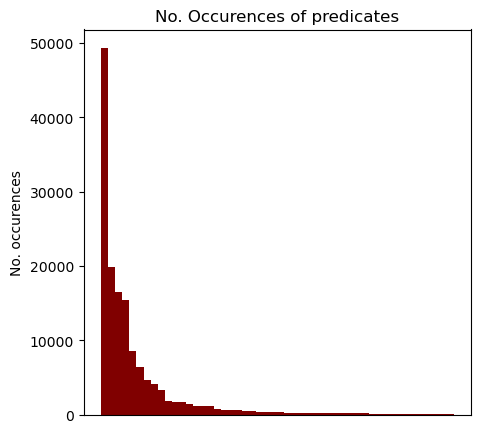

In [18]:
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import math

sorted_triplets = sorted(predicates.items(), key=lambda x:-x[1])
texts = [ " ".join(item[0]) for item in sorted_triplets]
counts = [item[1] for item in sorted_triplets]

fig = plt.figure(figsize = (5, 5))
 
# creating the bar plot
plt.bar(texts, counts, color ='maroon',
        width = 1)

ax = plt.gca()
ax.get_xaxis().set_visible(False)
plt.ylim()

plt.xlabel("Visual Relationship Triples")
plt.ylabel("No. occurences")
plt.title("No. Occurences of predicates")

plt.show()

#### Helper functions for saving and loading clip predictions

In [12]:
import os

def save_predictions(predictions, name, output_path='./models/relation_danfeiX_FPN50/inference/openclip/', subdir=''):
    torch.save(predictions, os.path.join(output_path, subdir, name))

def load_predictions(name, path='./models/relation_danfeiX_FPN50/inference/openclip/', subdir=''):
    return torch.load(os.path.join(path, subdir, name))

#### Perform Predictions with OpenCLIP

In [14]:
# class sentences
def get_sentence_from_cls(cls):
    CLIP_OBJ_CLS_SENTENCE = '{} {}'
    vowels = ['a','e','i','o','u']
    
    if (cls[0] in vowels):
        return CLIP_OBJ_CLS_SENTENCE.format('an', cls)
    return CLIP_OBJ_CLS_SENTENCE.format('a', cls)

# classes = list(class_to_ind.keys())
# classes.remove('__background__')
class_sentences=[get_sentence_from_cls(ind_to_class[key]) for key in range(len(ind_to_class))]
class_sentences.pop(0)
print()

In [15]:
from collections import defaultdict
from open_clip import ClipLoss

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu") 

def get_clip_predictions(model, checkpoint=None):
    # A generated prediction for CLIP
    clip_predictions = defaultdict(list)
    if (checkpoint):
        clip_predictions = checkpoint

    N_rel=len(relation_to_ind)
    N_objs=len(class_to_ind)
    triplets_to_img_key = defaultdict(set)
    img_key_to_triplets = {}
    idx = -1

    for image_key, gt_boxlist in gt_dicts.items():
        idx += 1
        
        if (idx in clip_predictions):
            continue

        ## Get the ground truth triplets
        gt_classes = gt_boxlist.get_field("labels").cpu()
        gt_boxes = gt_boxlist.bbox.cpu()
        gt_rels = gt_boxlist.get_field("pred_labels").cpu()

        gt_boxes = gt_boxes.numpy()
        num_gt_boxes = gt_boxes.shape[0]
        gt_relations = gt_rels.nonzero(as_tuple=False).numpy()
        gt_classes = gt_classes.view(-1, 1).numpy()

        gt_rels_view = gt_rels.contiguous().view(-1)
        gt_pred_labels = gt_rels_view[gt_rels_view.nonzero(as_tuple=False).squeeze()].contiguous().view(-1, 1).numpy()

        num_gt_relations = gt_relations.shape[0]
        if num_gt_relations == 0:
            continue

        gt_class_scores = np.ones(num_gt_boxes)
        gt_predicate_scores = np.ones(num_gt_relations)

        gt_triplets, gt_triplet_boxes, _ = _triplet(gt_pred_labels,
                                                    gt_relations,
                                                    gt_classes,
                                                    gt_boxes,
                                                    gt_predicate_scores,
                                                    gt_class_scores)
        gt_union_boxes = boxes_union(gt_triplet_boxes[:,:4], gt_triplet_boxes[:,4:])

        # Match image key to triplet
#         img_key_to_triplets[idx] = gt_triplets
#         for triplet in gt_triplets:
#             triplets_to_img_key[tuple(triplet)].add(idx)

        # Get Image
        image = dataset.get_image(idx)
    #     display(image)

    #     for indd, obj_box in enumerate(gt_boxes):
    #         cropped_image = image.crop((obj_box[0],obj_box[1],obj_box[2],obj_box[3]))
    #         preprocessed_img = preprocess(cropped_image).unsqueeze(0)
    #         image_features = model.encode_image(preprocessed_img)
    #         image_features /= image_features.norm(dim=-1, keepdim=True)
    #         text_probs = (100.0 * image_features @ text_features.T).softmax(dim=-1)
    #         _, most_likely_sentences = torch.topk(text_probs, 5, dim=1)

    #         print("Prediction: ", [class_sentences[most_likely_sentence.item()] for most_likely_sentence in most_likely_sentences[0]])
    #         print("Ground Truth Class: ", ind_to_class[gt_classes[indd].item()])
    #         display((cropped_image))

        for indd, box_union in enumerate(gt_union_boxes):
            # Preprocess cropped image
            cropped_image = image.crop((box_union[0],box_union[1],box_union[2],box_union[3]))
            preprocessed_img = model.preprocess(cropped_image).unsqueeze(0).to(device)

            # Preprocess triplets 
            triplet = gt_triplets[indd]
            pair = (triplet[0], triplet[2])
            triplet_sentences = get_sentences_from_pair(pair) # without background
            tokenized_triplet_sentences = open_clip.tokenize(triplet_sentences).to(device)
            
            # Performing inferences
            with torch.no_grad(), torch.cuda.amp.autocast():
                
                # relation head
                image_features, text_features, _ = model(preprocessed_img, tokenized_triplet_sentences)
                
                text_features /= text_features.norm(dim=-1, keepdim=True)
                image_features /= image_features.norm(dim=-1, keepdim=True)

                text_probs = (100.0 * image_features @ text_features.T).softmax(dim=-1)

            clip_predictions[image_key].append(text_probs.to('cpu'))

        if (idx % 100 == 1):
            print("Current Iteration: ", idx)
            
    return clip_predictions

In [16]:
# preparing CLIP Model
def evaluate_clip(model_name, pretrained_model_name, checkpoint_name=None):    
    model = XEntLoss(
        model_name=model_name,
        pretrained_model = pretrained_model_name,
        local_loss=True,
        cache_labels=True,
        rank=0,
        world_size=1,
        use_horovod=False).to(device)
    model.to(device)
    model.eval()
    
    for param in model.parameters():
        param.requires_grad = False   
    
    if (checkpoint_name):
        chkpnt = get_model_checkpoint(checkpoint_name)
        model.load_state_dict(chkpnt['model_state_dict'])
    
    clip_predictions = get_clip_predictions(model)
    save_predictions(clip_predictions, 'attn_{}_{}'.format(model_name, checkpoint_name))

In [161]:
# Iterate through a bunch of pre-trained model to test

OPEN_CLIP_MODELS = [
    ('ViT-B-16','laion400m_e32', 'attn_finetuned_two_ViT-B-16_laion400m_e32.pt'),
    ('ViT-B-32','laion400m_e32', 'attn_finetuned_two_ViT-B-32_laion400m_e32.pt'),
    ('ViT-B-32','laion2b_s34b_b79k','attn_finetuned_two_ViT-B-32_laion2b_s34b_b79k.pt'),
    ('ViT-L-14','laion2b_s32b_b82k', 'attn_finetuned_two_ViT-L-14_laion2b_s32b_b82k.pt'),
    ('ViT-L-14','laion400m_e32', 'attn_finetuned_two_ViT-L-14_laion400m_e32.pt'), # this has not been tested
    ('ViT-H-14','laion2b_s32b_b79k', 'attn_finetuned_two_ViT-H-14_laion2b_s32b_b79k.pt')
]

# OPEN_CLIP_MODELS = [
# #     ('ViT-B-32','laion400m_e32', 'attn_finetuned_ViT-B-32_laion400m_e32_final_it_60783.pt'),
# #     ('ViT-B-32','laion400m_e32', 'attn_rand_neg_finetuned_ViT-B-32_laion400m_e32_it_59994.pt'),
#     ('ViT-B-32','laion400m_e32', 'attn_finetuned_ViT-B-32_laion400m_e32_it_49995.pt'),    
# ]

for model_num in range(len(OPEN_CLIP_MODELS)):
    model_name, pretrained_name, checkpoint_name = OPEN_CLIP_MODELS[model_num]
    evaluate_clip(model_name, pretrained_name, checkpoint_name)

Current Iteration:  1
Current Iteration:  101
Current Iteration:  201
Current Iteration:  301
Current Iteration:  401
Current Iteration:  501
Current Iteration:  601
Current Iteration:  701
Current Iteration:  801
Current Iteration:  901
Current Iteration:  1001
Current Iteration:  1101
Current Iteration:  1201
Current Iteration:  1301
Current Iteration:  1401
Current Iteration:  1501
Current Iteration:  1601
Current Iteration:  1701
Current Iteration:  1801
Current Iteration:  1901
Current Iteration:  2001
Current Iteration:  2101
Current Iteration:  2201
Current Iteration:  2301
Current Iteration:  2401
Current Iteration:  2501
Current Iteration:  2601
Current Iteration:  2701
Current Iteration:  2801
Current Iteration:  2901
Current Iteration:  3001
Current Iteration:  3101
Current Iteration:  3201
Current Iteration:  3301
Current Iteration:  3401
Current Iteration:  3501
Current Iteration:  3601
Current Iteration:  3701
Current Iteration:  3801
Current Iteration:  3901
Current Iter

Current Iteration:  5801
Current Iteration:  5901
Current Iteration:  6001
Current Iteration:  6101
Current Iteration:  6201
Current Iteration:  6301
Current Iteration:  6401
Current Iteration:  6501
Current Iteration:  6601
Current Iteration:  6701
Current Iteration:  6801
Current Iteration:  6901
Current Iteration:  7001
Current Iteration:  7101
Current Iteration:  7201
Current Iteration:  7301
Current Iteration:  7401
Current Iteration:  7501
Current Iteration:  7601
Current Iteration:  7701
Current Iteration:  7801
Current Iteration:  7901
Current Iteration:  8001
Current Iteration:  8101
Current Iteration:  8201
Current Iteration:  8301
Current Iteration:  8401
Current Iteration:  8501
Current Iteration:  8601
Current Iteration:  8701
Current Iteration:  8801
Current Iteration:  8901
Current Iteration:  9001
Current Iteration:  9101
Current Iteration:  9201
Current Iteration:  9301
Current Iteration:  9401
Current Iteration:  9501
Current Iteration:  9601
Current Iteration:  9701


Current Iteration:  11501
Current Iteration:  11601
Current Iteration:  11701
Current Iteration:  11801
Current Iteration:  11901
Current Iteration:  12001
Current Iteration:  12101
Current Iteration:  12201
Current Iteration:  12301
Current Iteration:  12401
Current Iteration:  12501
Current Iteration:  12601
Current Iteration:  12701
Current Iteration:  12801
Current Iteration:  12901
Current Iteration:  13001
Current Iteration:  13101
Current Iteration:  13201
Current Iteration:  13301
Current Iteration:  13401
Current Iteration:  13501
Current Iteration:  13601
Current Iteration:  13701
Current Iteration:  13801
Current Iteration:  13901
Current Iteration:  14001
Current Iteration:  14101
Current Iteration:  14201
Current Iteration:  14301
Current Iteration:  14401
Current Iteration:  14501
Current Iteration:  14601
Current Iteration:  14701
Current Iteration:  14801
Current Iteration:  14901
Current Iteration:  15001
Current Iteration:  15101
Current Iteration:  15201
Current Iter

Current Iteration:  17001
Current Iteration:  17101
Current Iteration:  17201
Current Iteration:  17301
Current Iteration:  17401
Current Iteration:  17501
Current Iteration:  17601
Current Iteration:  17701
Current Iteration:  17801
Current Iteration:  17901
Current Iteration:  18001
Current Iteration:  18101
Current Iteration:  18201
Current Iteration:  18301
Current Iteration:  18401
Current Iteration:  18501
Current Iteration:  18601
Current Iteration:  18701
Current Iteration:  18801
Current Iteration:  18901
Current Iteration:  19001
Current Iteration:  19101
Current Iteration:  19201
Current Iteration:  19301
Current Iteration:  19401
Current Iteration:  19501
Current Iteration:  19601
Current Iteration:  19701
Current Iteration:  19801
Current Iteration:  19901
Current Iteration:  20001
Current Iteration:  20101
Current Iteration:  20201
Current Iteration:  20301
Current Iteration:  20401
Current Iteration:  20501
Current Iteration:  20601
Current Iteration:  20701
Current Iter

Current Iteration:  22501
Current Iteration:  22601
Current Iteration:  22701
Current Iteration:  22801
Current Iteration:  22901
Current Iteration:  23001
Current Iteration:  23101
Current Iteration:  23201
Current Iteration:  23301
Current Iteration:  23401
Current Iteration:  23501
Current Iteration:  23601
Current Iteration:  23701
Current Iteration:  23801
Current Iteration:  23901
Current Iteration:  24001
Current Iteration:  24101
Current Iteration:  24201
Current Iteration:  24301
Current Iteration:  24401
Current Iteration:  24501
Current Iteration:  24601
Current Iteration:  24701
Current Iteration:  24801
Current Iteration:  24901
Current Iteration:  25001
Current Iteration:  25101
Current Iteration:  25201
Current Iteration:  25301
Current Iteration:  25401
Current Iteration:  25501
Current Iteration:  25601
Current Iteration:  25701
Current Iteration:  25801
Current Iteration:  25901
Current Iteration:  26001
Current Iteration:  26101
Current Iteration:  26201
Current Iter

In [23]:
evaluate_clip('ViT-B-32', 'laion400m_e32', 'finetuned_ViT-B-32_laion400m_e32_it_19999.pt')

Current Iteration:  1
Current Iteration:  101
Current Iteration:  201
Current Iteration:  301
Current Iteration:  401
Current Iteration:  501
Current Iteration:  601
Current Iteration:  701
Current Iteration:  801
Current Iteration:  901
Current Iteration:  1001
Current Iteration:  1101
Current Iteration:  1201
Current Iteration:  1301
Current Iteration:  1401
Current Iteration:  1501
Current Iteration:  1601
Current Iteration:  1701
Current Iteration:  1801
Current Iteration:  1901
Current Iteration:  2001
Current Iteration:  2101
Current Iteration:  2201
Current Iteration:  2301
Current Iteration:  2401
Current Iteration:  2501
Current Iteration:  2601
Current Iteration:  2701
Current Iteration:  2801
Current Iteration:  2901
Current Iteration:  3001
Current Iteration:  3101
Current Iteration:  3201
Current Iteration:  3301
Current Iteration:  3401
Current Iteration:  3501
Current Iteration:  3601
Current Iteration:  3701
Current Iteration:  3801
Current Iteration:  3901
Current Iter

# Visualizing attention maps

1/ https://github.com/hila-chefer/Transformer-MM-Explainability

  1.1/ This might involves changes to the Transformer Model in Open CLIP
  
  1.2/ Just copy the code from Google Colab over

# Evaluating CLIP Models

In [17]:
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.preprocessing import label_binarize

triplets_to_img_key = defaultdict(set)
img_key_to_triplets = {}

def _evaluate_clip_predictions(clip_predictions, top_k=1, triplets_to_img_key=triplets_to_img_key, img_key_to_triplets=img_key_to_triplets):
    """
        Evaluate clip predictions and return 
    """
    N_rel=len(relation_to_ind)
    N_objs=len(class_to_ind)
    
    confusion_matrix = defaultdict(int)
    
    num_gt = 0
    idx = -1
    
    result_dict = {}
    result_dict['recall'] = {20: [], 50: [], 100: []}

    for image_key, gt_boxlist in gt_dicts.items():
        idx += 1
        
        if (idx in clip_predictions):
            continue

        ## Get the ground truth triplets
        gt_classes = gt_boxlist.get_field("labels").cpu()
        gt_boxes = gt_boxlist.bbox.cpu()
        gt_rels = gt_boxlist.get_field("pred_labels").cpu()

        gt_boxes = gt_boxes.numpy()
        num_gt_boxes = gt_boxes.shape[0]
        gt_relations = gt_rels.nonzero(as_tuple=False).numpy()
        gt_classes = gt_classes.view(-1, 1).numpy()

        gt_rels_view = gt_rels.contiguous().view(-1)
        gt_pred_labels = gt_rels_view[gt_rels_view.nonzero(as_tuple=False).squeeze()].contiguous().view(-1, 1).numpy()

        num_gt_relations = gt_relations.shape[0]
        if num_gt_relations == 0:
            continue

        gt_class_scores = np.ones(num_gt_boxes)
        gt_predicate_scores = np.ones(num_gt_relations)

        gt_triplets, gt_triplet_boxes, _ = _triplet(gt_pred_labels,
                                                    gt_relations,
                                                    gt_classes,
                                                    gt_boxes,
                                                    gt_predicate_scores,
                                                    gt_class_scores)
        
        
        img_key_to_triplets[idx] = gt_triplets
        for triplet in gt_triplets:
            triplets_to_img_key[tuple(triplet)].add(idx)
            
        #clip score
        text_score = clip_predictions[image_key]
        
        #iterate through triplets and evaluate and fill in the confusion matrix
        gt_ind = 0
        correct_predictions = 0
        for gt_triplet, gt_box in zip(gt_triplets, gt_triplet_boxes):
            #compute confusion matrix and traditional recall metric
            _, top_preds = torch.topk(text_score[gt_ind], top_k, dim=1)
            
            # iterate through all predictions to compute confusion matrix
            pred_triplet = gt_triplet.copy()
            for pred_pred in top_preds[0]:
                pred_triplet[1] = pred_pred.item() + 1
                
                # Printout                
                confusion_matrix[(tuple(gt_triplet), tuple(pred_triplet))] += 1
            
            # if one correct, it is counted as correct
            if (gt_triplet[1] - 1 in top_preds[0]):
                correct_predictions +=1

            gt_ind += 1
        
        num_gt += gt_triplets.shape[0]
        for k in result_dict['recall'].keys():
            result_dict['recall'][k].append(correct_predictions/gt_triplets.shape[0])

    return confusion_matrix, result_dict, num_gt

    
def evaluate_clip_predictions(model_name, pretrained_model_name, predictions_name=None):
    """
        Evaluate CLIP predictions based on model name and the pretrained model name
    """
    predictions_path = '{}_{}.pt'.format(model_name, pretrained_model_name) if predictions_name is None else predictions_name
    clip_predictions = load_predictions(predictions_path)
    
    confusion_matrix, result_dict, num_gt = _evaluate_clip_predictions(clip_predictions, top_k=1)
    
    print("{}-{} recall@20: ".format(model_name, pretrained_model_name), np.mean(np.array(result_dict['recall'][20])))
                  
    return (confusion_matrix, result_dict, num_gt)

In [18]:
# confusion_matrix, result_dict, num_gt = evaluate_clip_predictions('ViT-B-32', 'laion400m_e32','attn_ViT-B-32_laion400m_e32.pt')

In [19]:
# confusion_matrix, result_dict, num_gt = evaluate_clip_predictions('ViT-B-32', 'laion400m_e32','non_rand_attn_ViT-B-32_laion400m_e32.pt')

In [26]:
# Iterate through a bunch of pre-trained model to test
# OPEN_CLIP_PRETRAINED_DATASETS = ['openai', 'openai', 'laion400m_e32', 'laion400m_e32', 'laion2b_s34b_b79k', 'laion400m_e32', 'laion2b_s32b_b82k', 'laion2b_s32b_b79k']
# OPEN_CLIP_MODELS = ['RN50', 'RN101', 'ViT-B-16', 'ViT-B-32', 'ViT-B-32', 'ViT-L-14', 'ViT-L-14', 'ViT-H-14']

all_confusion_matrices = {}
OPEN_CLIP_MODELS = [
    ('ViT-B-16','laion400m_e32', 'attn_ViT-B-16_attn_finetuned_two_ViT-B-16_laion400m_e32.pt'),
    ('ViT-B-32','laion400m_e32', 'attn_ViT-B-32_attn_finetuned_two_ViT-B-32_laion400m_e32.pt'),
    ('ViT-B-32','laion2b_s34b_b79k','attn_ViT-B-32_attn_finetuned_two_ViT-B-32_laion2b_s34b_b79k.pt'),
    ('ViT-L-14','laion2b_s32b_b82k', 'attn_ViT-L-14_attn_finetuned_two_ViT-L-14_laion2b_s32b_b82k.pt'),
    ('ViT-L-14','laion400m_e32', 'attn_ViT-L-14_attn_finetuned_two_ViT-L-14_laion400m_e32.pt'), # this has not been tested
    ('ViT-H-14','laion2b_s32b_b79k', 'attn_ViT-H-14_attn_finetuned_two_ViT-H-14_laion2b_s32b_b79k.pt')
]
for model_name, model_dataset, pred_checkpoint in OPEN_CLIP_MODELS:
    
    confusion_matrix, result_dict, num_gt = evaluate_clip_predictions(model_name, model_dataset, pred_checkpoint)
    
    all_confusion_matrices[f'{model_name}_{model_dataset}'] = confusion_matrix

ViT-B-16-laion400m_e32 recall@20:  0.5905062386310245
ViT-B-32-laion400m_e32 recall@20:  0.5978513568436515
ViT-B-32-laion2b_s34b_b79k recall@20:  0.5998542757143562
ViT-L-14-laion2b_s32b_b82k recall@20:  0.6196236979004778
ViT-L-14-laion400m_e32 recall@20:  0.6183513749866562
ViT-H-14-laion2b_s32b_b79k recall@20:  0.6305874033987736


# Evaluate Scene Graph Benchmark Models

In [21]:
#Visualize examples that are incorrect
from collections import defaultdict
import copy

def _get_confusion_matrix_from_sg_benchmark(predict_dicts={}, threshold_test=None):

    N_rel=len(relation_to_ind)
    N_objs=len(class_to_ind)

    idx = -1
            
    confusion_matrix = defaultdict(int) # key: (subj_gt, pred_gt, obj_gt, subj_pred, pred_pred, obj_pred)
    max_predicate_ind = 0
    max_gt_ind = 0
    
    for image_key, gt_boxlist in gt_dicts.items():
        idx += 1
        sg_prediction = predict_dicts[image_key]

        
        ## Get the ground truth triplets
        gt_classes = gt_boxlist.get_field("labels").cpu()
        gt_boxes = gt_boxlist.bbox.cpu()
        gt_rels = gt_boxlist.get_field("pred_labels").cpu()

        gt_boxes = gt_boxes.numpy()
        num_gt_boxes = gt_boxes.shape[0]
        gt_relations = gt_rels.nonzero(as_tuple=False).numpy()
        gt_classes = gt_classes.view(-1, 1).numpy()

        gt_rels_view = gt_rels.contiguous().view(-1)
        gt_pred_labels = gt_rels_view[gt_rels_view.nonzero(as_tuple=False).squeeze()].contiguous().view(-1, 1).numpy()

        num_gt_relations = gt_relations.shape[0]
        if num_gt_relations == 0:
            continue

        gt_class_scores = np.ones(num_gt_boxes)
        gt_predicate_scores = np.ones(num_gt_relations)

        gt_triplets, gt_triplet_boxes, _ = _triplet(gt_pred_labels,
                                                    gt_relations,
                                                    gt_classes,
                                                    gt_boxes,
                                                    gt_predicate_scores,
                                                    gt_class_scores)

        # Match image key to triplet
        img_key_to_triplets[idx] = gt_triplets
        for triplet in gt_triplets:
            triplets_to_img_key[tuple(triplet)].add(idx)

        ## Predictions
        obj_rois = sg_prediction['bboxes']
        obj_scores = sg_prediction['bbox_scores']
        obj_labels = sg_prediction['bbox_labels']
        rel_inds = sg_prediction['relation_pairs']
        rel_scores = sg_prediction['relation_scores_all']

        box_preds = obj_rois.numpy()
        num_boxes = box_preds.shape[0]

        predicate_preds = rel_scores.numpy()

        # no bg
        predicate_preds = predicate_preds[:, 1:]
        predicates = np.argmax(predicate_preds, 1).ravel() + 1
        predicate_scores = predicate_preds.max(axis=1).ravel()

        relations = rel_inds.numpy()

        assert (predicates.shape[0] == relations.shape[0])
        num_relations = relations.shape[0]
        # Asumming predcls for this mode
        # if predicate classification task
        # use ground truth bounding boxes
        assert (num_boxes == num_gt_boxes)
        classes = gt_classes
        class_scores = gt_class_scores
        boxes = gt_boxes

        pred_triplets, pred_triplet_boxes, relation_scores = \
            _triplet(predicates, relations, classes, boxes,
                     predicate_scores, class_scores, is_pred=False)

        max_predicate_ind = min(max_predicate_ind, min([it[1] for it in pred_triplets]))
        max_gt_ind = min(max_gt_ind, min([it[1] for it in gt_triplets]))

        #sort indices
        obj_scores = sg_prediction['bbox_scores'].numpy()
        all_rels = sg_prediction['relation_pairs'].numpy()
        fp_pred = sg_prediction['relation_scores_all'].numpy()

        scores = np.column_stack((
            obj_scores[all_rels[:, 0]],
            obj_scores[all_rels[:, 1]],
            fp_pred[:, 1:].max(1)
        )).prod(1)
        sorted_inds = np.argsort(-scores)
        sorted_inds = sorted_inds[scores[sorted_inds] > 0]  # [:100]            
        
        # keep top 5
#         k = len(gt_triplets)
#         this_k = min(k, num_relations)
#         keep_inds = sorted_inds[:this_k]

        pred_triplets = pred_triplets
        pred_triplet_boxes = pred_triplet_boxes
        # Filling in the confusion matrix
        for gt_triplet, gt_box in zip(gt_triplets, gt_triplet_boxes):
            keep = np.zeros(pred_triplets.shape[0]).astype(bool)
            for pred_triplet, pred_box in zip(pred_triplets, pred_triplet_boxes):
                if (gt_triplet[0] == pred_triplet[0] and gt_triplet[2] == pred_triplet[2]):
                    pred_sub_box = np.expand_dims(pred_box[:4], axis=0)
                    pred_obj_box = np.expand_dims(pred_box[4:], axis=0)
                    sub_iou = iou(gt_box[:4], pred_sub_box)
                    obj_iou = iou(gt_box[4:], pred_obj_box)
                    inds = np.intersect1d(np.where(sub_iou >= 0.5)[0],
                                                  np.where(obj_iou >= 0.5)[0])
                    if (inds.size > 0):
                        confusion_matrix[(tuple(gt_triplet), tuple(pred_triplet))] += 1
                        
                        break
        
    return confusion_matrix

def get_confusion_matrix_from_sg_benchmark(model_name, predictions_path):
    default_benchmark_path = './models/'
    
    #Get predicted results from scene graph benchmark models
    if ('.tsv' in predictions_path):
        benchmark_predictions = prepare_vrd_predictions(predictions_path, dataset.labelmap)
    else:
        output_tsv_path = os.path.split(predictions_path)[0]
        output_tsv_name = 'predictions.tsv'

        #convert predictions to tsv
        convert_predictions_to_tsv(
            predictions, dataset, output_tsv_path,
            data_subset=cfg.TEST.TSV_SAVE_SUBSET,
            labelmap_file=labelmap_file,
            output_tsv_name=output_tsv_name,
            relation_on=cfg.MODEL.RELATION_ON)
        
        benchmark_predictions = prepare_vrd_predictions(os.path.join(output_tsv_path, output_tsv_name), dataset.labelmap)
    
    
    # Call eval function to get the relevant ROC results
    confusion_matrix = _get_confusion_matrix_from_sg_benchmark(benchmark_predictions)
    
    return confusion_matrix

In [34]:
SCENE_GRAPH_BENCHMARK_MODELS = [
    ('baseline_replicated', 'models/relation_danfeiX_FPN50/benchmarks/baseline_replicated/predictions.tsv'),
    ('grcnn_bias', 'models/relation_danfeiX_FPN50/benchmarks/grcnn_bias/predictions.tsv'),
    ('grcnn_no_bias', 'models/relation_danfeiX_FPN50/benchmarks/grcnn_no_bias/predictions.tsv'),
    ('imp_bias', 'models/relation_danfeiX_FPN50/benchmarks/imp_bias/predictions.tsv'),
    ('imp_no_bias', 'models/relation_danfeiX_FPN50/benchmarks/imp_no_bias/predictions.tsv'),
    ('msdn_bias', 'models/relation_danfeiX_FPN50/benchmarks/msdn_bias/predictions.tsv'),
    ('msdn_no_bias', 'models/relation_danfeiX_FPN50/benchmarks/msdn_no_bias/predictions.tsv'),
#     ('nm_bias', 'models/relation_danfeiX_FPN50/benchmarks/nm_bias/predictions.tsv'),
    ('nm_no_bias', 'models/relation_danfeiX_FPN50/benchmarks/nm_no_bias/predictions.tsv')
]

for benchmark in SCENE_GRAPH_BENCHMARK_MODELS:
    model_name, prediction_file_path = benchmark
    print("Evaluating model {} at path {}".format(model_name, prediction_file_path))
    result_dict_roc = get_confusion_matrix_from_sg_benchmark(model_name, prediction_file_path)
    all_confusion_matrices[model_name] = copy.deepcopy(result_dict_roc)
    print()


Evaluating model baseline_replicated at path models/relation_danfeiX_FPN50/benchmarks/baseline_replicated/predictions.tsv

Evaluating model grcnn_bias at path models/relation_danfeiX_FPN50/benchmarks/grcnn_bias/predictions.tsv

Evaluating model grcnn_no_bias at path models/relation_danfeiX_FPN50/benchmarks/grcnn_no_bias/predictions.tsv

Evaluating model imp_bias at path models/relation_danfeiX_FPN50/benchmarks/imp_bias/predictions.tsv

Evaluating model imp_no_bias at path models/relation_danfeiX_FPN50/benchmarks/imp_no_bias/predictions.tsv

Evaluating model msdn_bias at path models/relation_danfeiX_FPN50/benchmarks/msdn_bias/predictions.tsv

Evaluating model msdn_no_bias at path models/relation_danfeiX_FPN50/benchmarks/msdn_no_bias/predictions.tsv

Evaluating model nm_no_bias at path models/relation_danfeiX_FPN50/benchmarks/nm_no_bias/predictions.tsv



### Prevalence

In [27]:
from collections import defaultdict

class_occurences = defaultdict(int)
prevalence = {}
all_occurences = 0

for key, images in triplets_to_img_key.items():
    all_occurences += len(images)
    class_occurences[key[1]] += len(images)

for key, occurences in class_occurences.items():
    prevalence[key] = occurences / all_occurences

In [37]:
all_occurences

113862

### Recall by individual classes

In [28]:
def _split_confusion_matrix_by_class(confusion_matrix):
    # Compute TPR and FPR for each individual class
    _true_negative = defaultdict(int)
    _false_negative = defaultdict(int)
    _true_positive = defaultdict(int)
    _false_positive = defaultdict(int)
    
    for ind in range(51):
        for key, value in confusion_matrix.items():
            if (key[0] == ind and key[1] == ind):
                _true_positive[ind] += value
            elif (key[0] != ind and key[1] == ind):
                _false_positive[ind] += value
            elif (key[0] == ind and key[1] != ind):
                _false_negative[ind] += value
            else:
                _true_negative[ind] += value
                
    confusion_matrix_by_class = {
        "tp":_true_positive, 
        "tn": _true_negative,
        "fp": _false_positive,
        "fn": _false_negative
    }
    return confusion_matrix_by_class

In [29]:
all_confusion_matrices_by_class = {}

for model_name, predictions in all_confusion_matrices.items():
    new_confusion_matrix = defaultdict(int)
    for pairs, occurences in predictions.items():
        new_confusion_matrix[(pairs[0][1], pairs[1][1])] += occurences
        
    all_confusion_matrices_by_class[model_name] = _split_confusion_matrix_by_class(new_confusion_matrix)

In [30]:
all_confusion_matrices_by_class.keys()

dict_keys(['ViT-B-16_laion400m_e32', 'ViT-B-32_laion400m_e32', 'ViT-B-32_laion2b_s34b_b79k', 'ViT-L-14_laion2b_s32b_b82k', 'ViT-L-14_laion400m_e32', 'ViT-H-14_laion2b_s32b_b79k'])

### Recall and Percision for individual class

In [55]:
import matplotlib.pyplot  as plt

all_recalls = defaultdict(list)
all_percisions = defaultdict(list)
mRecall = defaultdict(int)
mPercision = defaultdict(int)
Recalls=defaultdict(int)


for model_name, confusion_matrix in all_confusion_matrices_by_class.items():
    macro_tp = 0
    macro_true_labels = 0
    
    for i in range(1, 51):
        tp = confusion_matrix['tp'][i]
        fn = confusion_matrix['fn'][i]
        fp = confusion_matrix['fp'][i]
        macro_tp=macro_tp+tp
        macro_true_labels= macro_true_labels+tp+fn
        
        all_recalls[model_name].append((ind_to_relation[i], tp/(tp+fn), prevalence[i]))
        all_percisions[model_name].append((ind_to_relation[i], tp/(tp+fp + 1), prevalence[i]))
        mRecall[model_name] += tp/(tp+fn)
        mPercision[model_name] += tp/(tp + fp + 0.001)

    Recalls[model_name] = macro_tp/macro_true_labels
    mRecall[model_name] = mRecall[model_name]/50
    mPercision[model_name] = mPercision[model_name]/50



In [57]:
mRecall

defaultdict(int,
            {'ViT-B-16_laion400m_e32': 0.09258356030198214,
             'ViT-B-32_laion400m_e32': 0.09606864207709777,
             'ViT-B-32_laion2b_s34b_b79k': 0.10416893914184816,
             'ViT-L-14_laion2b_s32b_b82k': 0.11011187852220759,
             'ViT-L-14_laion400m_e32': 0.10452228089408183,
             'ViT-H-14_laion2b_s32b_b79k': 0.1175057170744702,
             'baseline_replicated': 0.11906646086488193,
             'grcnn_bias': 0.16605576695503196,
             'grcnn_no_bias': 0.1376753728072239,
             'imp_bias': 0.12220358057868433,
             'imp_no_bias': 0.1686404710502642,
             'msdn_bias': 0.15922429750410874,
             'msdn_no_bias': 0.15071339040802267,
             'nm_no_bias': 0.11207525464174653})

### InformedNess

In [22]:
all_confusion_matrices_by_class = torch.load("all_confusion_matrices_by_class_new.pth")

In [23]:
#torch.save(informedness_results,'informedness_results_new.pth')

In [24]:
informedness_results = torch.load('informedness_results_new.pth')

In [18]:
from collections import defaultdict

# compute bias weighted
bias_weighted = defaultdict(dict)
for model_name, confusion_matrix in all_confusion_matrices_by_class.items():
    for i in range(1, 51):
        bias_weighted[i][model_name] = (confusion_matrix['tp'][i] + confusion_matrix['fp'][i]) / (confusion_matrix['tp'][i] + confusion_matrix['fp'][i] + confusion_matrix['tn'][i] + confusion_matrix['fn'][i])

#### ALL MODELS

In [61]:
# Calculate Default Informedness
bias_weighted_informedness = defaultdict(float)
for relation, val in informedness_results.items():
    for model_name, val2 in val.items():
        bias_weighted_informedness[model_name] += bias_weighted[relation][model_name] * val2["default"]

bias_weighted_informedness

defaultdict(float,
            {'ViT-B-16_laion400m_e32': 0.6206179892503948,
             'ViT-B-32_laion2b_s34b_b79k': 0.6382795982580378,
             'ViT-B-32_laion400m_e32': 0.6342726287981362,
             'ViT-L-14_laion400m_e32': 0.6558495709991138,
             'ViT-L-14_laion2b_s32b_b82k': 0.6579366076490266,
             'ViT-H-14_laion2b_s32b_b79k': 0.6676553369632405,
             'grcnn_no_bias': 0.5264243174247849,
             'imp_no_bias': 0.59102768533763,
             'msdn_no_bias': 0.5905538068667796,
             'nm_no_bias': 0.6595165861163894,
             'grcnn_bias': 0.6577940352982358,
             'imp_bias': 0.6411744619508636,
             'msdn_bias': 0.6622071978209831,
             'baseline_replicated': 0.6806928279819161})

In [19]:
# Calculate Optimized Informedness
bias_weighted_informedness = defaultdict(float)
for relation, val in informedness_results.items():
    for model_name, val2 in val.items():
        bias_weighted_informedness[model_name] += bias_weighted[relation][model_name] * val2["optimized"]

bias_weighted_informedness

defaultdict(float,
            {'ViT-B-16_laion400m_e32': 0.6487239117889293,
             'ViT-B-32_laion2b_s34b_b79k': 0.6567038578602444,
             'ViT-B-32_laion400m_e32': 0.6632406675330496,
             'ViT-L-14_laion400m_e32': 0.6882476221494113,
             'ViT-L-14_laion2b_s32b_b82k': 0.6891960066640826,
             'ViT-H-14_laion2b_s32b_b79k': 0.7040839028921319,
             'grcnn_no_bias': 0.5768452136716913,
             'imp_no_bias': 0.6387662210275613,
             'msdn_no_bias': 0.6293594849066819,
             'nm_no_bias': 0.6823015966703913,
             'grcnn_bias': 0.7077049889929592,
             'imp_bias': 0.707313911589387,
             'msdn_bias': 0.7191906888057208,
             'baseline_replicated': 0.7205979203011232})

### Plot Recall Percision Chart, Sorted by Occurences

In [60]:
import matplotlib.pyplot as plt

all_recalls = defaultdict(list)
all_percisions = defaultdict(list)
mRecall = defaultdict(int)
mPercision = defaultdict(int)

for model_name, confusion_matrix in all_confusion_matrices_by_class.items():
    for i in range(1, 51):
        tp = confusion_matrix['tp'][i]
        fn = confusion_matrix['fn'][i]
        fp = confusion_matrix['fp'][i]
        
        all_recalls[model_name].append((ind_to_relation[i], tp/(tp+fn), prevalence[i]))
        all_percisions[model_name].append((ind_to_relation[i], tp/(tp+fp + 1), prevalence[i]))
        mRecall[model_name] += tp/(tp+fn)
        mPercision[model_name] += tp/(tp + fp + 0.001)

    mRecall[model_name] = mRecall[model_name]/50
    mPercision[model_name] = mPercision[model_name]/50

KeyError: 1

In [174]:
sorted_recalls = defaultdict(list)

for model_name, recalls in all_recalls.items():
    sorted_recalls[model_name] = sorted(recalls,key=lambda x: -x[2])

In [175]:
class_names = [item[0] for item in sorted_recalls['ViT-B-16_laion400m_e32']]
prevalence = [item[2] for item in sorted_recalls['ViT-B-16_laion400m_e32']]

In [176]:
sorted_recalls.keys()

dict_keys(['ViT-B-16_laion400m_e32', 'ViT-B-32_laion400m_e32', 'ViT-B-32_laion2b_s34b_b79k', 'ViT-L-14_laion2b_s32b_b82k', 'ViT-L-14_laion400m_e32', 'ViT-H-14_laion2b_s32b_b79k'])

In [177]:
models = ['ViT-B-16_laion400m_e32', 'ViT-B-32_laion400m_e32', 'ViT-L-14_laion400m_e32', 'ViT-H-14_laion2b_s32b_b79k']

<Figure size 12000x600 with 0 Axes>

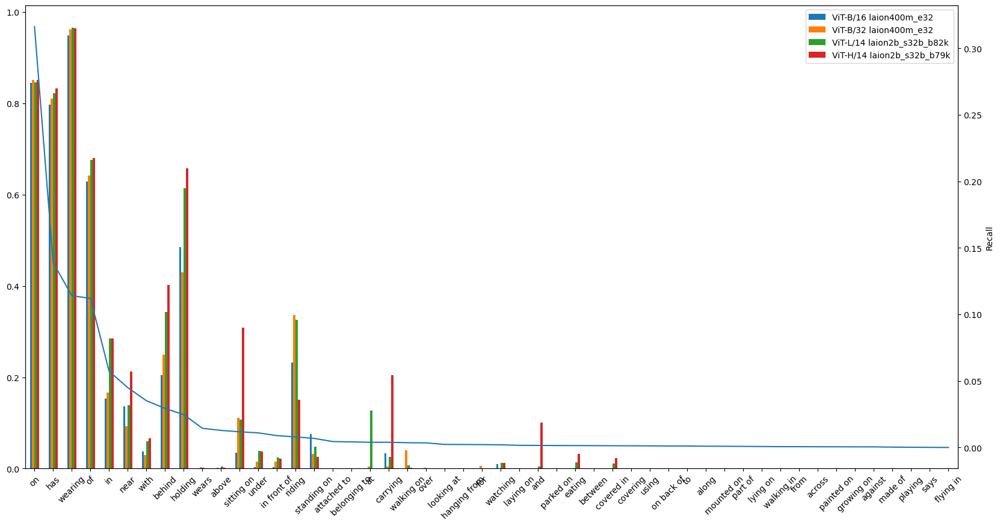

In [178]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from matplotlib.pyplot import figure

width = .5 # width of a bar
plt.figure(figsize=(120, 6))

m1_t = pd.DataFrame({
    'ViT-B/16 laion400m_e32': [item[1] for item in sorted_recalls['ViT-B-16_laion400m_e32']],
    'ViT-B/32 laion400m_e32': [item[1] for item in sorted_recalls['ViT-B-32_laion400m_e32']],
    'ViT-L/14 laion2b_s32b_b82k': [item[1] for item in sorted_recalls['ViT-L-14_laion2b_s32b_b82k']],
    'ViT-H/14 laion2b_s32b_b79k': [item[1] for item in sorted_recalls['ViT-H-14_laion2b_s32b_b79k']],
    'Prevalence': prevalence
})

m1_t[['ViT-B/16 laion400m_e32','ViT-B/32 laion400m_e32','ViT-L/14 laion2b_s32b_b82k', 'ViT-H/14 laion2b_s32b_b79k']].plot(kind='bar', width = width)
m1_t['Prevalence'].plot(secondary_y=True, figsize=(20,10), ylabel="Recall", rot=45)

plt.xticks(rotation=90)
ax = plt.gca()
plt.xlim([-width, len(m1_t['ViT-H/14 laion2b_s32b_b79k'])-width])
ax.set_xticklabels(class_names, rotation=90)
    
# ax.set_ylabel("Prevalence")
ax.figure.savefig('/home/thanhtran/dev/scene_graph_benchmark/models/visualizations/histogram.png', dpi=300)

# Plot ROC Multi-class

In [34]:
from sklearn.metrics import roc_curve, roc_auc_score, auc
from sklearn.preprocessing import label_binarize

In [35]:
# Initialize all_roc_results
all_roc_results = {}

In [36]:
all_confusion_matrices_by_class = torch.load('all_confusion_matrices_by_class_new.pth')
all_full_recall_by_relations = torch.load('all_full_recall_by_relations.pth')

### CLIP

In [37]:
# ROC Helper function for CLIP Models
def _evaluate_roc_clip_predictions(clip_predictions):
    relation_tpr = {}
    relation_fpr = {}
    relation_threshold = {}
    relation_roc_auc = {}
    results = {}
    
    # Aggregate clip predictions score by prediction class instead of individual image
    all_prediction_scores = np.array([])
    all_gt_labels = np.array([]) 
    
    for image_key, gt_boxlist in gt_dicts.items():
        
        # Get prediction scores
        text_score = torch.stack(clip_predictions[image_key]).squeeze(1).numpy()
        
        ## Get the ground truth triplets
        gt_classes = gt_boxlist.get_field("labels").cpu()
        gt_boxes = gt_boxlist.bbox.cpu()
        gt_rels = gt_boxlist.get_field("pred_labels").cpu()

        gt_boxes = gt_boxes.numpy()
        num_gt_boxes = gt_boxes.shape[0]
        gt_relations = gt_rels.nonzero(as_tuple=False).numpy()
        gt_classes = gt_classes.view(-1, 1).numpy()

        gt_rels_view = gt_rels.contiguous().view(-1)
        gt_pred_labels = gt_rels_view[gt_rels_view.nonzero(as_tuple=False).squeeze()].contiguous().view(-1, 1).numpy()

        num_gt_relations = gt_relations.shape[0]
        if num_gt_relations == 0:
            continue

        gt_class_scores = np.ones(num_gt_boxes)
        gt_predicate_scores = np.ones(num_gt_relations)

        gt_triplets, gt_triplet_boxes, _ = _triplet(gt_pred_labels,
                                                    gt_relations,
                                                    gt_classes,
                                                    gt_boxes,
                                                    gt_predicate_scores,
                                                    gt_class_scores)
        gt_relations = np.array([triplet[1] - 1 for triplet in gt_triplets])
        binarize_gt_relations = label_binarize(gt_relations, classes = [i for i in range(50)])
        
        all_gt_labels = np.vstack([all_gt_labels, binarize_gt_relations]) if all_gt_labels.size else binarize_gt_relations
        all_prediction_scores = np.vstack([all_prediction_scores, text_score]) if all_prediction_scores.size else text_score
    
    for i in range(all_gt_labels.shape[1]):
        relation_fpr[i], relation_tpr[i], relation_threshold[i] = roc_curve(all_gt_labels[:, i], all_prediction_scores[:, i])
        relation_roc_auc[i] = auc(relation_fpr[i], relation_tpr[i])
    
    relation_fpr["micro"], relation_tpr["micro"], relation_threshold["micro"] = roc_curve(all_gt_labels.ravel(), all_prediction_scores.ravel())
    relation_roc_auc["micro"] = auc(relation_fpr["micro"], relation_tpr["micro"])
    
    results['fpr'] = relation_fpr
    results['tpr'] = relation_tpr
    results['threshold'] = relation_threshold
    results['roc_auc'] = relation_roc_auc
    results['gt_labels'] = gt_relations
    results['pred_scores'] = all_prediction_scores
    
    return results
    
def evaluate_roc_clip_predictions(model_name, pretrained_model_name, prediction_path=None):
    """
        Evaluate CLIP predictions based on model name and the pretrained model name
    """
    if (prediction_path):
        clip_predictions = load_predictions(prediction_path)
    else:
        clip_predictions = load_predictions('{}_{}.pt'.format(model_name, pretrained_model_name))
    
    roc_result_dict = _evaluate_roc_clip_predictions(clip_predictions)
    
    return roc_result_dict

In [161]:
OPEN_CLIP_MODELS = [
#     ('RN50', 'openai', 'RN50_openai.pt'),
#     ('RN101', 'openai', 'RN101_openai.pt'),
#     ('ViT-B-16','laion400m_e32', 'attn_ViT-B-16_attn_finetuned_two_ViT-B-16_laion400m_e32.pt'),
    ('ViT-B-32','laion400m_e32', 'attn_ViT-B-32_attn_finetuned_two_ViT-B-32_laion400m_e32.pt'),
    ('ViT-L-14','laion400m_e32', 'attn_ViT-L-14_attn_finetuned_two_ViT-L-14_laion400m_e32.pt'),
#     ('ViT-B-32','laion2b_s34b_b79k','attn_ViT-B-32_attn_finetuned_two_ViT-B-32_laion2b_s34b_b79k.pt'),
#     ('ViT-L-14','laion2b_s32b_b82k', 'attn_ViT-L-14_attn_finetuned_two_ViT-L-14_laion2b_s32b_b82k.pt'),
#     ('ViT-H-14','laion2b_s32b_b79k', 'attn_ViT-H-14_attn_finetuned_two_ViT-H-14_laion2b_s32b_b79k.pt')
]

for model_name,model_pretrain,prediction_path in OPEN_CLIP_MODELS:
    result_dict_roc = evaluate_roc_clip_predictions(model_name, model_pretrain, prediction_path)
    all_roc_results['{}_{}'.format(model_name,model_pretrain)] = result_dict_roc

### Scene Graph Benchmarks

In [49]:
from sklearn.metrics import roc_auc_score, roc_curve, auc
import copy

# ROC Helper function for Scene Graph benchmarked model

def _evaluate_roc_benchmark_predictions(benchmark_predictions):
    relation_tpr = {}
    relation_fpr = {}
    relation_threshold = {}
    relation_roc_auc = {}
    results = {}
    
    # Aggregate clip predictions score by prediction class instead of individual image
    all_prediction_scores = np.array([])
    all_gt_labels = np.array([]) 
    idx = 0
    
    for image_key, gt_boxlist in gt_dicts.items():
        
        # Get prediction scores
        sg_prediction = benchmark_predictions[image_key]
        obj_rois = sg_prediction['bboxes']
        obj_scores = sg_prediction['bbox_scores']
        obj_labels = sg_prediction['bbox_labels']
        rel_inds = sg_prediction['relation_pairs']
        rel_scores = sg_prediction['relation_scores_all']

        box_preds = obj_rois.numpy()
        num_boxes = box_preds.shape[0]

        predicate_scores = rel_scores.numpy()
        text_score = predicate_scores[:, 1:] # remove bg class
        
        ## Get the ground truth triplets
        gt_classes = gt_boxlist.get_field("labels").cpu()
        gt_boxes = gt_boxlist.bbox.cpu()
        gt_rels = gt_boxlist.get_field("pred_labels").cpu()

        gt_boxes = gt_boxes.numpy()
        num_gt_boxes = gt_boxes.shape[0]
        gt_relations = gt_rels.nonzero(as_tuple=False).numpy()
        gt_classes = gt_classes.view(-1, 1).numpy()
        
        gt_rels_view = gt_rels.contiguous().view(-1)
        gt_pred_labels = gt_rels_view[gt_rels_view.nonzero(as_tuple=False).squeeze()].contiguous().view(-1, 1).numpy()

        num_gt_relations = gt_relations.shape[0]
        if num_gt_relations == 0:
            continue

        gt_class_scores = np.ones(num_gt_boxes)
        gt_predicate_scores = np.ones(num_gt_relations)

        gt_triplets, gt_triplet_boxes, _ = _triplet(gt_pred_labels,
                                                    gt_relations,
                                                    gt_classes,
                                                    gt_boxes,
                                                    gt_predicate_scores,
                                                    gt_class_scores)
        
        gt_relations = np.array([triplet[1] - 1 for triplet in gt_triplets])
        binarize_gt_relations = label_binarize(gt_relations, classes = [i for i in range(50)])
        
        #matching prediction rows with gt rows
        prediction_pairs = [(obj_labels[item[0]].item(), obj_labels[item[1]].item()) for item in rel_inds]
        new_text_score = []
        pred_to_ind = {}
        
        for i, prediction_pair in enumerate(prediction_pairs):
            pred_to_ind[prediction_pair] = i
        
        for i, triplet in enumerate(gt_triplets):
            if ((triplet[0], triplet[2]) not in pred_to_ind):
                new_text_score.append(binarize_gt_relations[i, :])
                print("err")
            else:
                ind = pred_to_ind[(triplet[0], triplet[2])]
                new_text_score.append(text_score[ind, :])
        text_score = np.stack(new_text_score, axis=0)
                    
        #stacking all results
        all_gt_labels = np.vstack([all_gt_labels, binarize_gt_relations]) if all_gt_labels.size else binarize_gt_relations
        all_prediction_scores = np.vstack([all_prediction_scores, text_score]) if all_prediction_scores.size else text_score
        
        if (binarize_gt_relations.shape != text_score.shape):
            print("ground truth binarize:", binarize_gt_relations.shape)
            print("text_score_shape:", text_score.shape)
        idx += 1
        
        
    for i in range(all_gt_labels.shape[1]):
        relation_fpr[i], relation_tpr[i], relation_threshold[i] = roc_curve(all_gt_labels[:, i], all_prediction_scores[:, i])
        relation_roc_auc[i] = auc(relation_fpr[i], relation_tpr[i])
    
    relation_fpr["micro"], relation_tpr["micro"], relation_threshold["micro"] = roc_curve(all_gt_labels.ravel(), all_prediction_scores.ravel())
    relation_roc_auc["micro"] = auc(relation_fpr["micro"], relation_tpr["micro"])
    
    results['fpr'] = relation_fpr
    results['tpr'] = relation_tpr
    results['threshold'] = relation_threshold
    results['roc_auc'] = relation_roc_auc
    results['gt_labels'] = gt_relations
    results['pred_scores'] = all_prediction_scores
    
    return results

def evaluate_roc_benchmark_predictions(model_name, predictions_path):
    default_benchmark_path = './models/'
    
    #Get predicted results from scene graph benchmark models
    if ('.tsv' in predictions_path):
        benchmark_predictions = prepare_vrd_predictions(predictions_path, dataset.labelmap)
    else:
        output_tsv_path = os.path.split(predictions_path)[0]
        output_tsv_name = 'predictions.tsv'

        #convert predictions to tsv
        convert_predictions_to_tsv(
            predictions, dataset, output_tsv_path,
            data_subset=cfg.TEST.TSV_SAVE_SUBSET,
            labelmap_file=labelmap_file,
            output_tsv_name=output_tsv_name,
            relation_on=cfg.MODEL.RELATION_ON)
        
        benchmark_predictions = prepare_vrd_predictions(os.path.join(output_tsv_path, output_tsv_name), dataset.labelmap)
    
    # Call eval function to get the relevant ROC results
    roc_result_dict = _evaluate_roc_benchmark_predictions(benchmark_predictions)
    
    return roc_result_dict

In [50]:
SCENE_GRAPH_BENCHMARK_MODELS = [
    ('baseline_replicated', 'models/relation_danfeiX_FPN50/benchmarks/baseline_replicated/predictions.tsv'),
    ('grcnn_bias', 'models/relation_danfeiX_FPN50/benchmarks/grcnn_bias/predictions.tsv'),
    ('grcnn_no_bias', 'models/relation_danfeiX_FPN50/benchmarks/grcnn_no_bias/predictions.tsv'),
    ('imp_bias', 'models/relation_danfeiX_FPN50/benchmarks/imp_bias/predictions.tsv'),
    ('imp_no_bias', 'models/relation_danfeiX_FPN50/benchmarks/imp_no_bias/predictions.tsv'),
    ('msdn_bias', 'models/relation_danfeiX_FPN50/benchmarks/msdn_bias/predictions.tsv'),
    ('msdn_no_bias', 'models/relation_danfeiX_FPN50/benchmarks/msdn_no_bias/predictions.tsv'),
#     ('nm_bias', 'models/relation_danfeiX_FPN50/benchmarks/nm_bias/predictions.tsv'),
    ('nm_no_bias', 'models/relation_danfeiX_FPN50/benchmarks/nm_no_bias/predictions.tsv')
]

for benchmark in SCENE_GRAPH_BENCHMARK_MODELS:
    model_name, prediction_file_path = benchmark
    print("Evaluating model {} at path {}".format(model_name, prediction_file_path))
    result_dict_roc = evaluate_roc_benchmark_predictions(model_name, prediction_file_path)
    all_roc_results[model_name] = copy.deepcopy(result_dict_roc)


Evaluating model baseline_replicated at path models/relation_danfeiX_FPN50/benchmarks/baseline_replicated/predictions.tsv
Evaluating model grcnn_bias at path models/relation_danfeiX_FPN50/benchmarks/grcnn_bias/predictions.tsv
Evaluating model grcnn_no_bias at path models/relation_danfeiX_FPN50/benchmarks/grcnn_no_bias/predictions.tsv
Evaluating model imp_bias at path models/relation_danfeiX_FPN50/benchmarks/imp_bias/predictions.tsv
Evaluating model imp_no_bias at path models/relation_danfeiX_FPN50/benchmarks/imp_no_bias/predictions.tsv
Evaluating model msdn_bias at path models/relation_danfeiX_FPN50/benchmarks/msdn_bias/predictions.tsv
Evaluating model msdn_no_bias at path models/relation_danfeiX_FPN50/benchmarks/msdn_no_bias/predictions.tsv
err
Evaluating model nm_no_bias at path models/relation_danfeiX_FPN50/benchmarks/nm_no_bias/predictions.tsv


#### Plot ROC curves

In [25]:
#torch.save(all_roc_results, 'all_roc_results.pth')
all_roc_results = torch.load('all_roc_results.pth')

In [32]:
import os
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
from itertools import cycle
from numpy import argmax

PLOT_SAVE_DIR='models/visualizations/'

def plot_macro_curve(all_roc_results, n_classes=50, select=[], out_path=PLOT_SAVE_DIR):
    # Plot all ROC curves
    plt.figure(figsize=(8, 8))
    lw=2

    keys = select if len(select) > 0 else list(all_roc_results.keys())
    colors = ["darkgray", "lightcoral", "orangered", "yellow", "lawngreen", "aqua", "darkorchid"]
    for ind, key in enumerate(keys):
        result_dict_roc = all_roc_results[key]

        fpr = result_dict_roc['fpr']
        tpr = result_dict_roc['tpr']
        threshold = result_dict_roc['threshold']
        roc_auc = result_dict_roc['roc_auc']
        
        # First aggregate all false positive rates
        all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

        # Then interpolate all ROC curves at this points
        mean_tpr = np.zeros_like(all_fpr)
        for i in range(n_classes):
            mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

        #prepositions
        prepositions = [1, 2, 8, 22, 23, 29, 31, 32, 33, 43]

        # Finally average it and compute AUC
        mean_tpr /= n_classes

        fpr["macro"] = all_fpr
        tpr["macro"] = mean_tpr
        roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

        lw = 2

        plt.plot(
            fpr["macro"],
            tpr["macro"],
            label="macro-average ROC curve for model {0} (area = {1:0.2f})".format(key, roc_auc["macro"]),
            color=colors[ind],
            lw=lw,
        )
        
    plt.plot([0, 1], [0, 1], "k--", lw=lw)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("Macro Receiver operating characteristic curve")
    plt.legend(loc="lower right")
    plt.savefig(os.path.join(out_path,'macro_roc_curve.png'), bbox_inches='tight')
    plt.show()


def plot_micro_curve(all_roc_results, n_classes=50, select=[], out_path=PLOT_SAVE_DIR):
    # Plot all ROC curves
    plt.figure(figsize=(8, 8))
    lw=2

    keys = select if len(select) > 0 else list(all_roc_results.keys())
    colors = ["darkgray", "lightcoral", "orangered", "yellow", "lawngreen", "aqua", "darkorchid"]
    for ind, key in enumerate(keys):
        result_dict_roc = all_roc_results[key]

        fpr = result_dict_roc['fpr']
        tpr = result_dict_roc['tpr']
        threshold = result_dict_roc['threshold']
        roc_auc = result_dict_roc['roc_auc']
        
        # First aggregate all false positive rates
        all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

        # Then interpolate all ROC curves at this points
        mean_tpr = np.zeros_like(all_fpr)
        for i in range(n_classes):
            mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

        #prepositions
        prepositions = [1, 2, 8, 22, 23, 29, 31, 32, 33, 43]

        # Finally average it and compute AUC
        mean_tpr /= n_classes

        fpr["macro"] = all_fpr
        tpr["macro"] = mean_tpr
        roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

        lw = 2
        plt.plot(
            fpr["micro"],
            tpr["micro"],
            label="micro-average ROC curve for model {0} (area = {1:0.2f})".format(key,roc_auc["micro"]),
            color=colors[ind],
            lw=2,
        )


    plt.plot([0, 1], [0, 1], "k--", lw=lw)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("Micro Receiver operating characteristic curve")
    plt.legend(loc="lower right")
    plt.savefig(os.path.join(out_path,'micro_roc_curve.png'), bbox_inches='tight')
    plt.show()

def plot_roc_curve(all_roc_results, relation='on', select=[], out_path=PLOT_SAVE_DIR, thresholds_informedness={}, informedness_results={}):
    # Plot all ROC curves
    fig = plt.figure(figsize=(8, 8))
    colors = ["darkgray", "lightcoral", "orangered", "yellow", "lawngreen", "aqua", "darkorchid"]
    ind = relation_to_ind[relation] - 1 # relation to plot
    
    # Mean curve
#     mean_fpr = np.zeros()

    i = 0
    keys = select if len(select) > 0 else list(all_roc_results.keys())
    for key in keys:
        fpr = all_roc_results[key]['fpr']
        tpr = all_roc_results[key]['tpr']
        confusion_matrices = all_confusion_matrices_by_class[key]
        
        thresholds = all_roc_results[key]['threshold']
        roc_auc = all_roc_results[key]['roc_auc']
        
        J = tpr[ind] - fpr[ind]
        ix = argmax(J)
        thresholds_informedness[key] = thresholds[ind][ix]
    
        plt.plot(
            fpr[ind],
            tpr[ind],
            color=colors[i % len(colors)],
            lw=2,
            label="ROC curve for model {0} (area = {1:0.2f})".format(key, roc_auc[ind]),
        )

        #plot old thresholds and new threshold
        # To future me: this ind + 1 is correct
        default_tpr = confusion_matrices['tp'][ind + 1] / (confusion_matrices['tp'][ind + 1] + confusion_matrices['fn'][ind + 1])
        default_fpr = confusion_matrices['fp'][ind + 1] / (confusion_matrices['fp'][ind + 1] + confusion_matrices['tn'][ind + 1])
        
        old_tpr = 0
        old_fpr = default_fpr
        for j, thresh in enumerate(thresholds[ind]):
            if (fpr[ind][j] >= old_fpr):
                old_tpr = tpr[ind][j]
                break
        
        # Calculate old and new Informedness
        informedness_results[key] = {
            "default": default_tpr - default_fpr,
            "optimized": tpr[ind][ix] - fpr[ind][ix]
        }
        
        plt.plot(old_fpr, old_tpr, 'o', color=colors[i % len(colors)], markersize=7)
        plt.plot(fpr[ind][ix] , tpr[ind][ix], 's', color=colors[i % len(colors)], markersize=7)
        
        i+=1
    
    #point labels
    default_thresh_circle = mlines.Line2D([], [], color='gray', marker='o', linestyle='None',
                          markersize=7, label='Default Threshold')
    optim_thresh_square = mlines.Line2D([], [], color='gray', marker='s', linestyle='None',
                              markersize=7, label='Optimal Threshold')
    
    #legend
#     handles, labels = plt.get_legend_handles_labels()
    lgd = plt.legend(loc="lower right")
    ax = lgd.axes
    handles, labels = ax.get_legend_handles_labels()
    handles.append(default_thresh_circle)
    handles.append(optim_thresh_square)
    labels.append('Default Threshold')
    labels.append('Optimal Threshold')
    lgd._legend_box = None
    lgd._init_legend_box(handles, labels)
    lgd._set_loc(lgd._loc)
    lgd.set_title(lgd.get_title().get_text())
#     plt.legend(handles=[default_thresh_circle, optim_thresh_square], loc='upper right')
    
    #diagnal line
    plt.plot([0, 1], [0, 1], "k--", lw=2)
    
    #extend axis
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])

    #label
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("Receiver operating characteristic curve for class `{0}`.".format(relation))
    
    
    output_file_name=relation.replace(' ', '_')
    plt.savefig(os.path.join(out_path,f'roc_curve_{output_file_name}.png'), bbox_inches='tight')
    plt.show()

In [27]:
all_roc_results.keys()

dict_keys(['RN50', 'RN101', 'baseline_replicated', 'grcnn_bias', 'grcnn_no_bias', 'imp_bias', 'imp_no_bias', 'msdn_bias', 'msdn_no_bias', 'nm_no_bias', 'ViT-B-16_laion400m_e32', 'ViT-L-14_laion2b_s32b_b82k', 'ViT-H-14_laion2b_s32b_b79k', 'ViT-B-32_laion400m_e32', 'ViT-L-14_laion400m_e32', 'ViT-B-32_laion2b_s34b_b79k'])

# ROC Curves for SGBenchmark

In [28]:
vit = ['ViT-B-16_laion400m_e32', 'ViT-B-32_laion2b_s34b_b79k', 'ViT-B-32_laion400m_e32', 'ViT-L-14_laion400m_e32', 'ViT-L-14_laion2b_s32b_b82k', 'ViT-H-14_laion2b_s32b_b79k']

In [29]:
select_no_bias = ['ViT-H-14_laion2b_s32b_b79k', 'grcnn_no_bias', 'imp_no_bias', 'msdn_no_bias', 'nm_no_bias']

In [30]:
select_with_bias = ['ViT-H-14_laion2b_s32b_b79k', 'grcnn_bias', 'imp_bias', 'msdn_bias','baseline_replicated']

In [44]:
# all_models =  ['ViT-B-32', 'grcnn_no_bias', 'imp_no_bias', 'msdn_no_bias', 'nm_no_bias', 'grcnn_bias', 'imp_bias', 'msdn_bias','baseline_replicated']

In [192]:
all_models = ['ViT-B-16_laion400m_e32', 'ViT-B-32_laion2b_s34b_b79k', 'ViT-B-32_laion400m_e32', 'ViT-L-14_laion400m_e32', 'ViT-L-14_laion2b_s32b_b82k', 'ViT-H-14_laion2b_s32b_b79k', 'grcnn_no_bias', 'imp_no_bias', 'msdn_no_bias', 'nm_no_bias', 'grcnn_bias', 'imp_bias', 'msdn_bias','baseline_replicated']

In [181]:
#all_roc_results['nm_bias'] = all_roc_results['nm_no_bias']

In [101]:
all_roc_results.keys()

dict_keys(['RN50', 'RN101', 'ViT-B-16', 'ViT-B-32', 'ViT-L-14', 'ViT-H-14', 'baseline_replicated', 'grcnn_bias', 'grcnn_no_bias', 'imp_bias', 'imp_no_bias', 'msdn_bias', 'msdn_no_bias', 'nm_no_bias'])

Relation: above


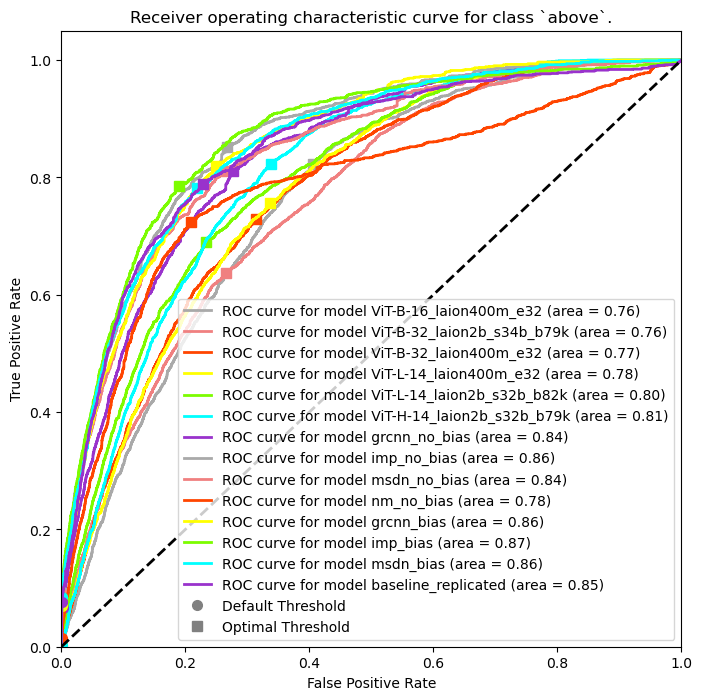

Relation: across


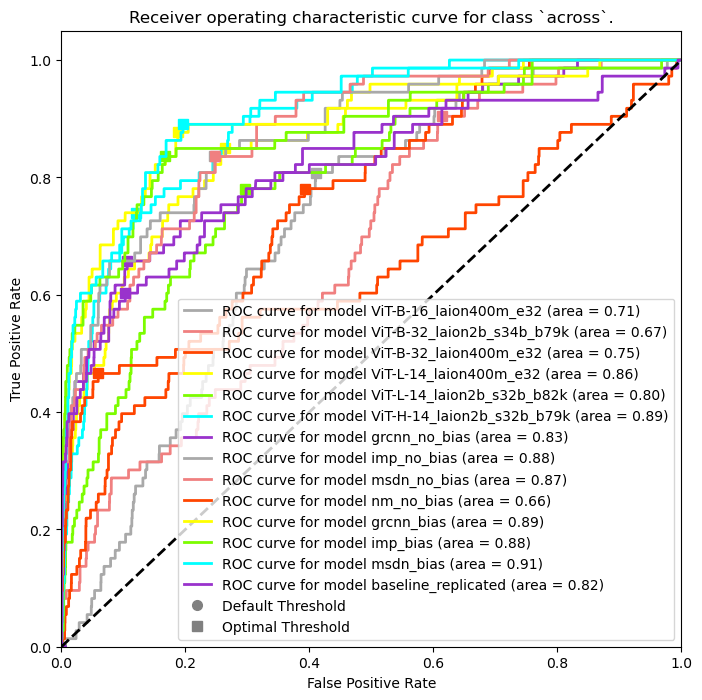

Relation: against


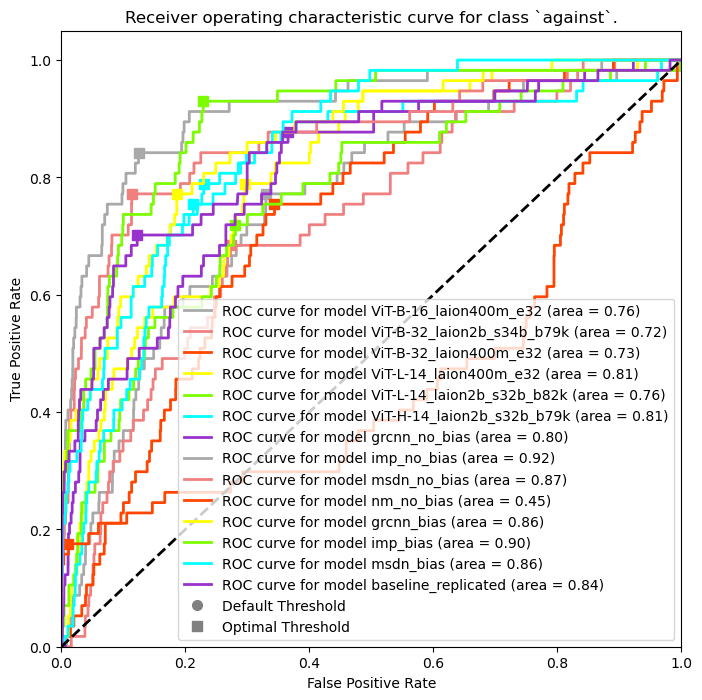

Relation: along


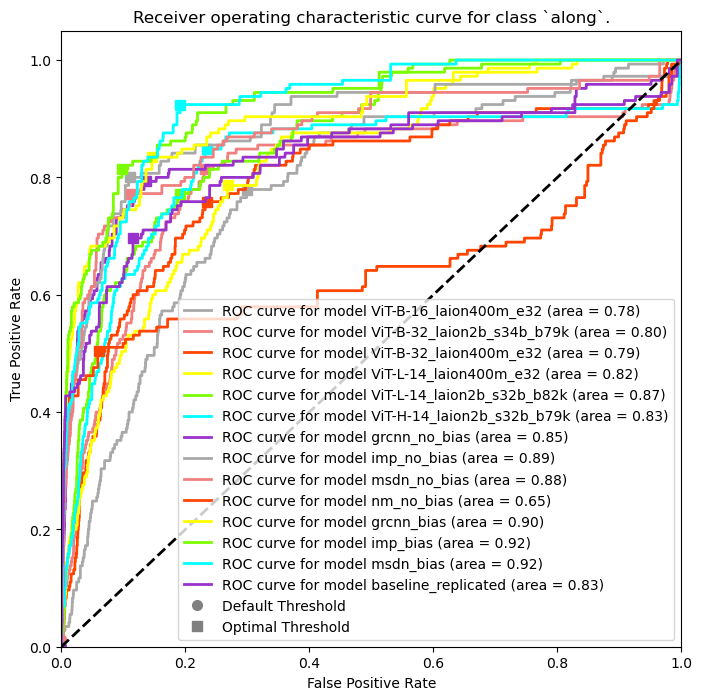

Relation: and


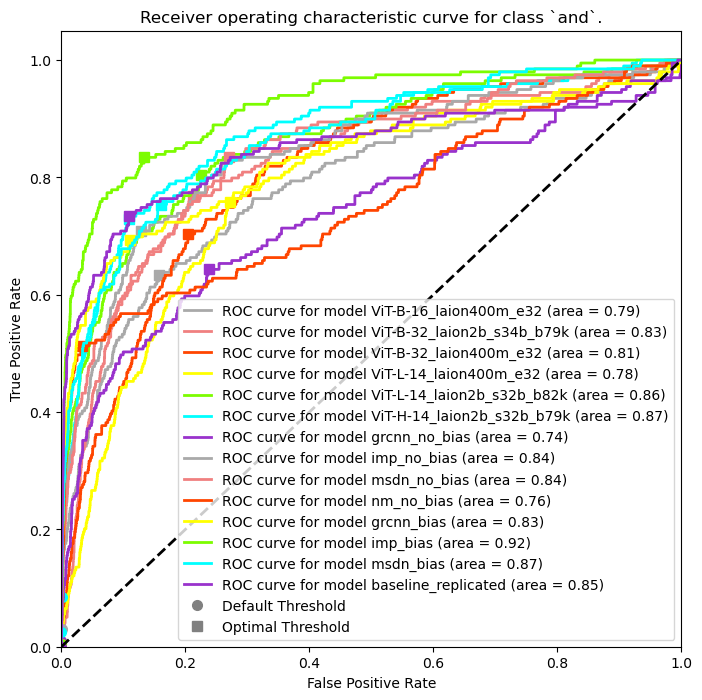

Relation: at


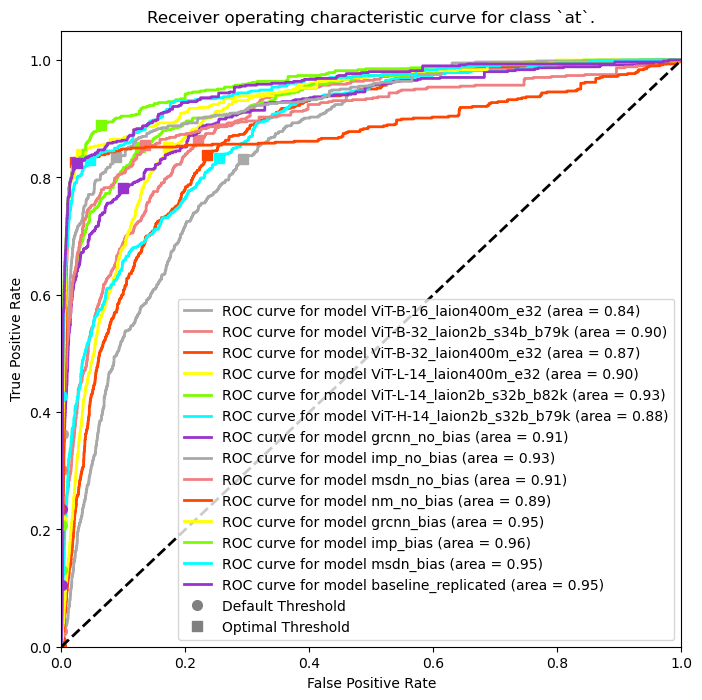

Relation: attached to


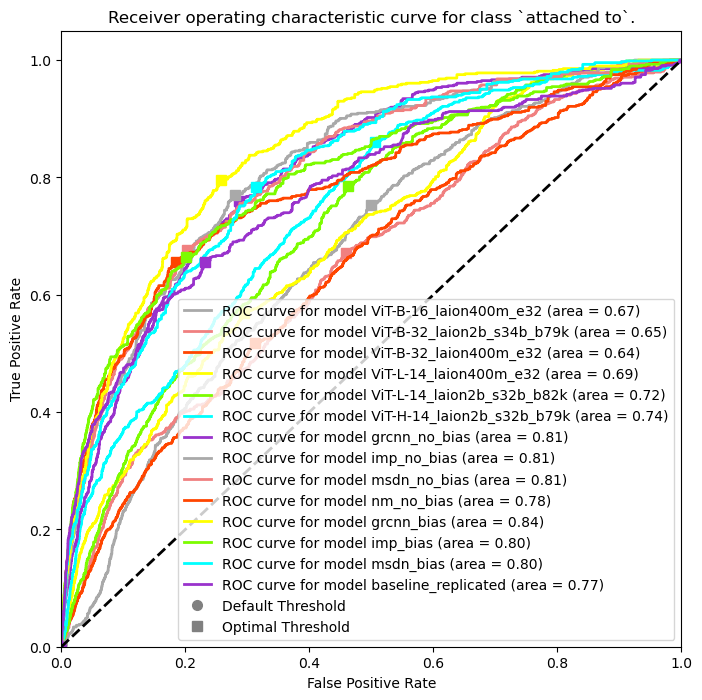

Relation: behind


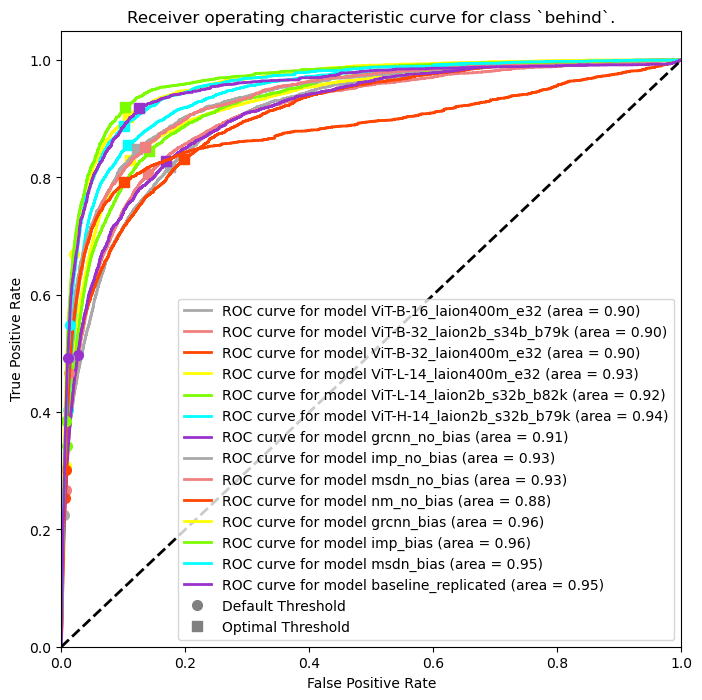

Relation: belonging to


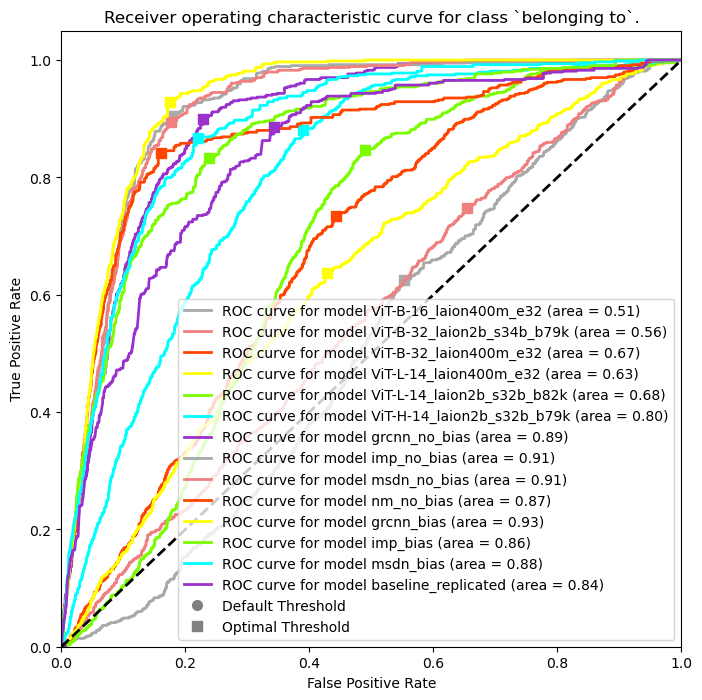

Relation: between


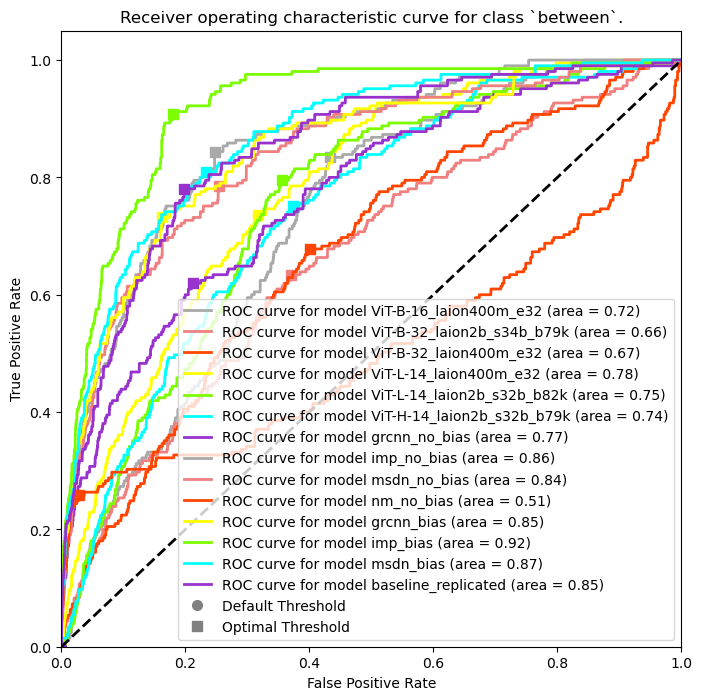

Relation: carrying


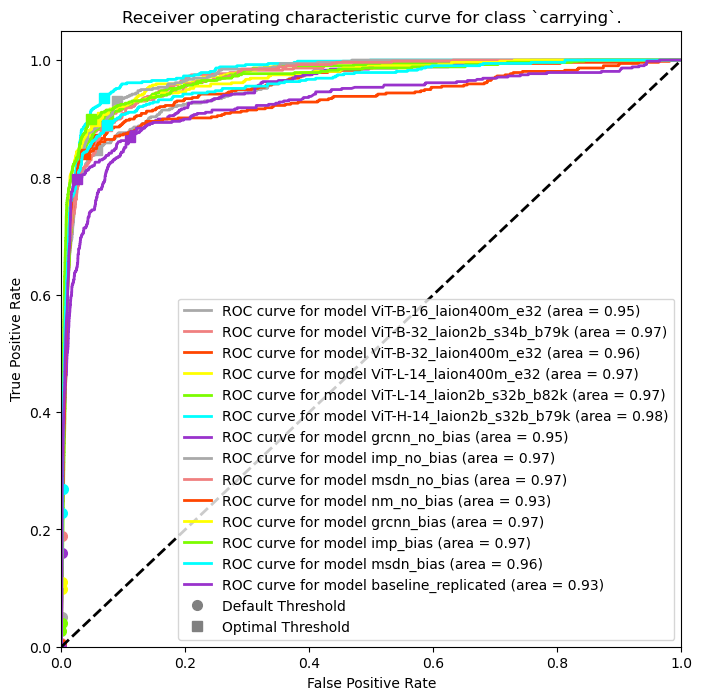

Relation: covered in


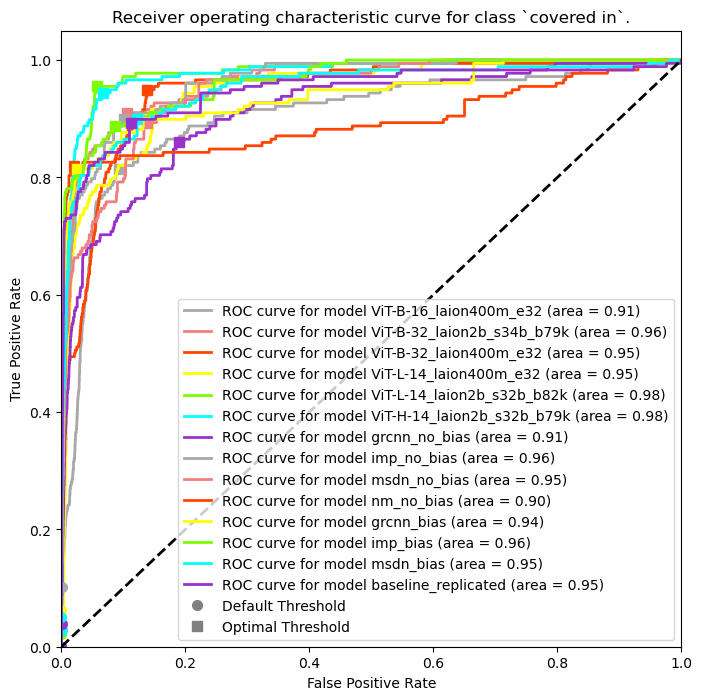

Relation: covering


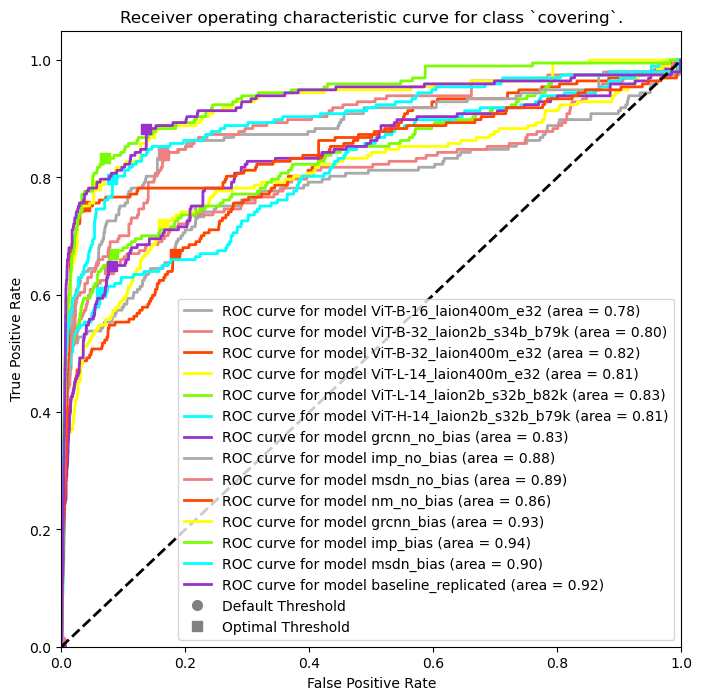

Relation: eating


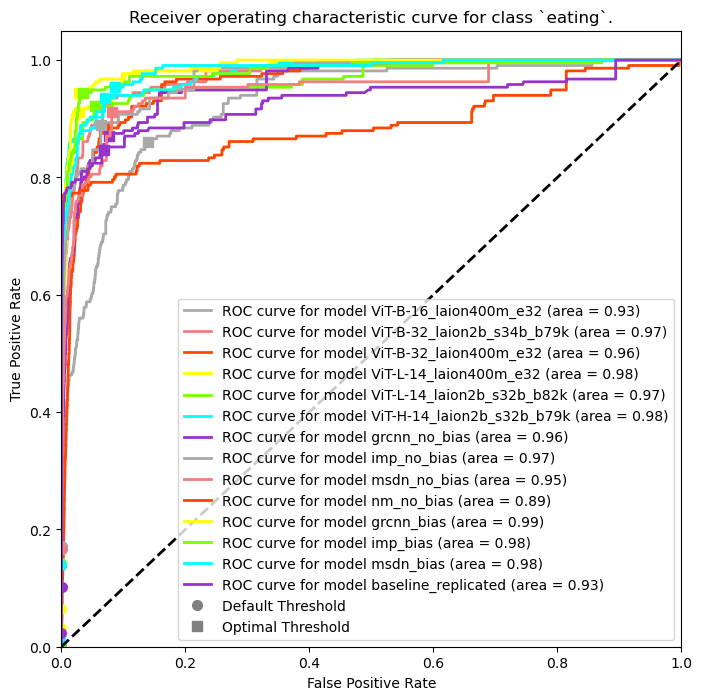

Relation: flying in


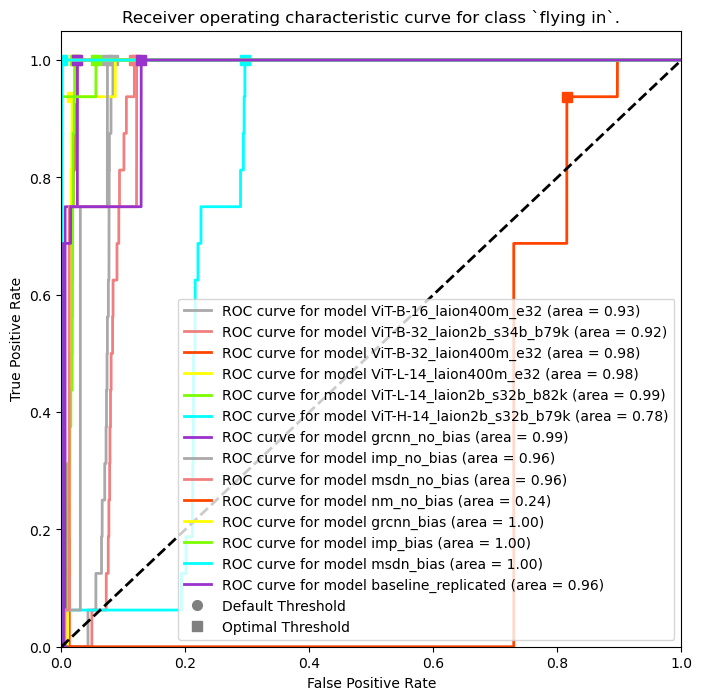

Relation: for


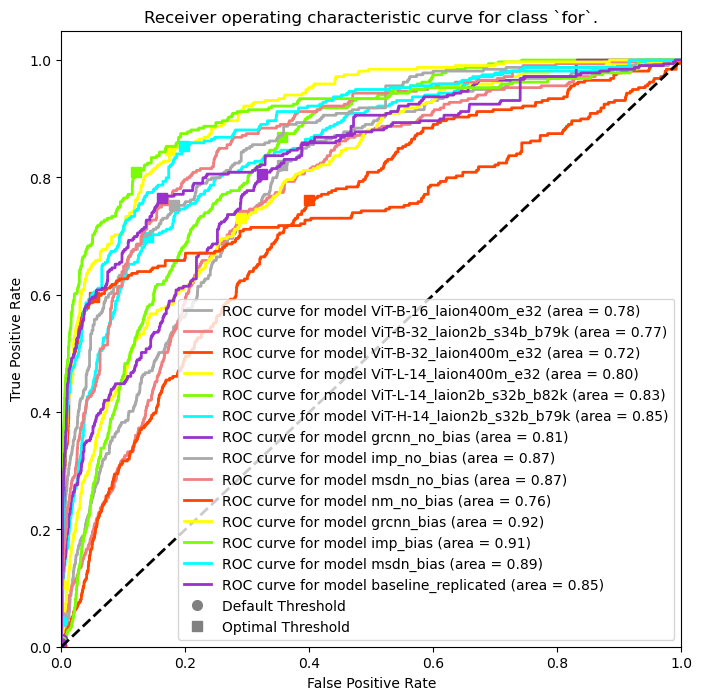

Relation: from


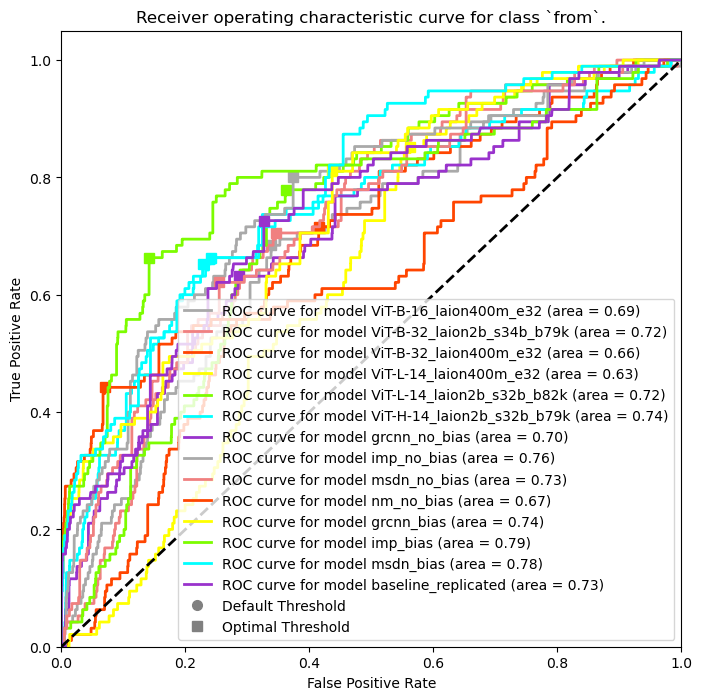

Relation: growing on


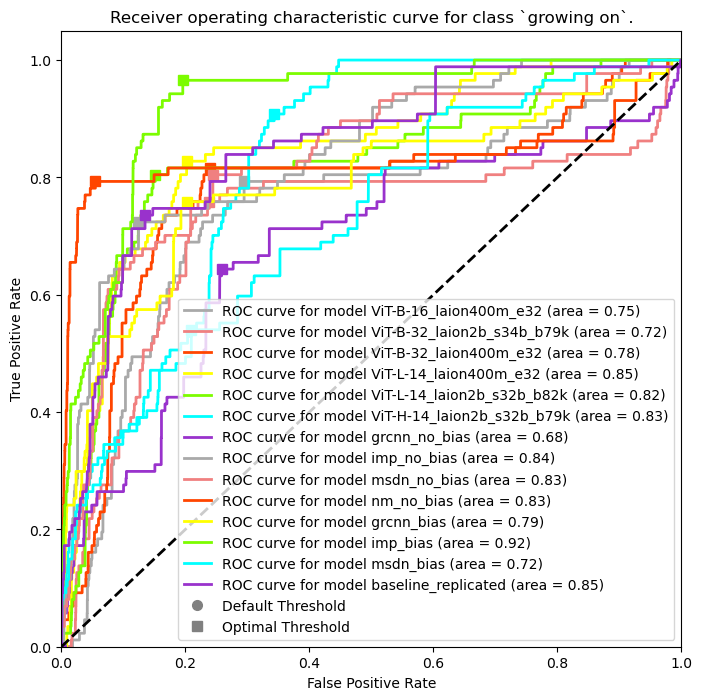

Relation: hanging from


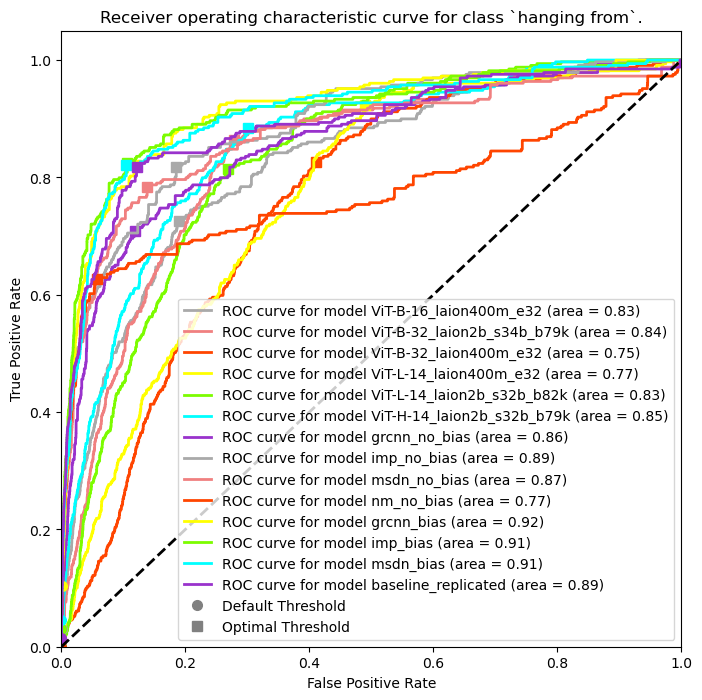

Relation: has


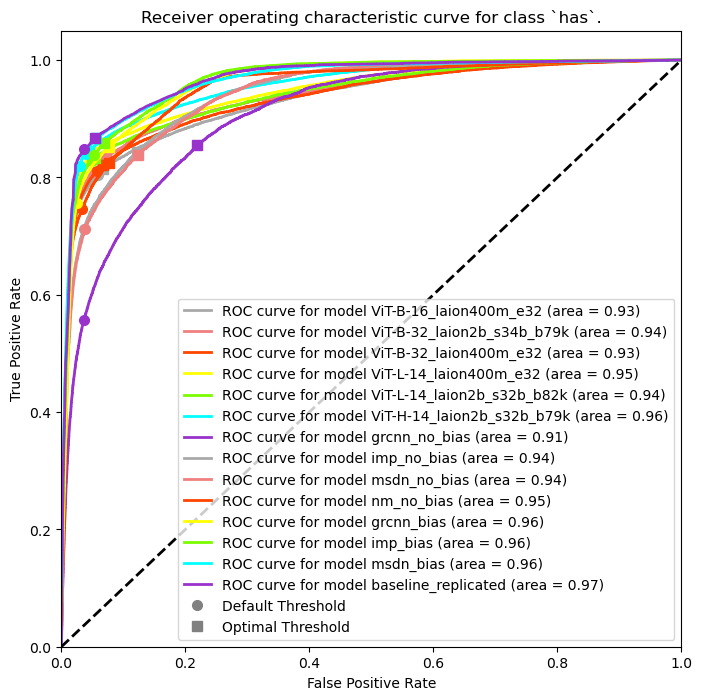

Relation: holding


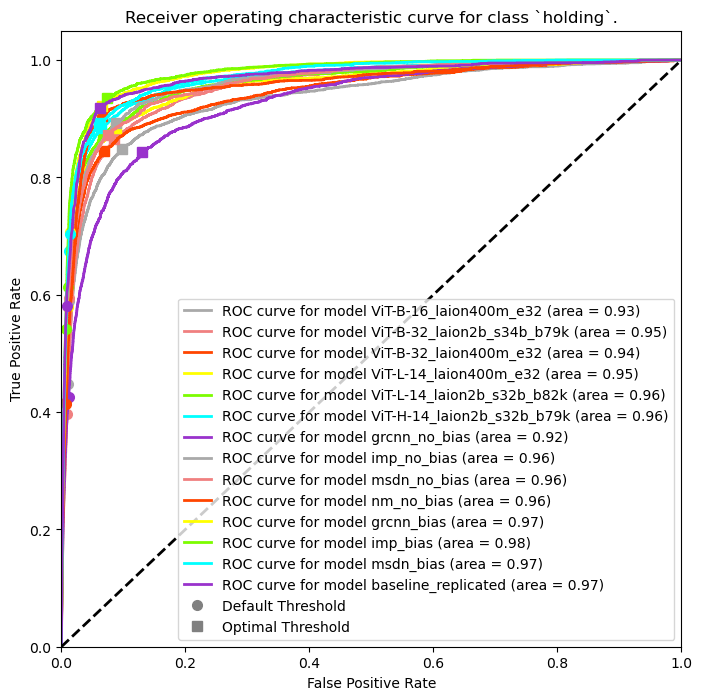

Relation: in


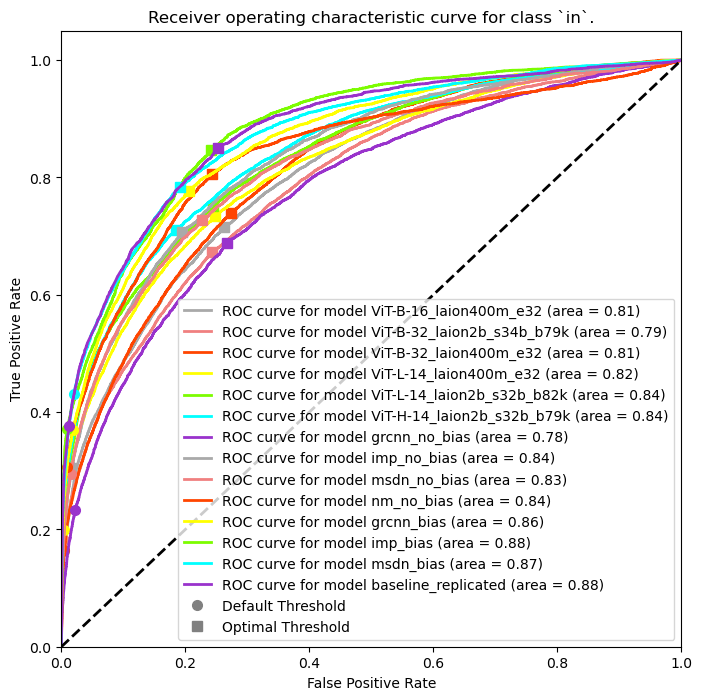

Relation: in front of


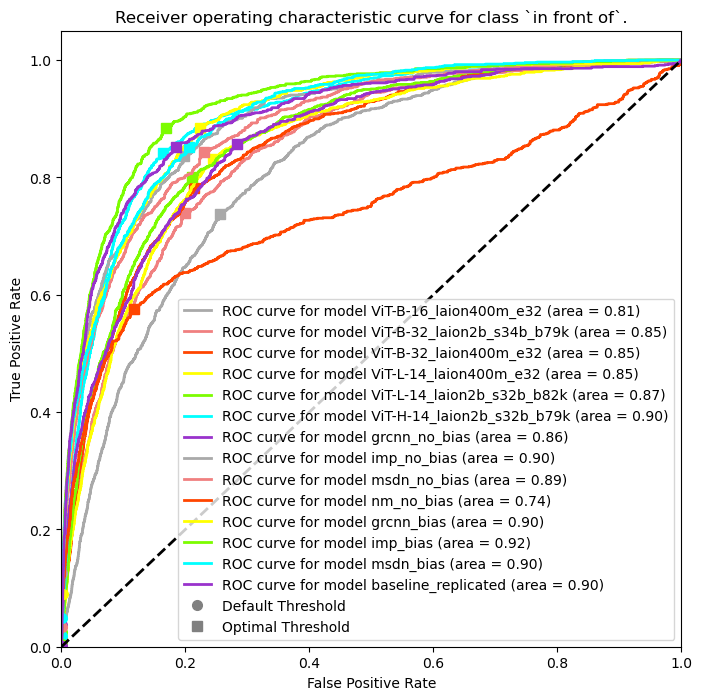

Relation: laying on


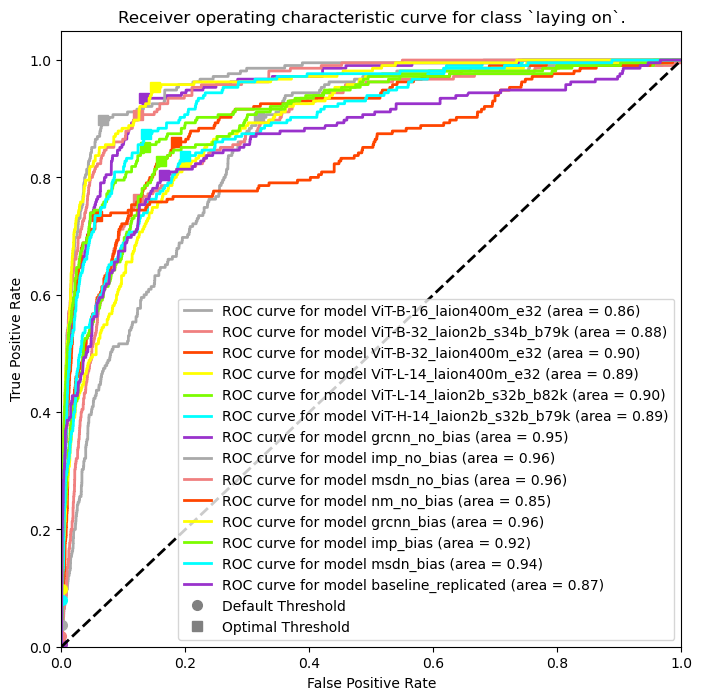

Relation: looking at


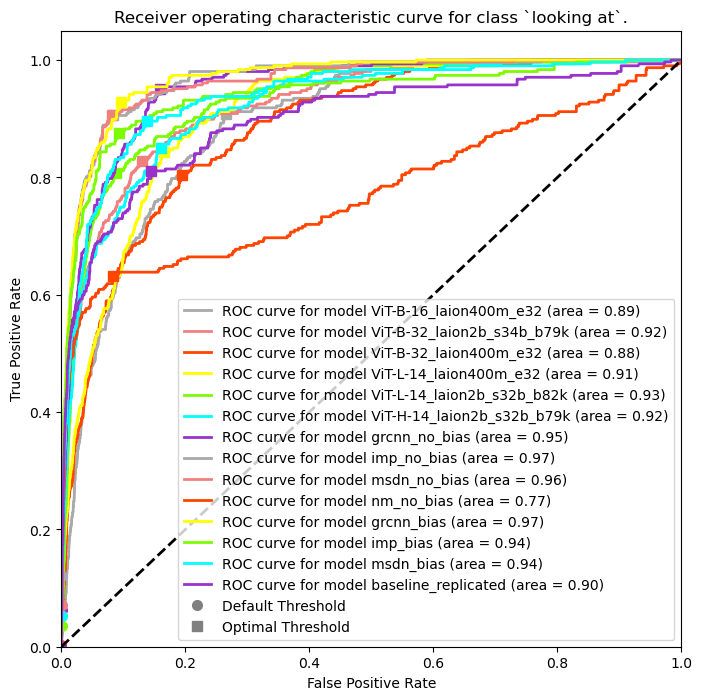

Relation: lying on


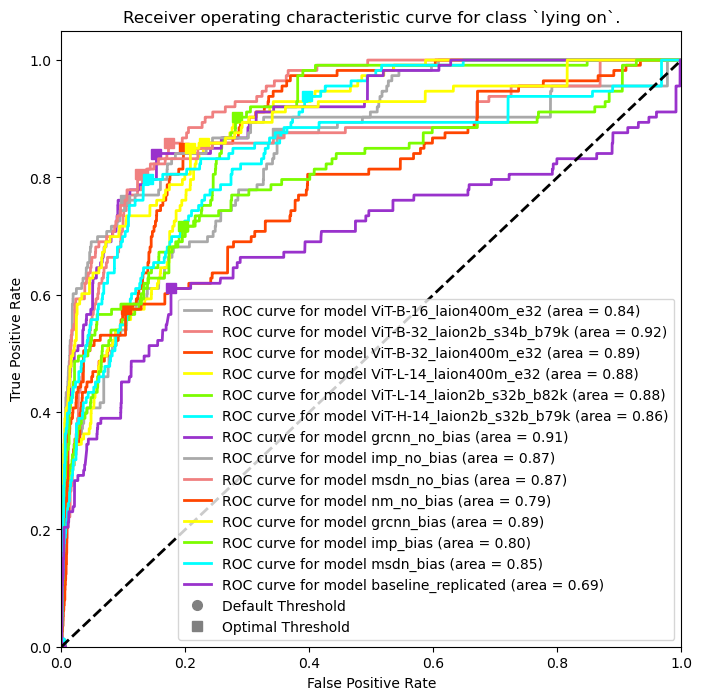

Relation: made of


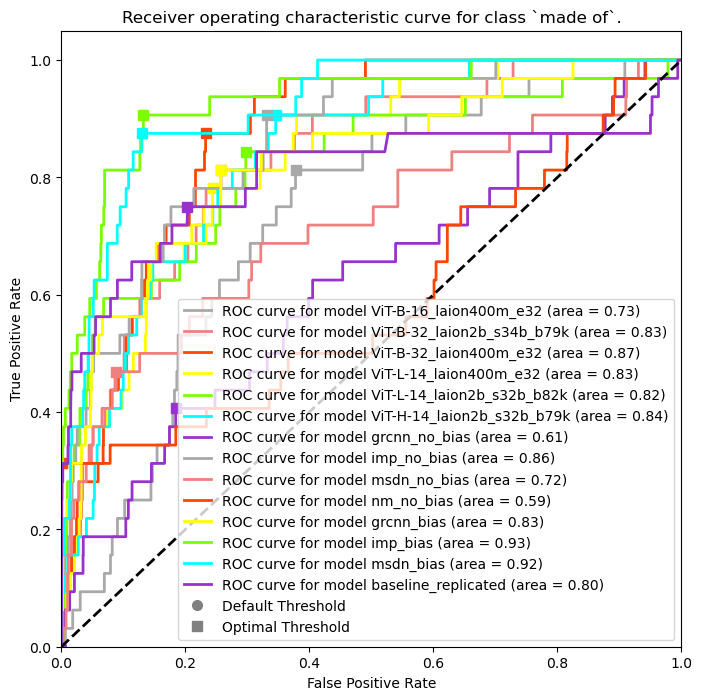

Relation: mounted on


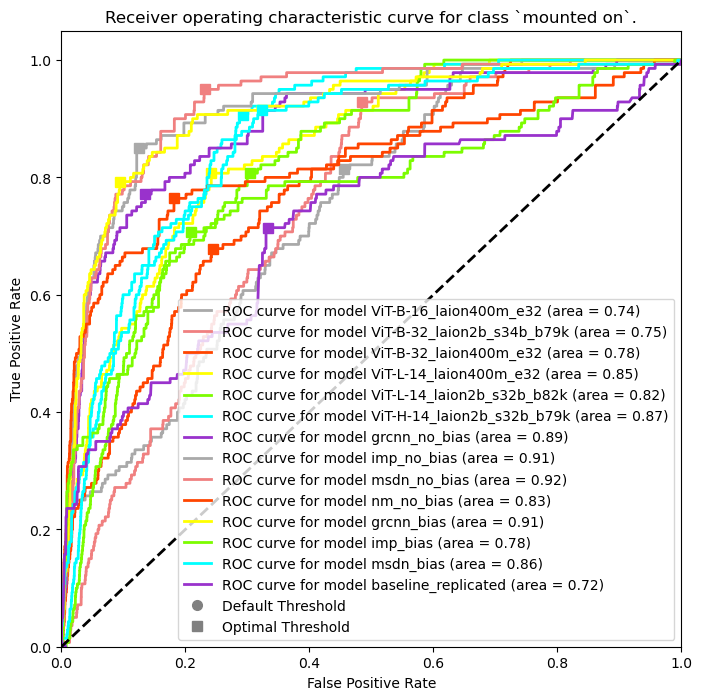

Relation: near


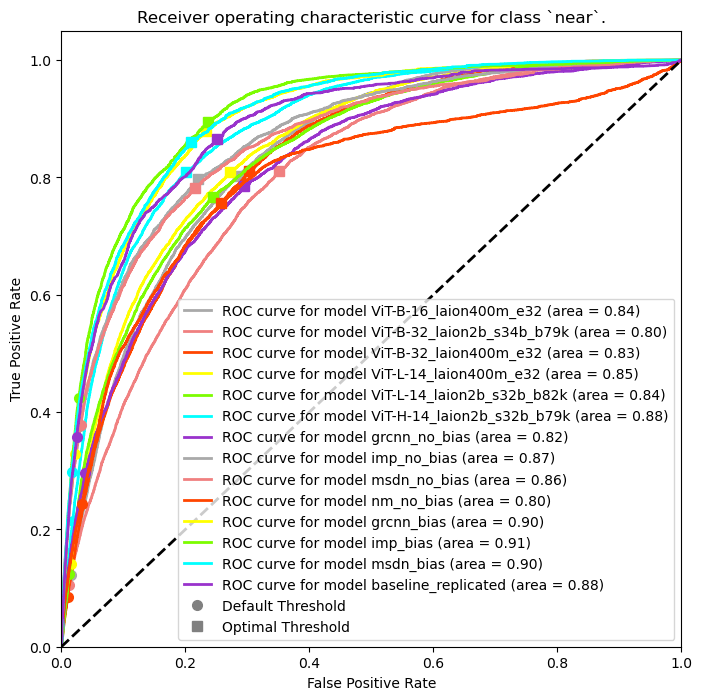

Relation: of


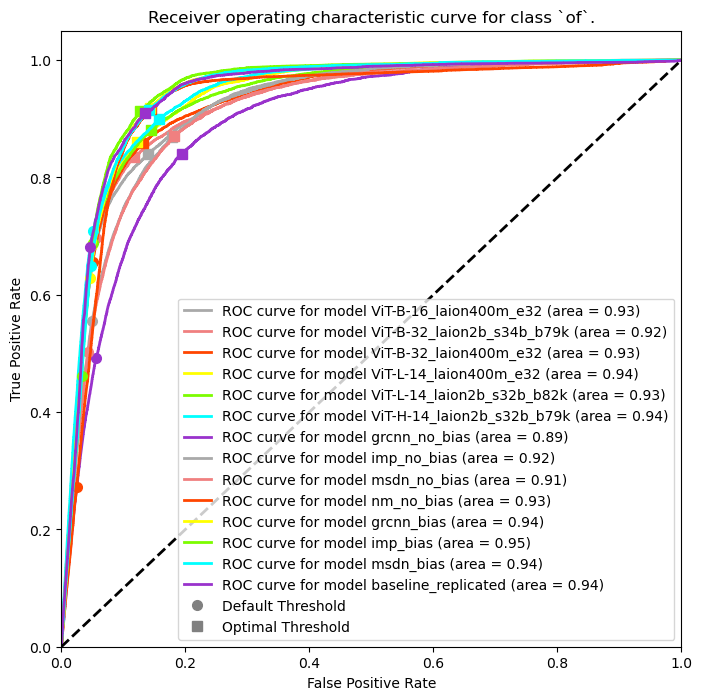

Relation: on


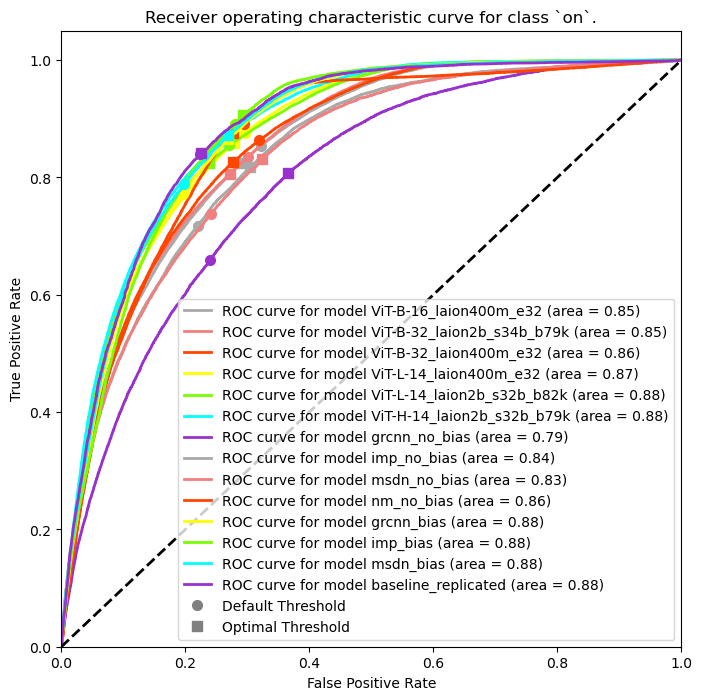

Relation: on back of


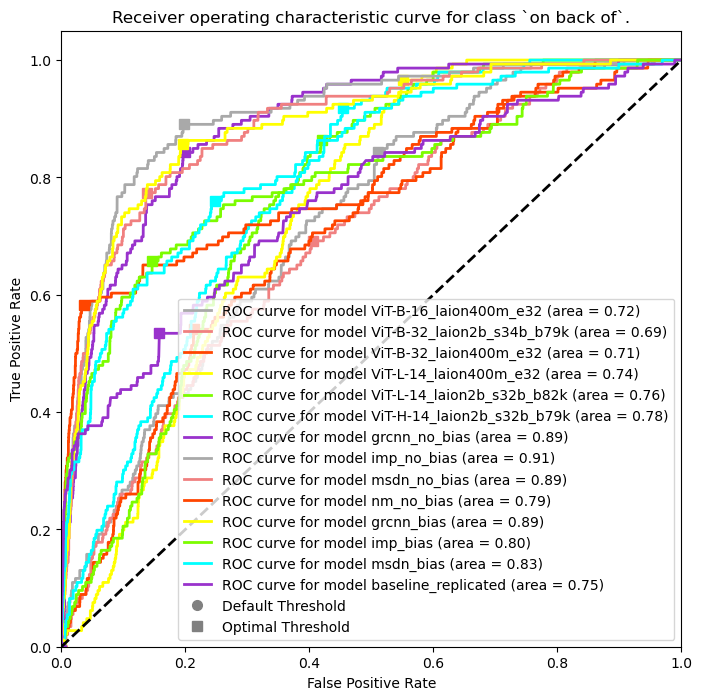

Relation: over


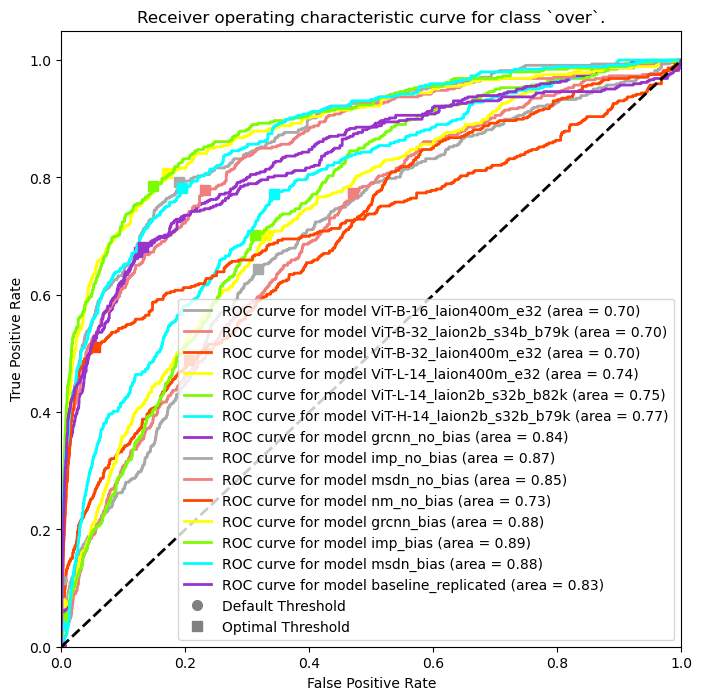

Relation: painted on


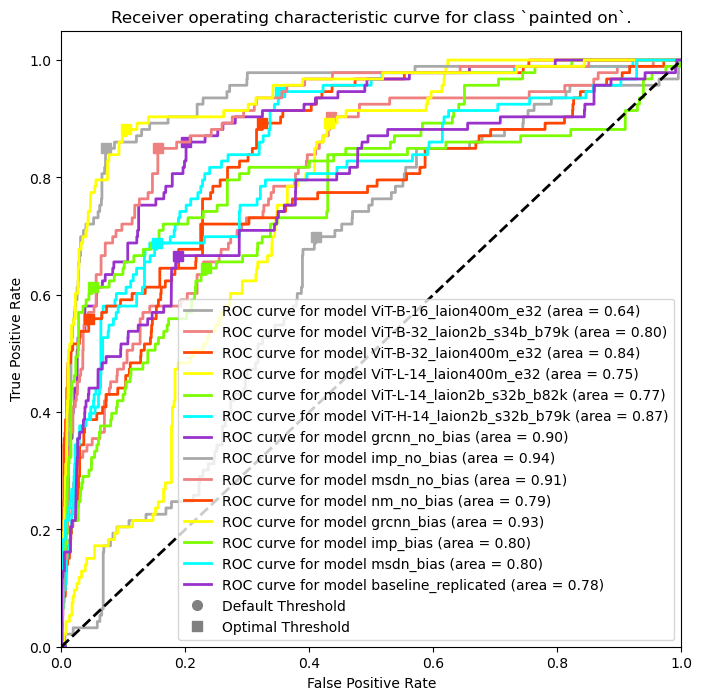

Relation: parked on


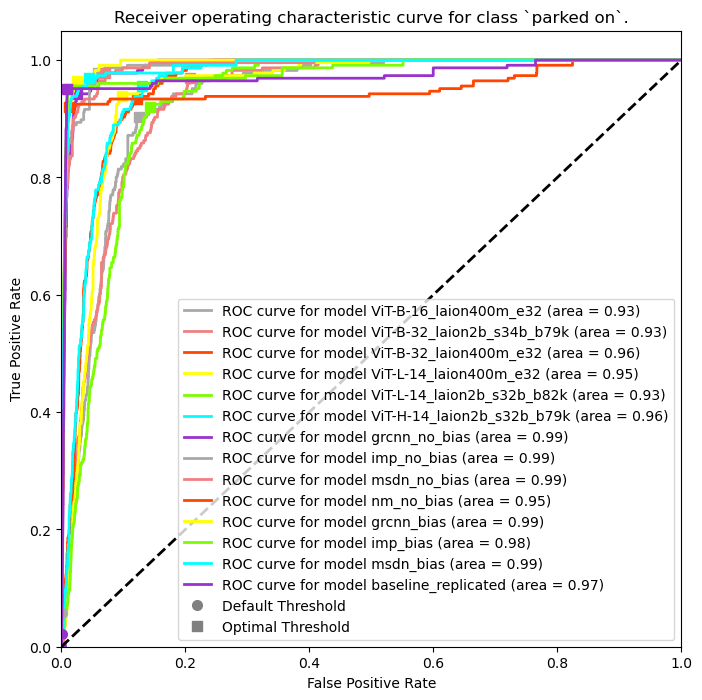

Relation: part of


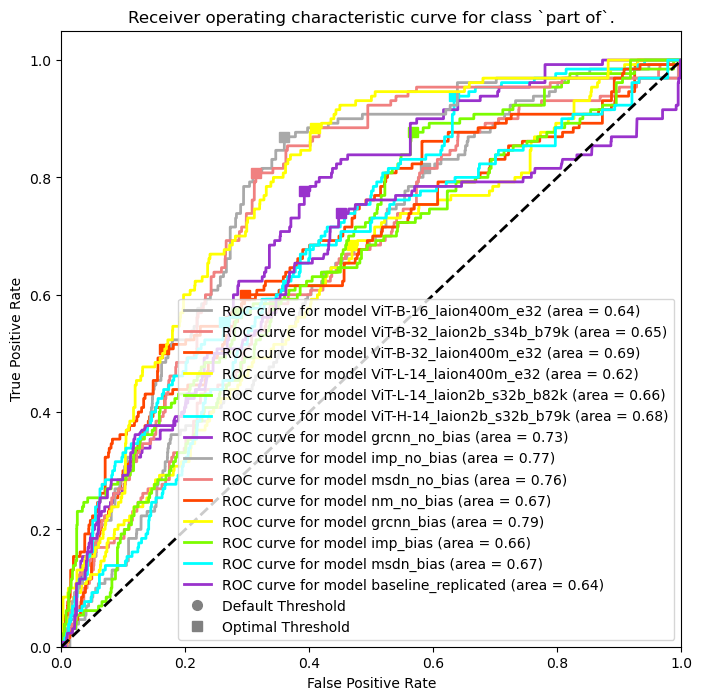

Relation: playing


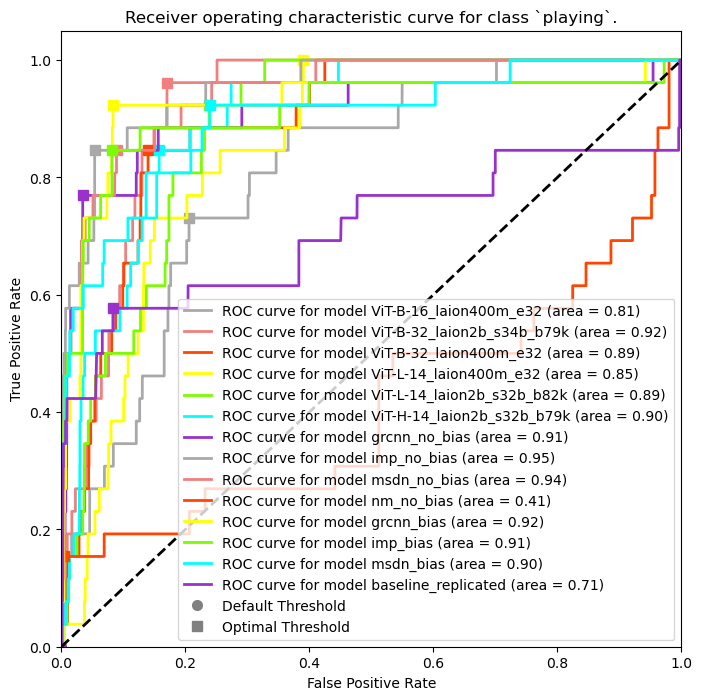

Relation: riding


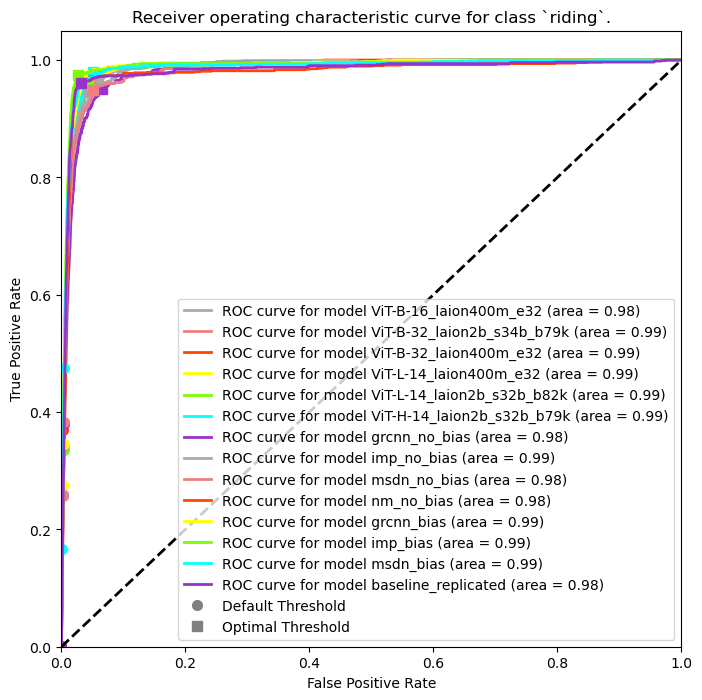

Relation: says


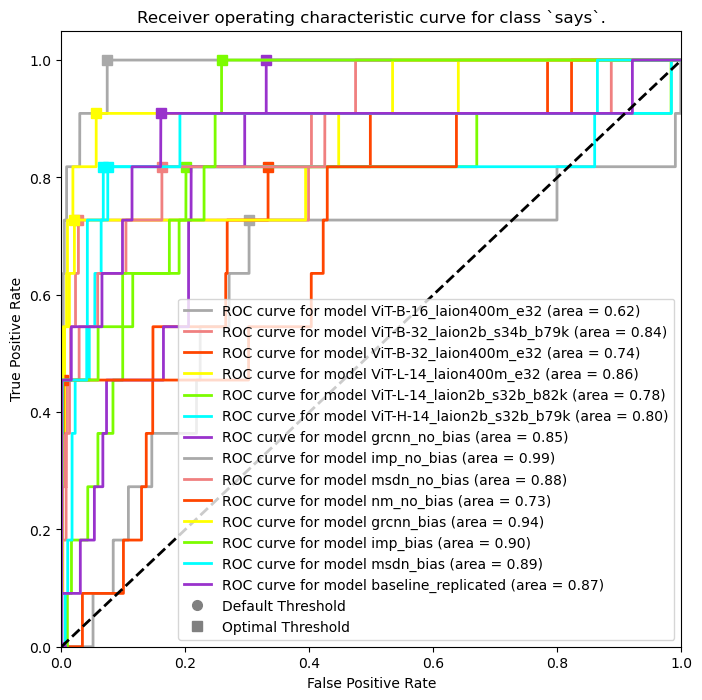

Relation: sitting on


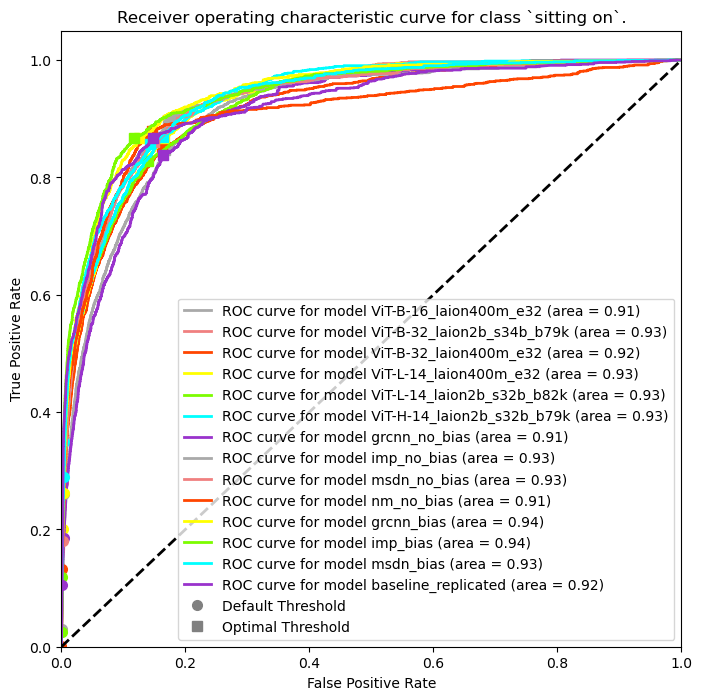

Relation: standing on


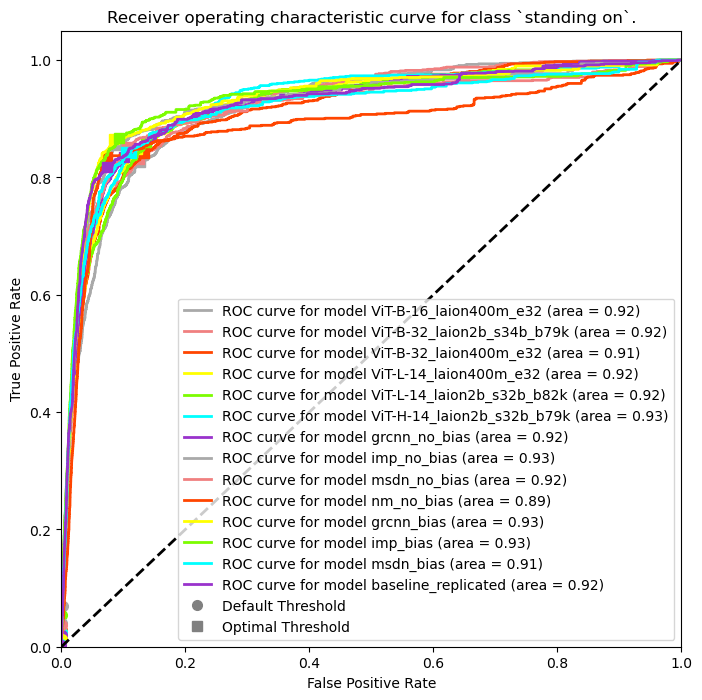

Relation: to


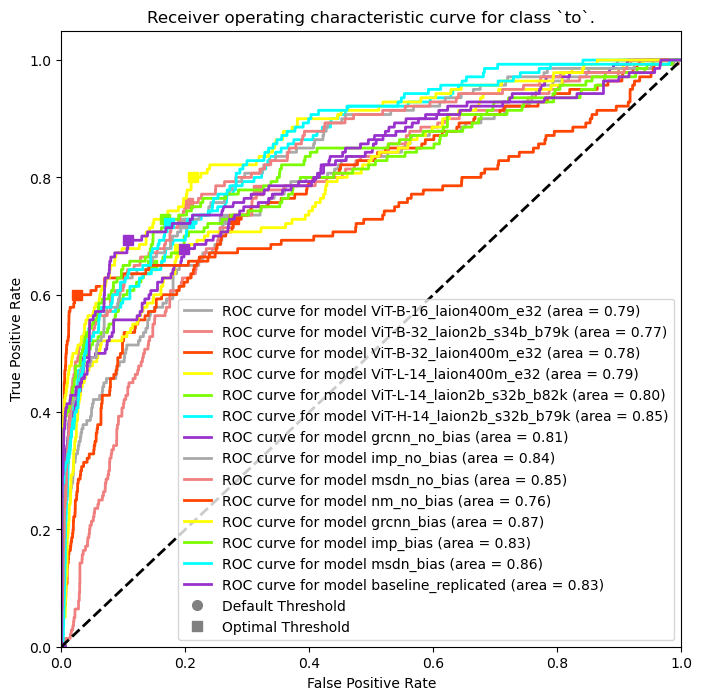

Relation: under


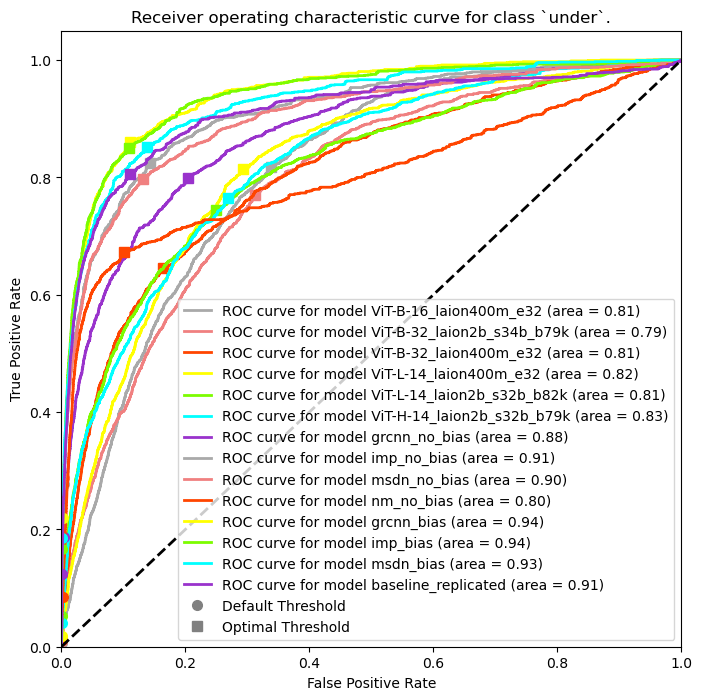

Relation: using


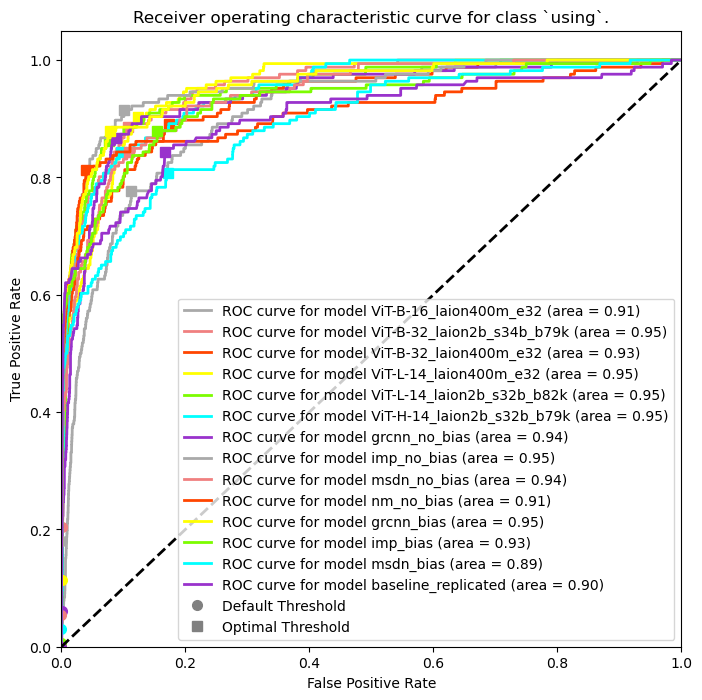

Relation: walking in


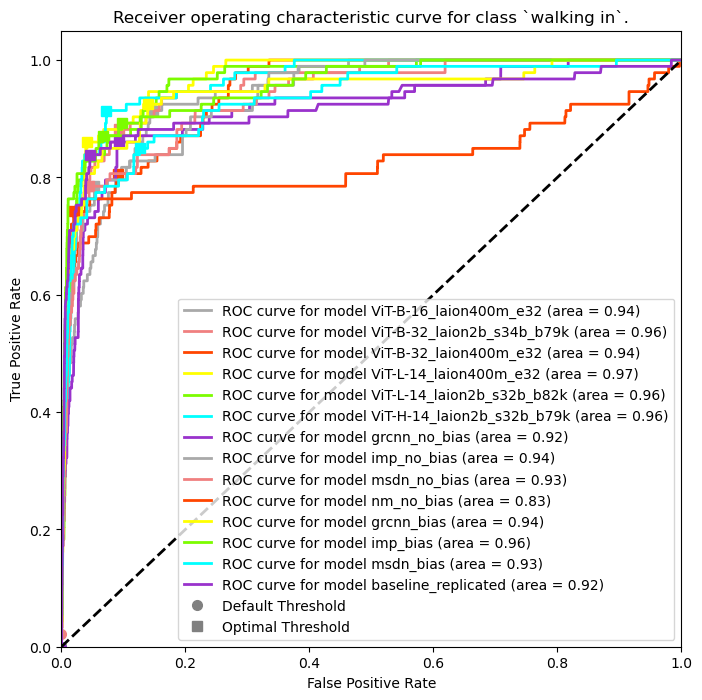

Relation: walking on


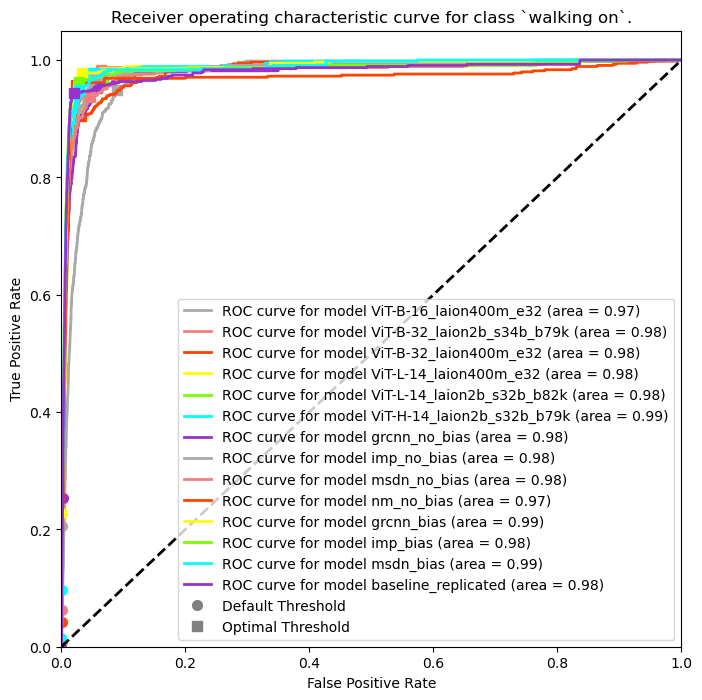

Relation: watching


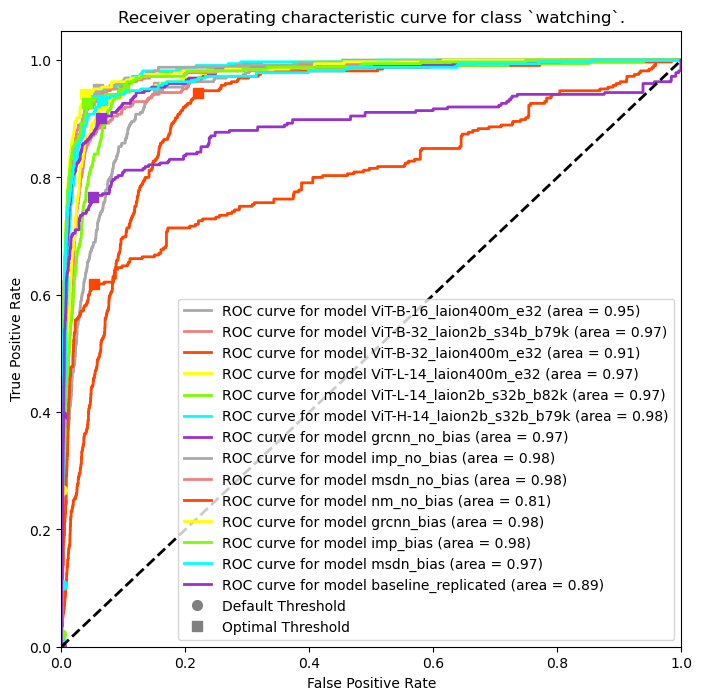

Relation: wearing


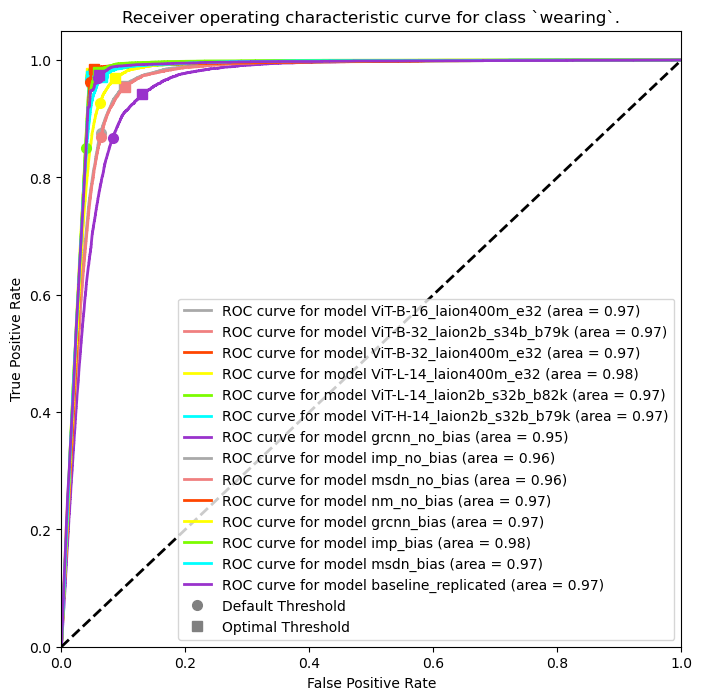

Relation: wears


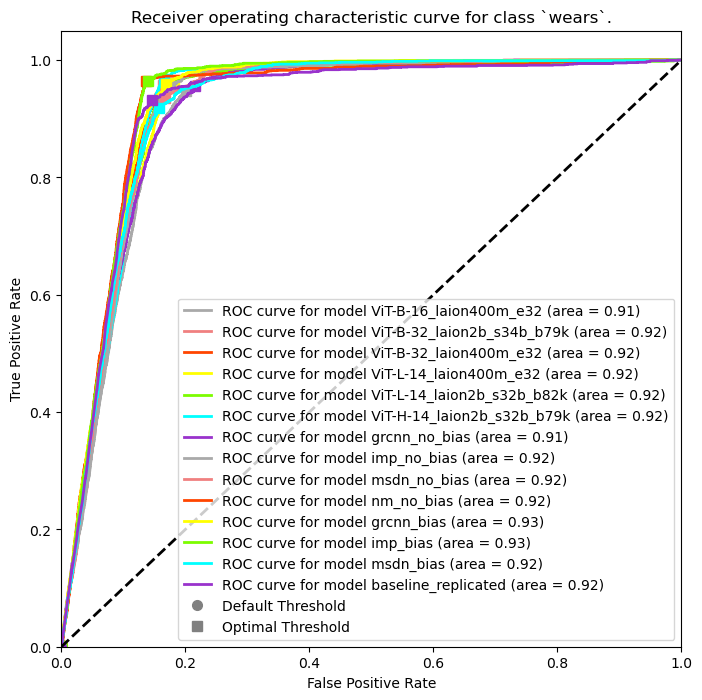

Relation: with


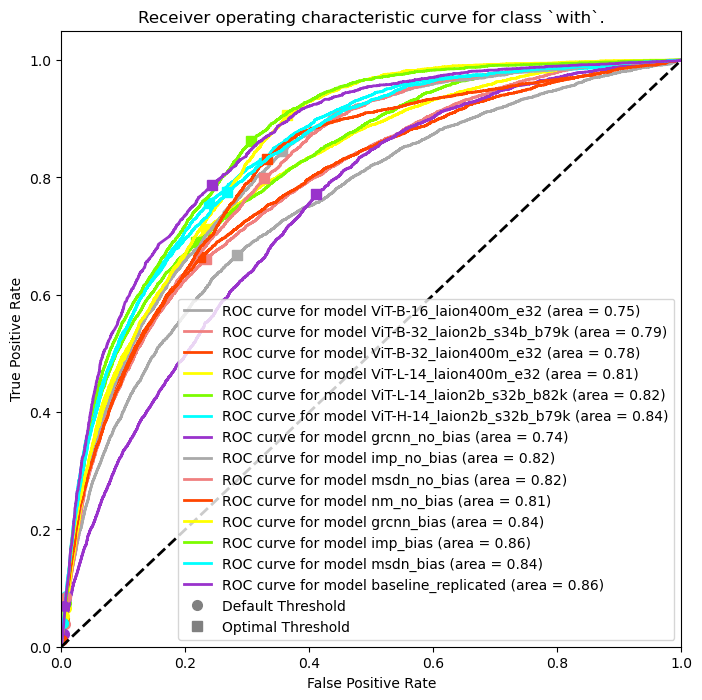

In [193]:
thresholds_informedness = {}
informedness_results = {}

for ind, relationship_name in ind_to_relation.items():
    if (ind == 0):
        continue
    
    thresholds_informedness[ind] = {}
    informedness_results[ind] = {}
    print("Relation: {}".format(relationship_name))
    plot_roc_curve(all_roc_results, relation=relationship_name, select=all_models, thresholds_informedness=thresholds_informedness[ind], informedness_results=informedness_results[ind])
#     plot_roc_curve(all_roc_results, relation=relationship_name, select=select_with_bias)
    print("========================================================================")

In [172]:
'ViT-B-32_laion2b_s34b_b79k2' == 'ViT-B-32_laion2b_s34b_b79k'

False

In [162]:
all_confusion_matrices_by_class.keys()

dict_keys(['ViT-B-16_laion400m_e32', 'ViT-B-32_laion400m_e32', 'ViT-B-32_laion2b_s34b_b79k', 'ViT-L-14_laion2b_s32b_b82k', 'ViT-L-14_laion400m_e32', 'ViT-H-14_laion2b_s32b_b79k', 'baseline_replicated', 'grcnn_bias', 'grcnn_no_bias', 'imp_bias', 'imp_no_bias', 'msdn_bias', 'msdn_no_bias', 'nm_no_bias'])

In [86]:
#torch.save(thresholds_informedness, 'thresholds_informedness.pth')
torch.save(informedness_results, 'informedness_results_nobias.pth')

Relation: above


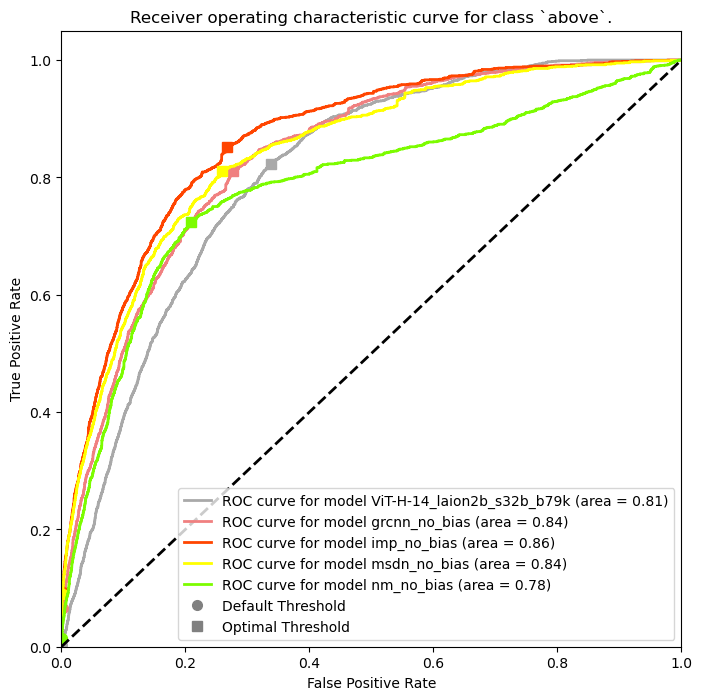

Relation: across


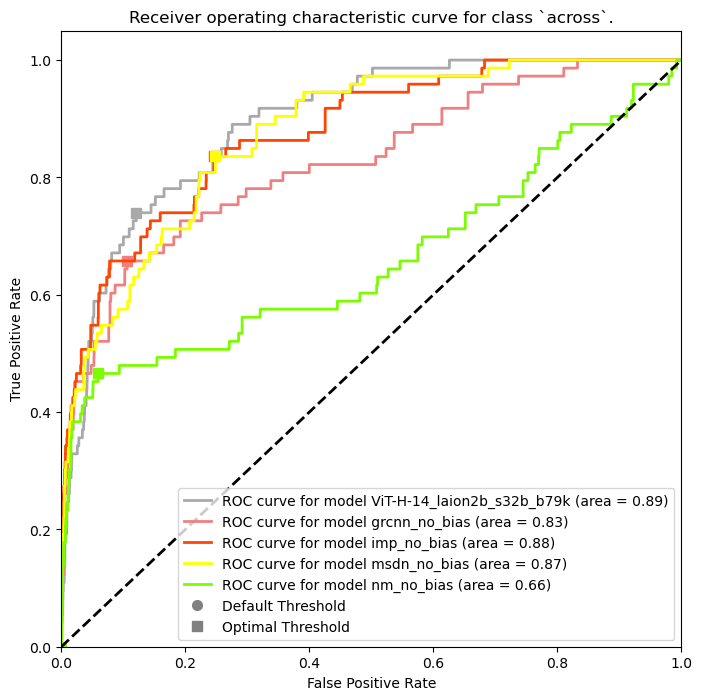

Relation: against


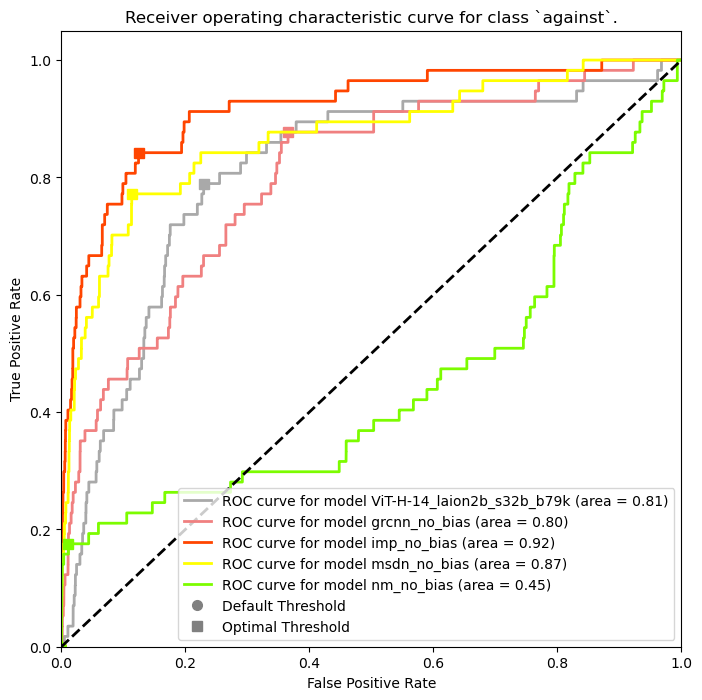

Relation: along


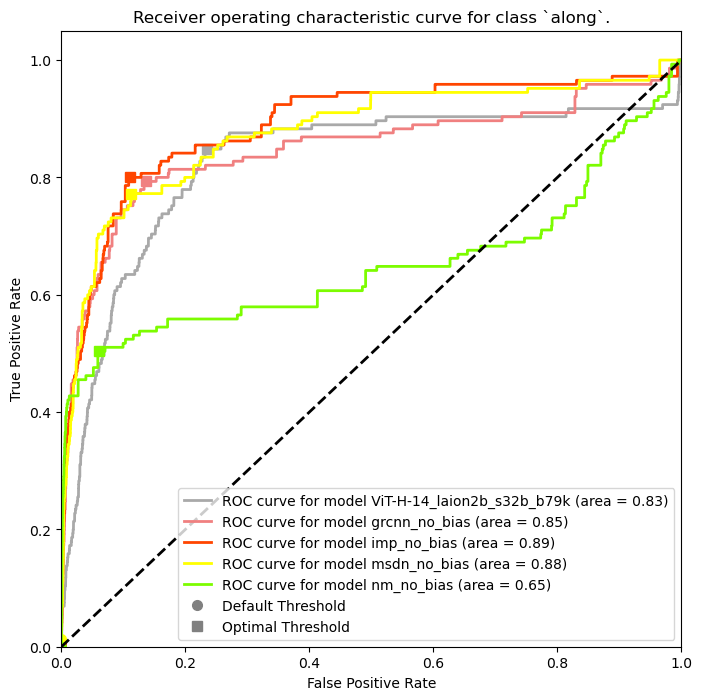

Relation: and


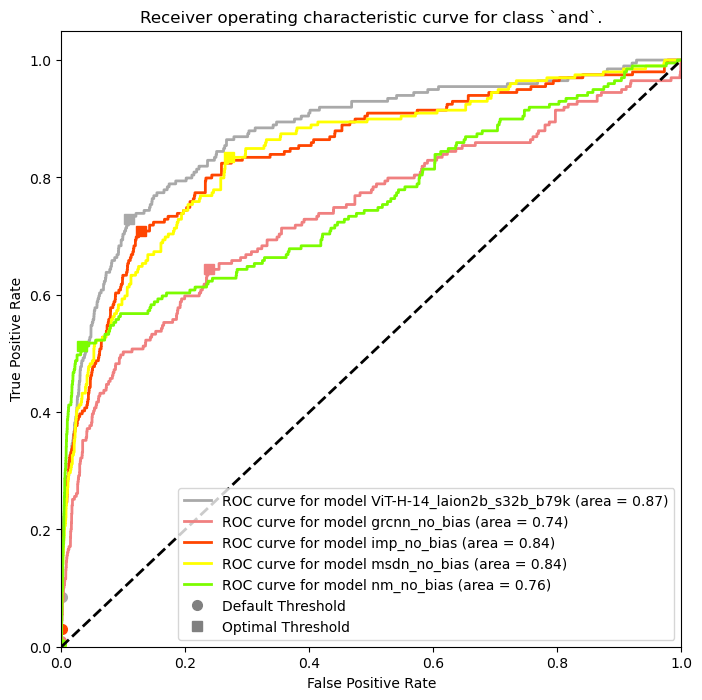

Relation: at


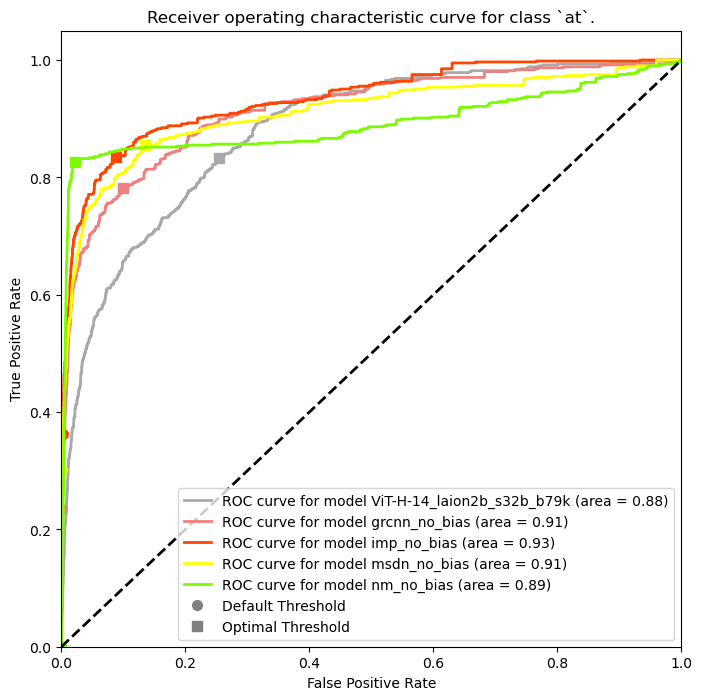

Relation: attached to


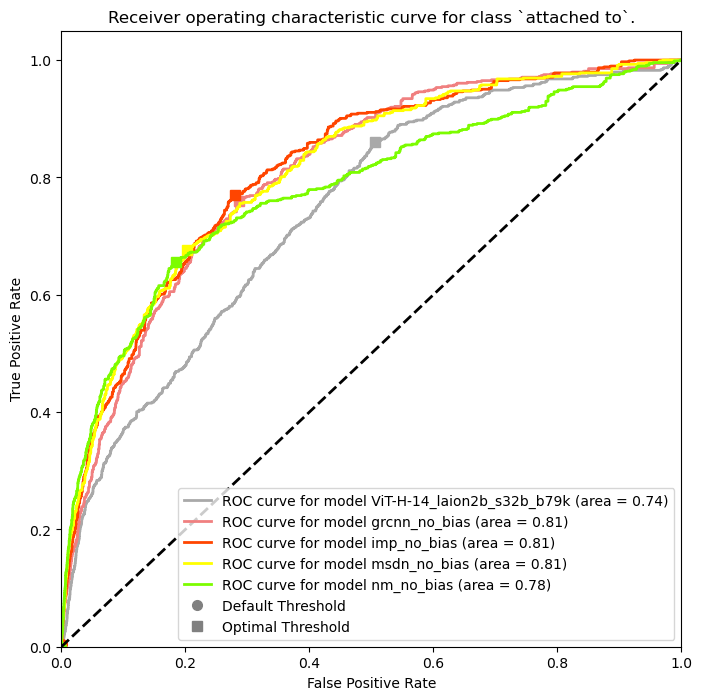

Relation: behind


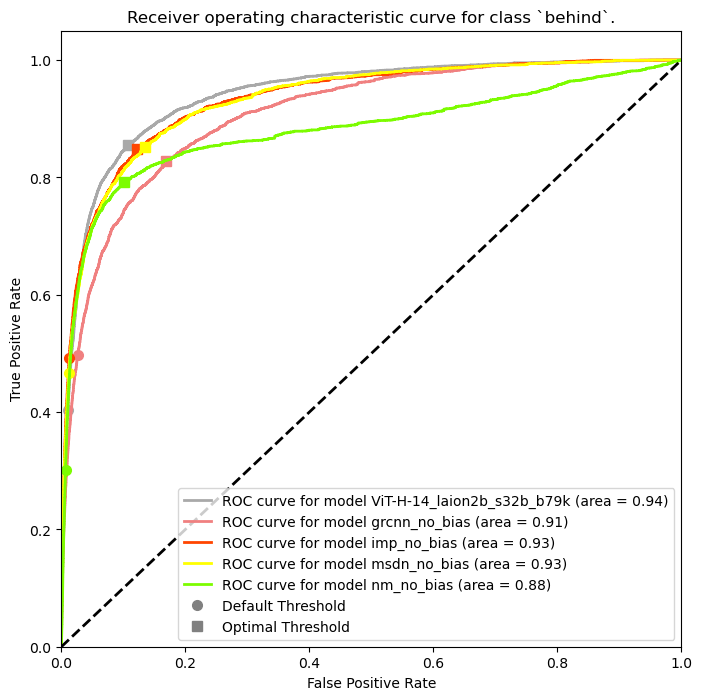

Relation: belonging to


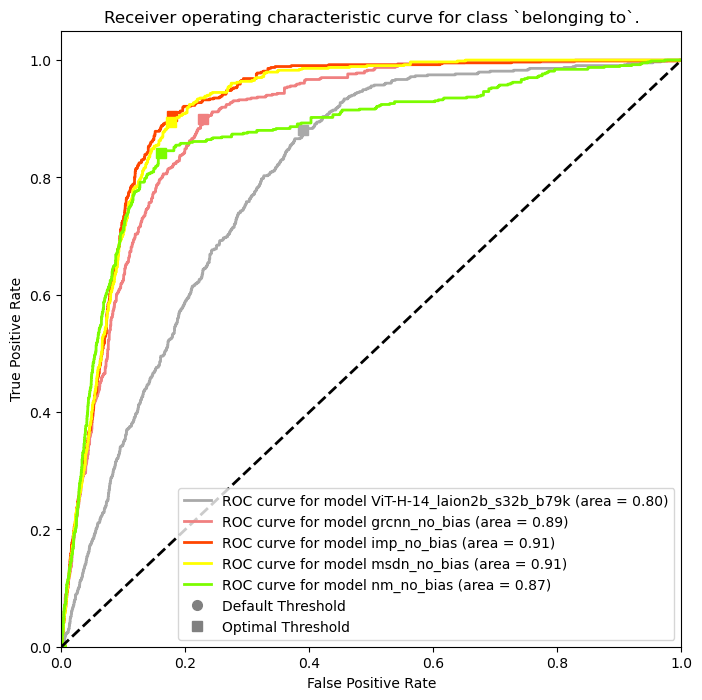

Relation: between


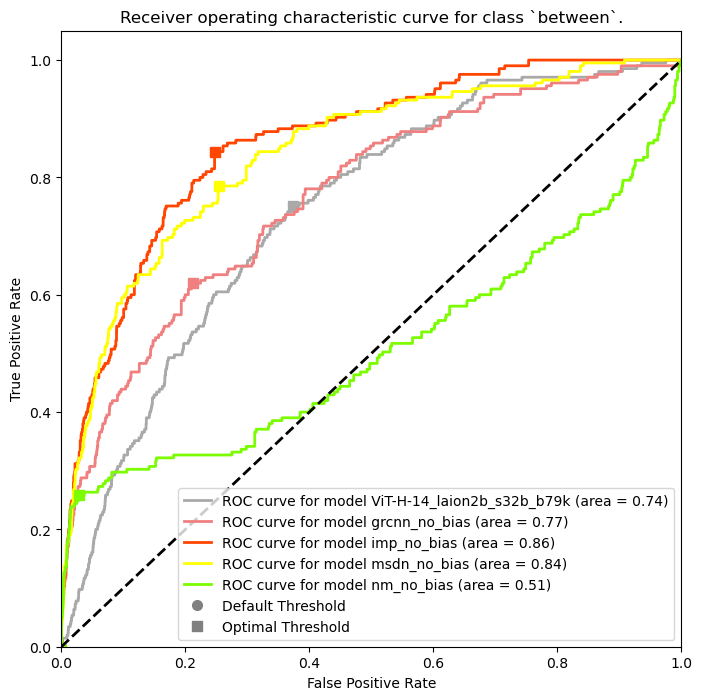

Relation: carrying


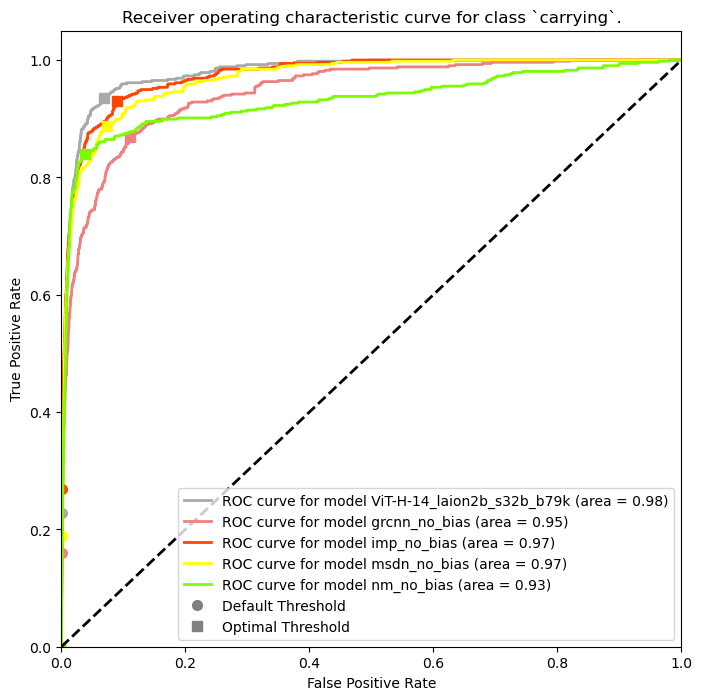

Relation: covered in


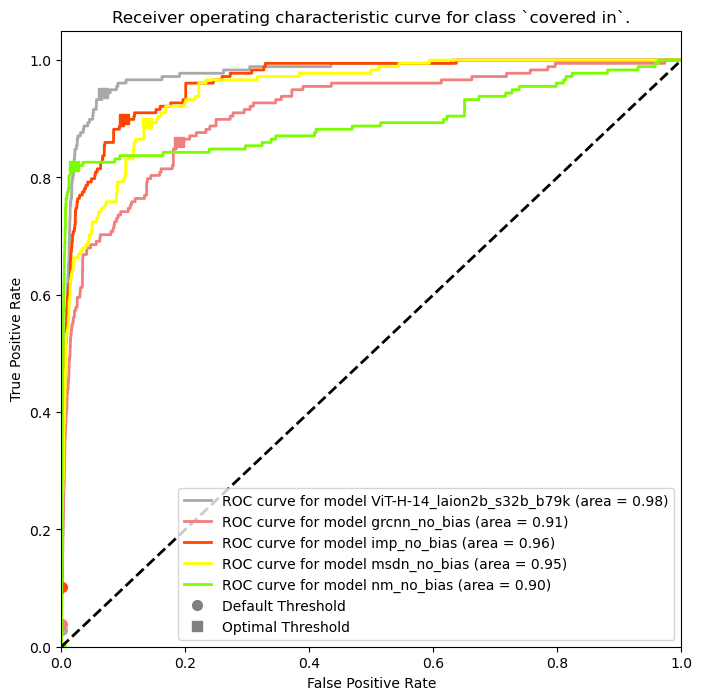

Relation: covering


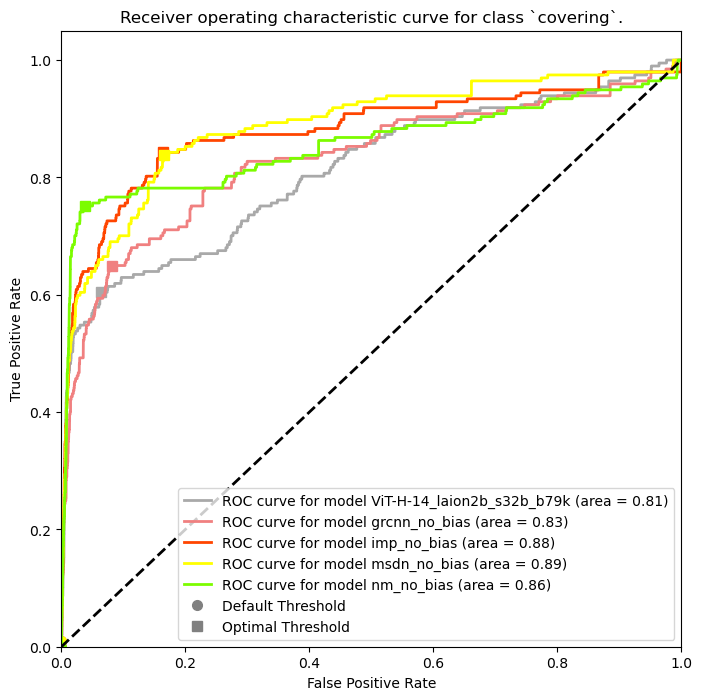

Relation: eating


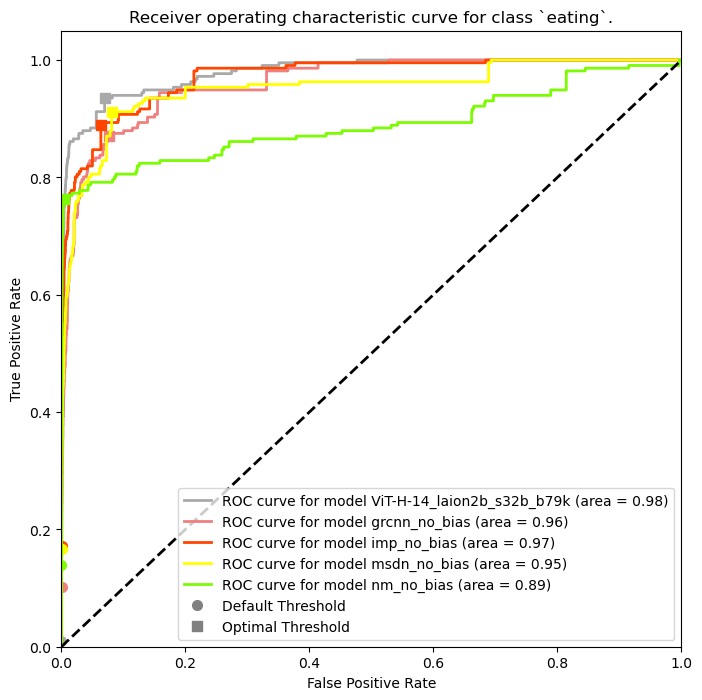

Relation: flying in


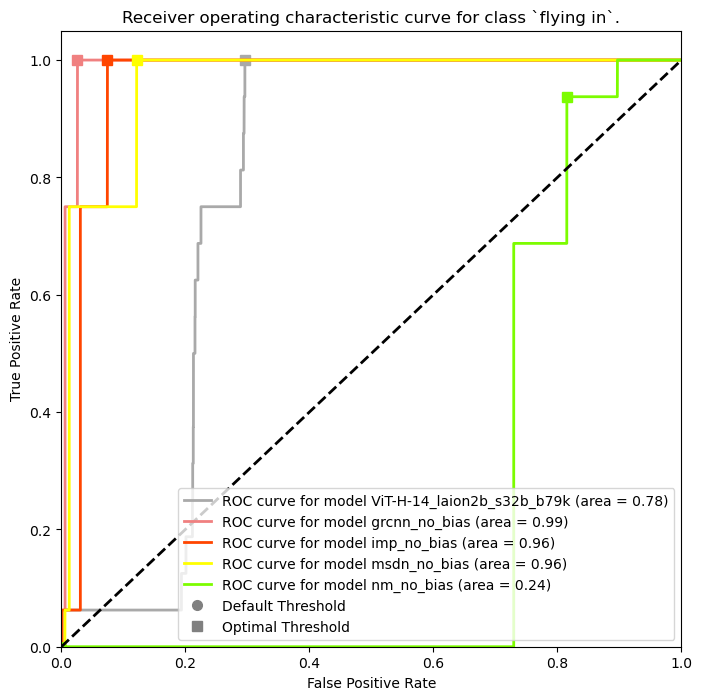

Relation: for


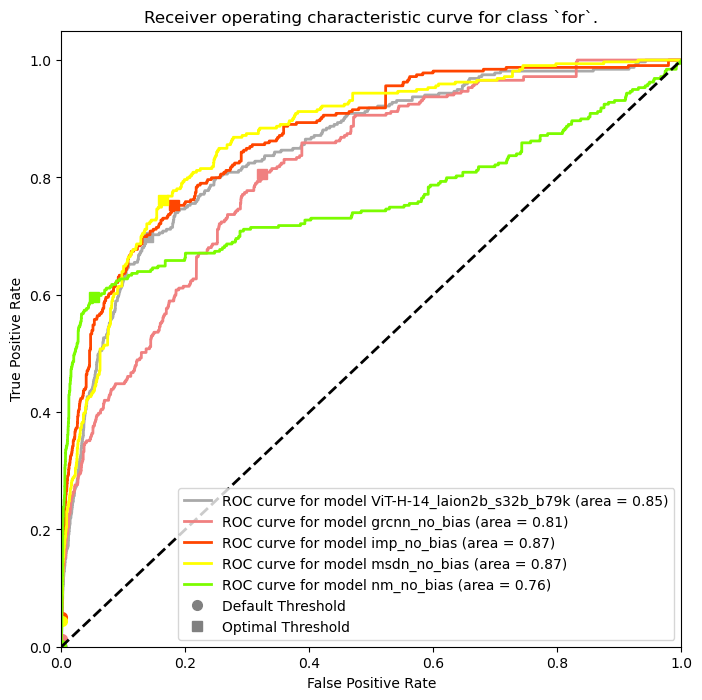

Relation: from


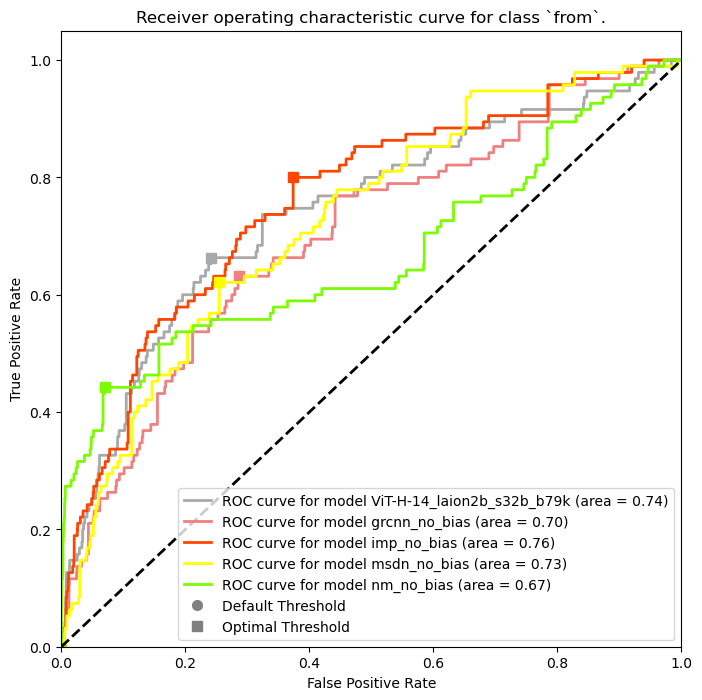

Relation: growing on


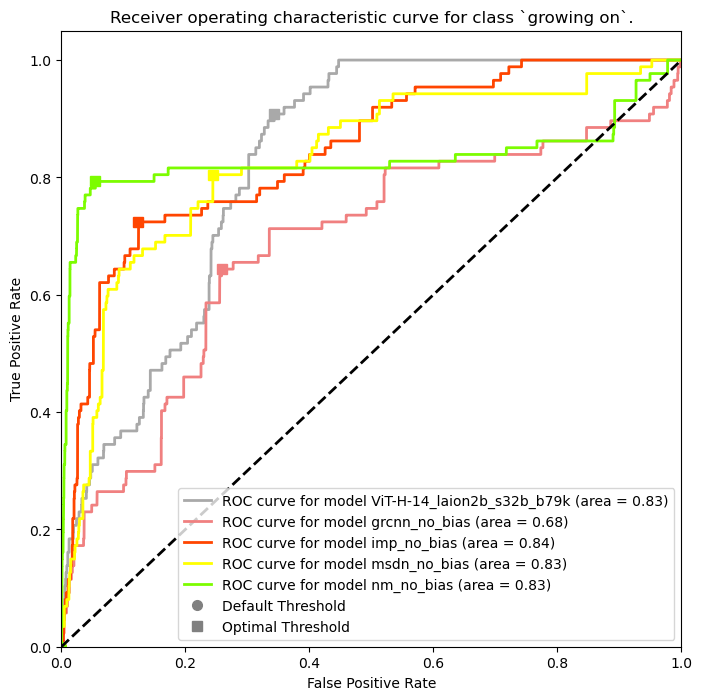

Relation: hanging from


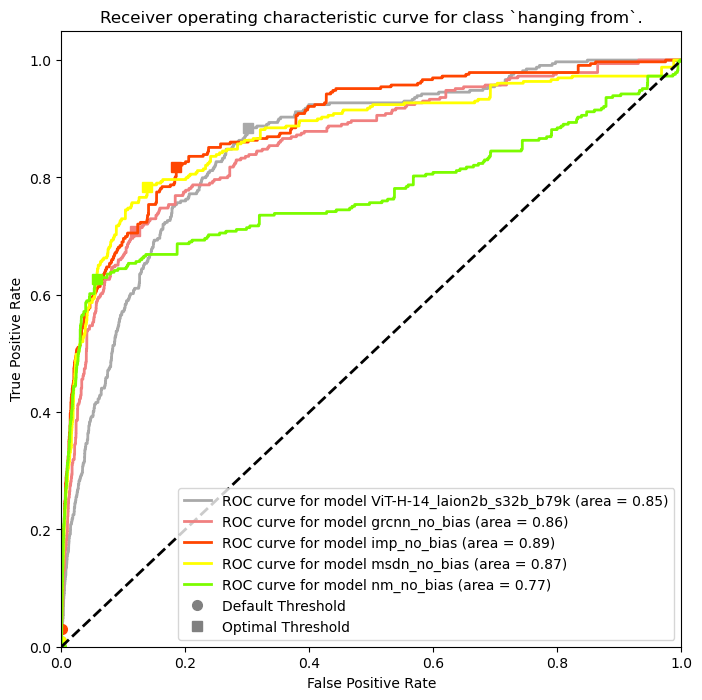

Relation: has


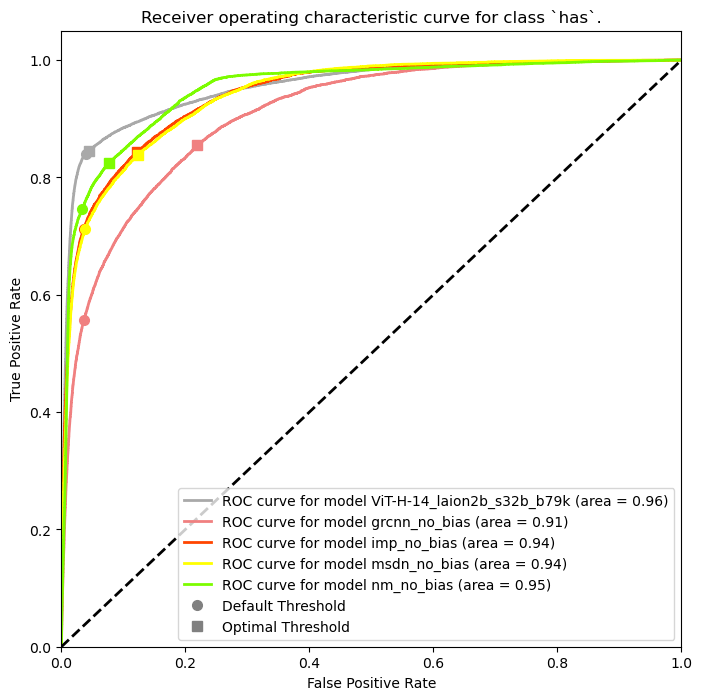

Relation: holding


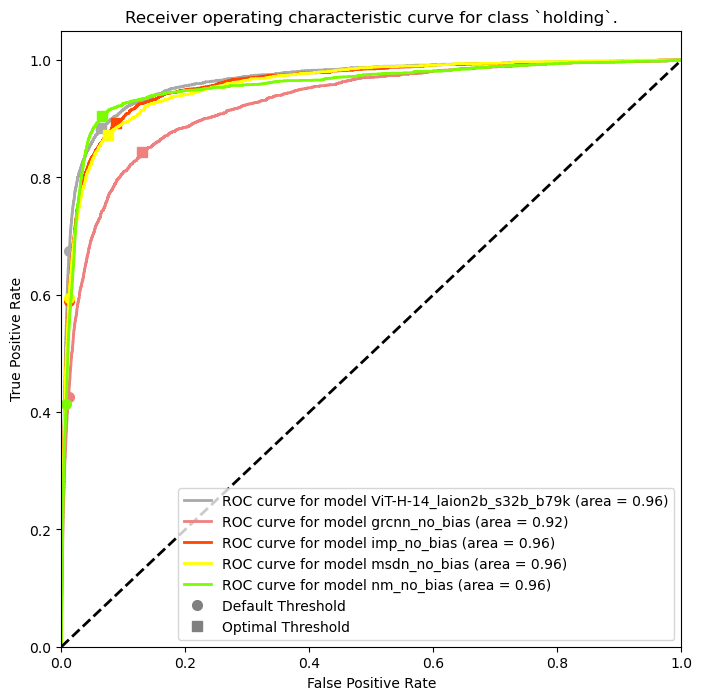

Relation: in


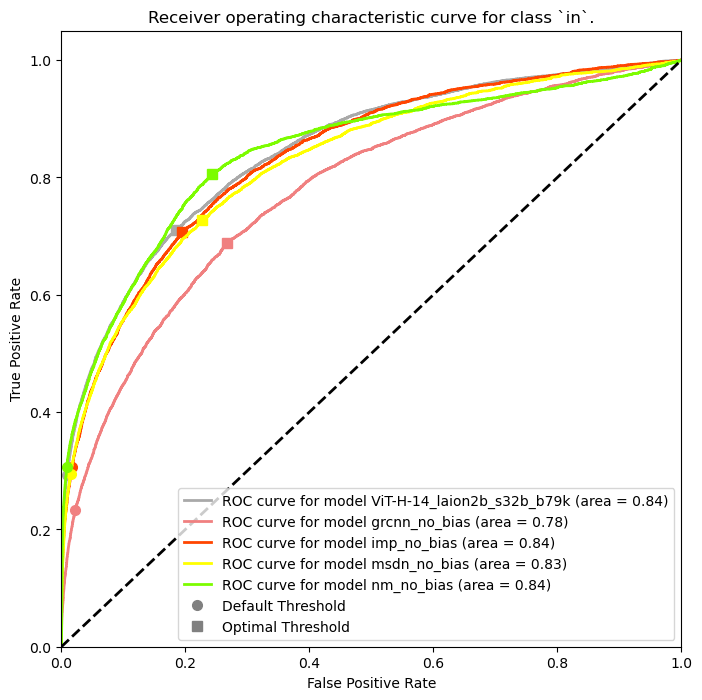

Relation: in front of


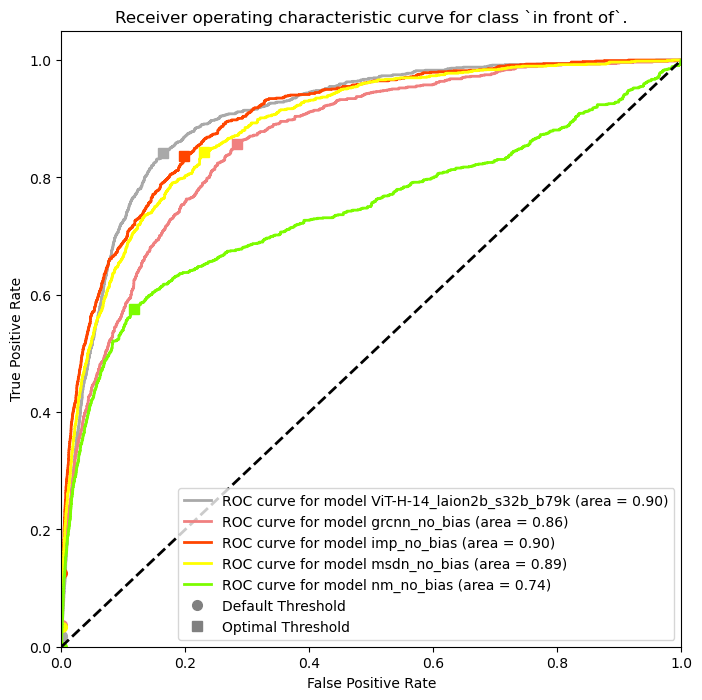

Relation: laying on


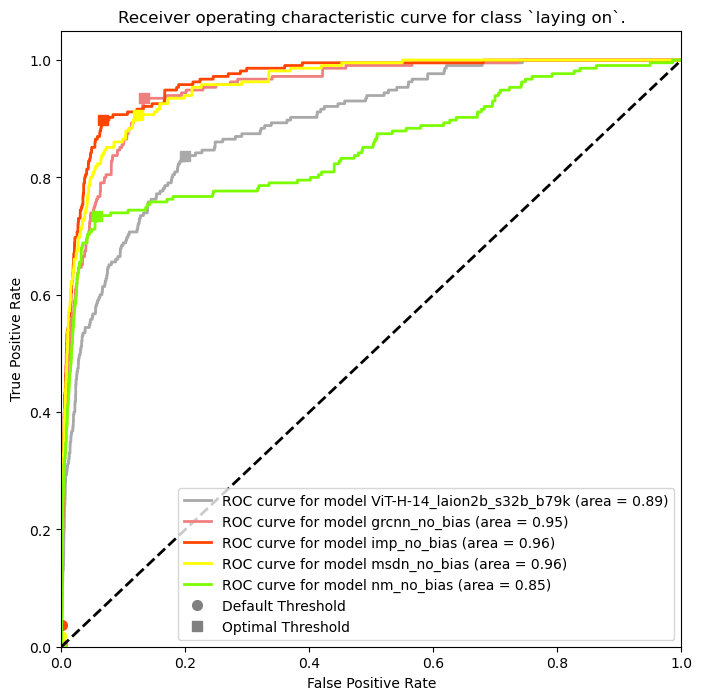

Relation: looking at


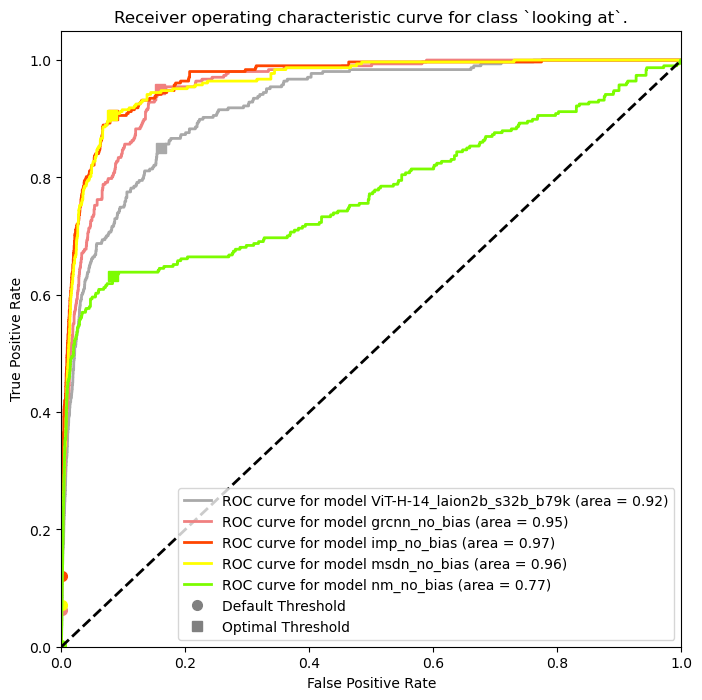

Relation: lying on


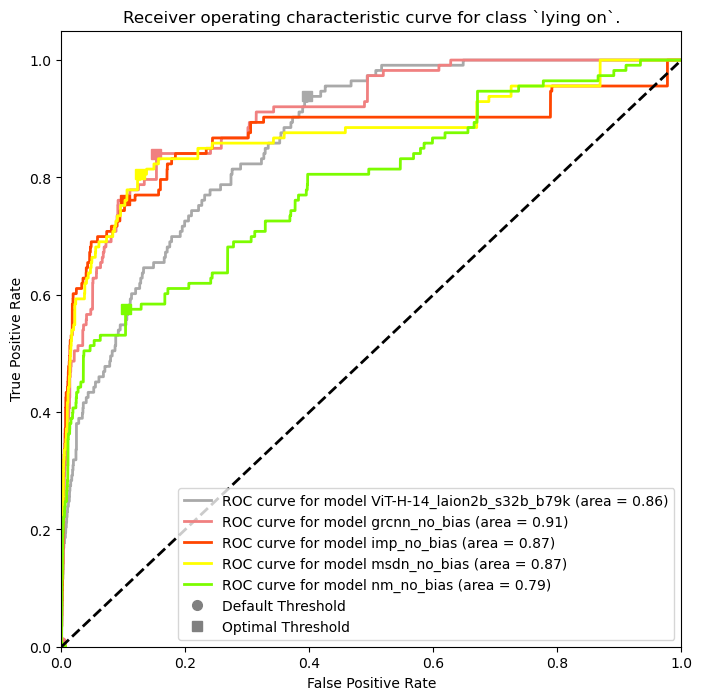

Relation: made of


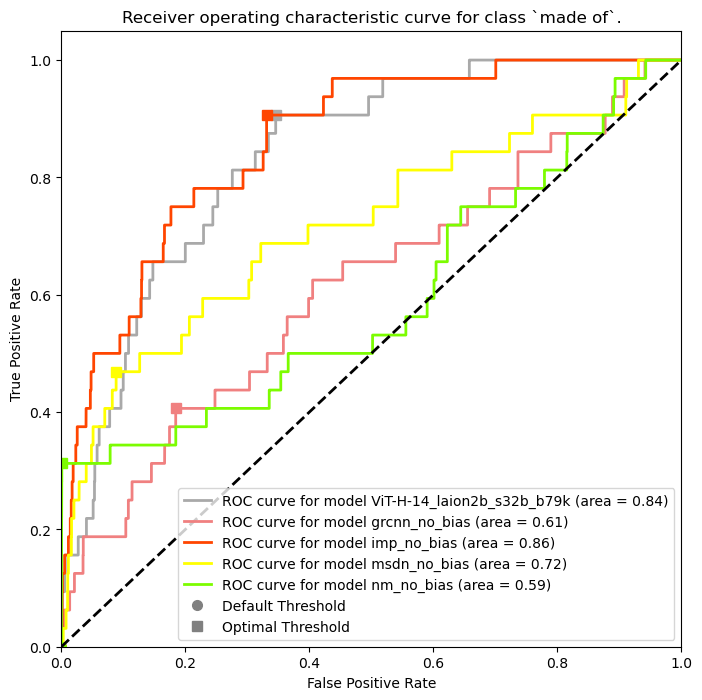

Relation: mounted on


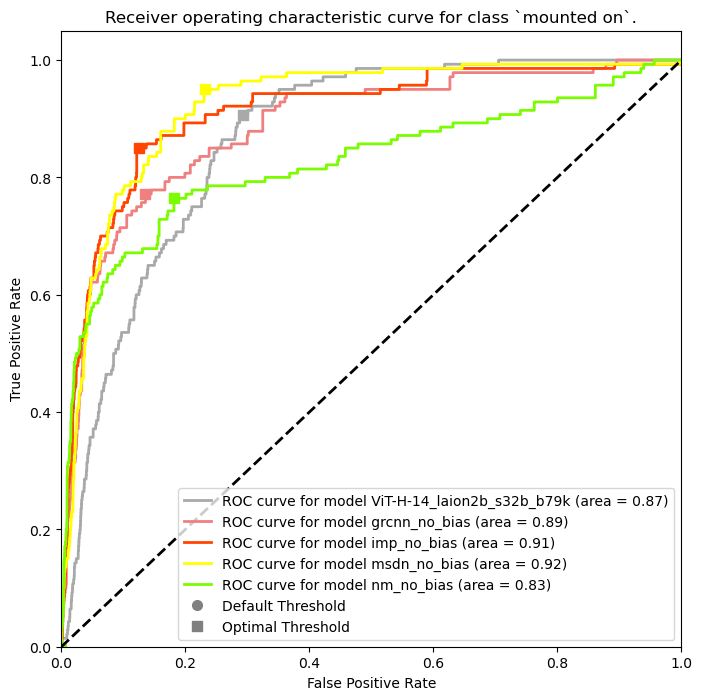

Relation: near


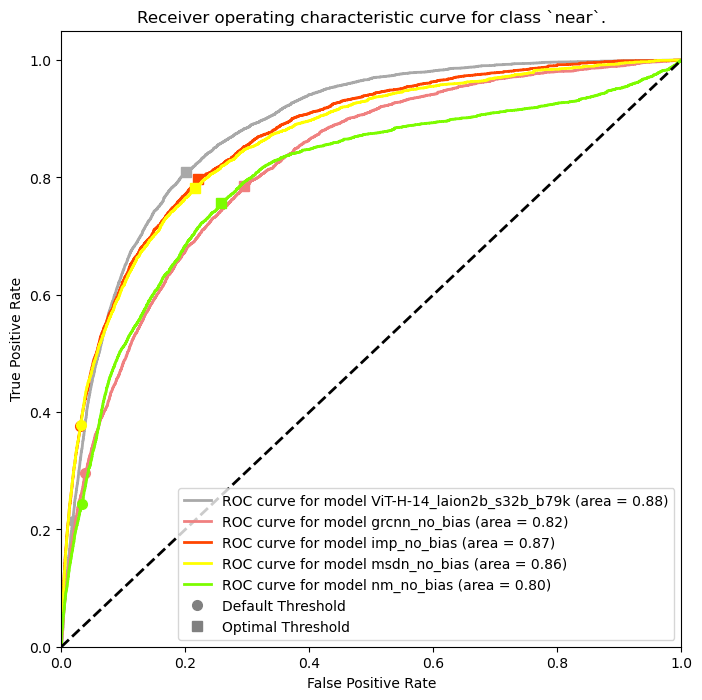

Relation: of


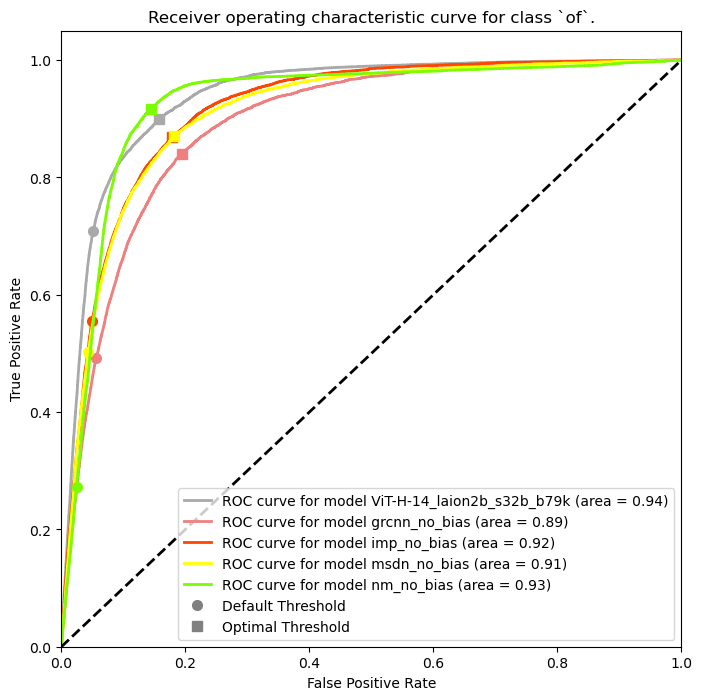

Relation: on


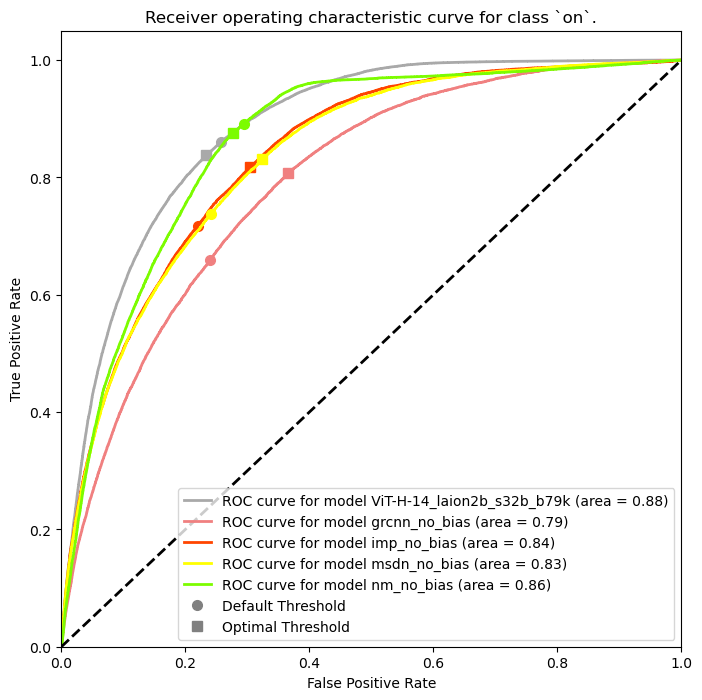

Relation: on back of


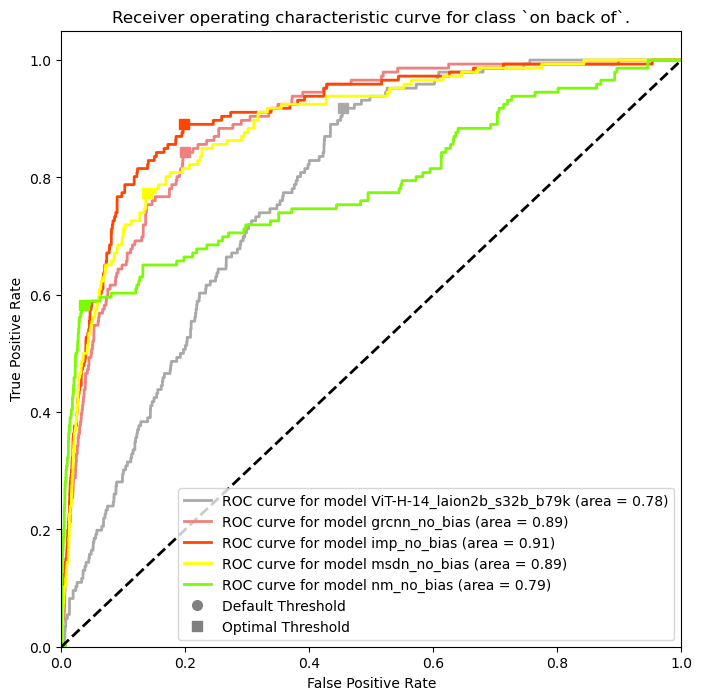

Relation: over


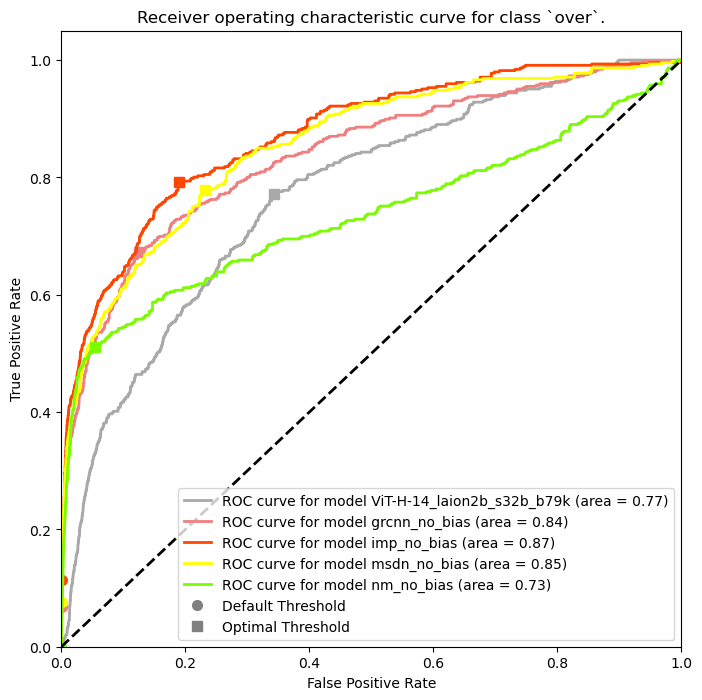

Relation: painted on


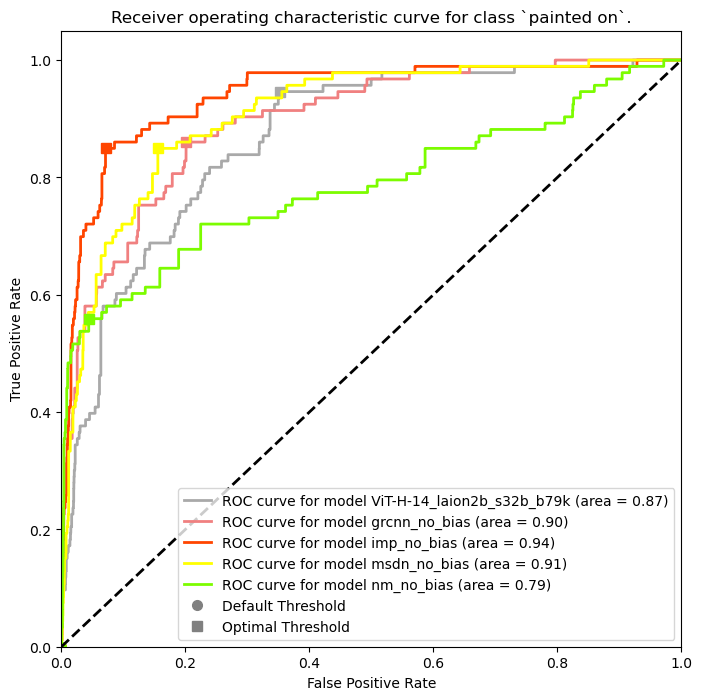

Relation: parked on


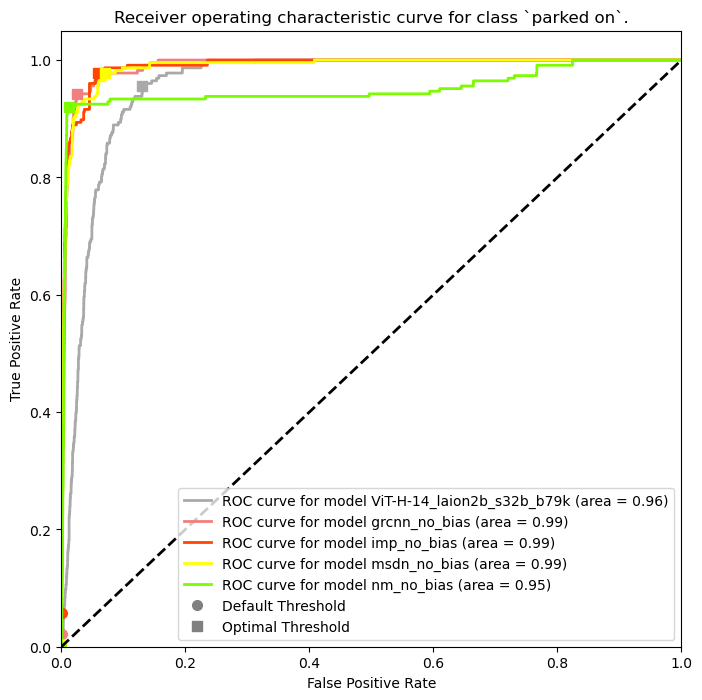

Relation: part of


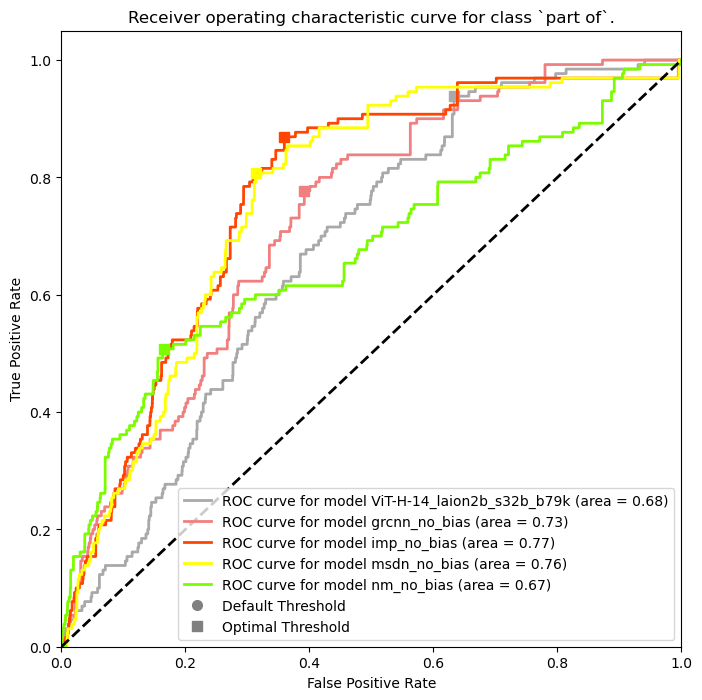

Relation: playing


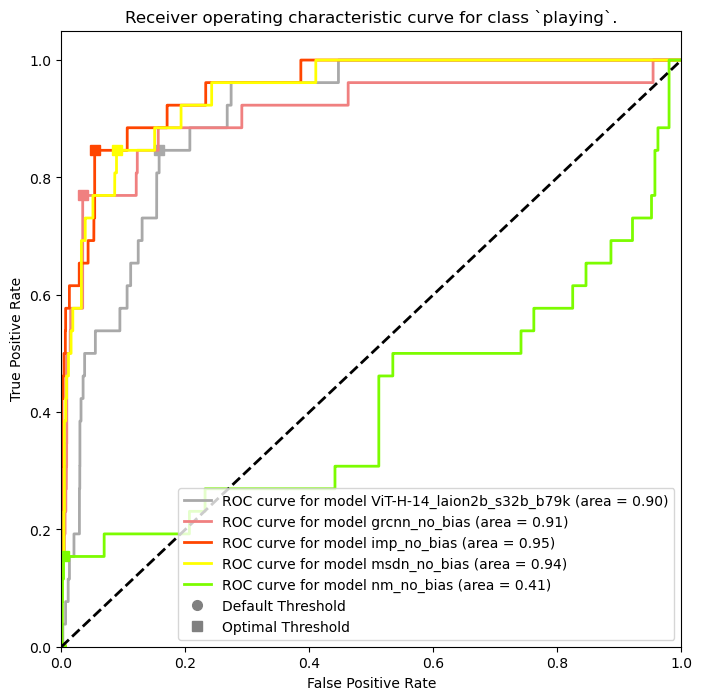

Relation: riding


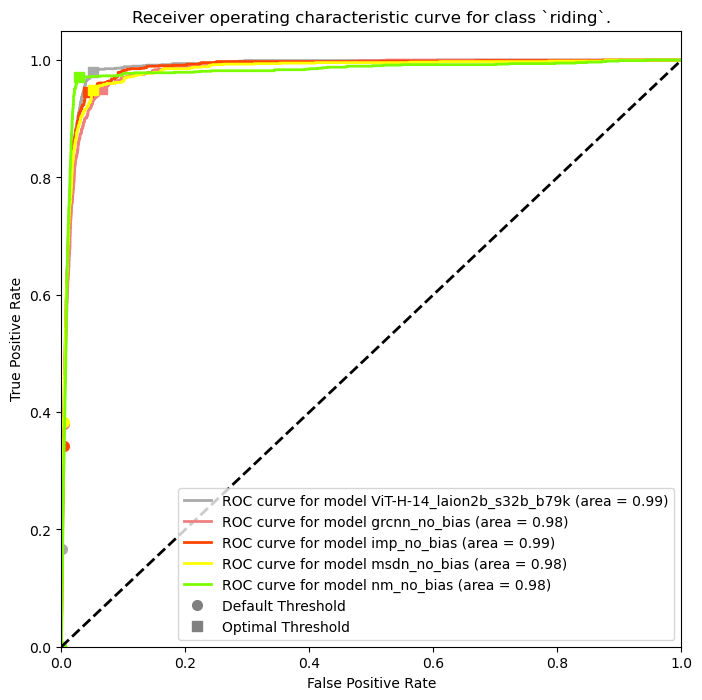

Relation: says


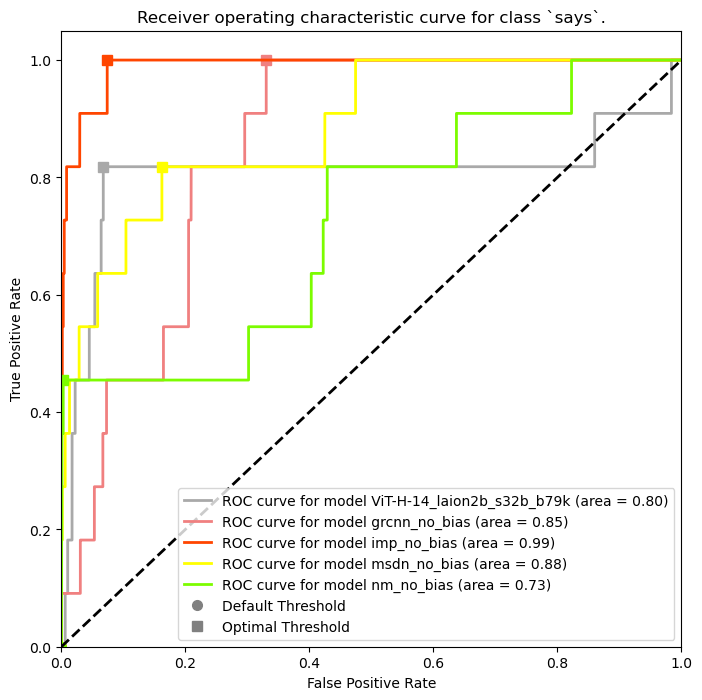

Relation: sitting on


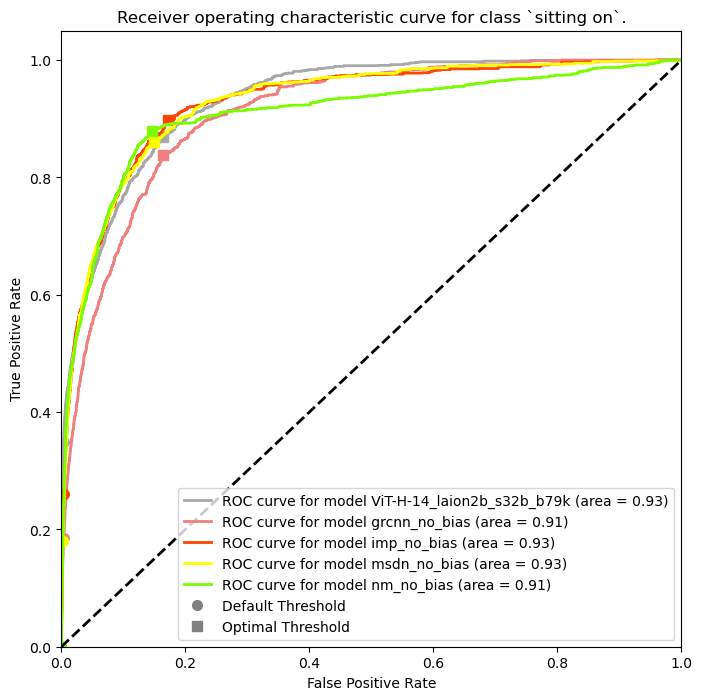

Relation: standing on


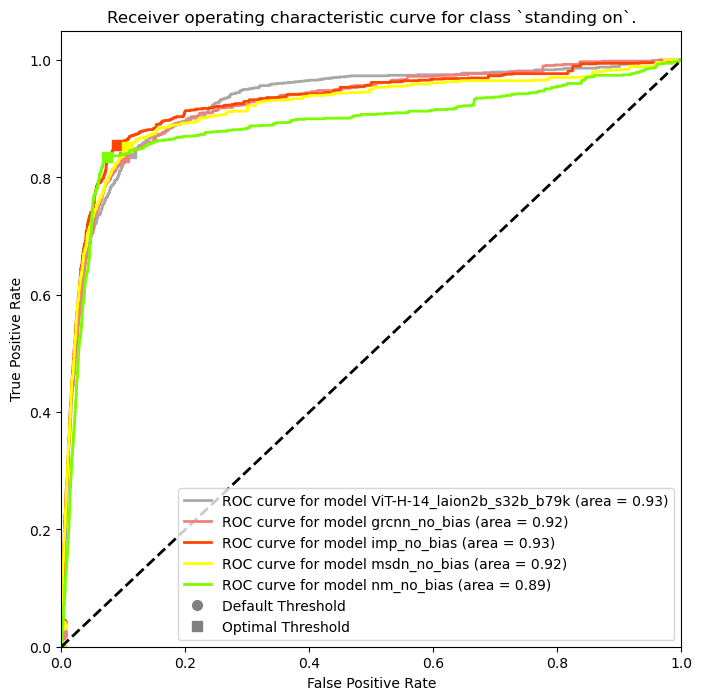

Relation: to


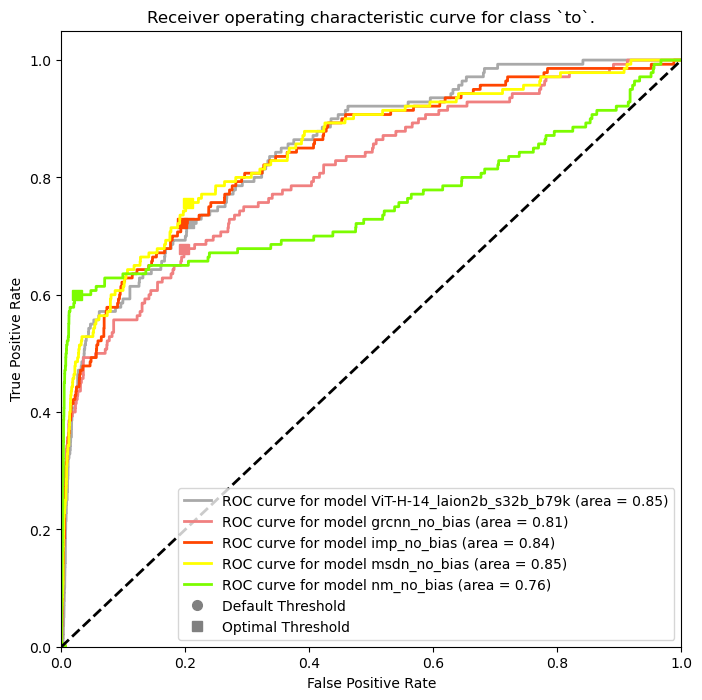

Relation: under


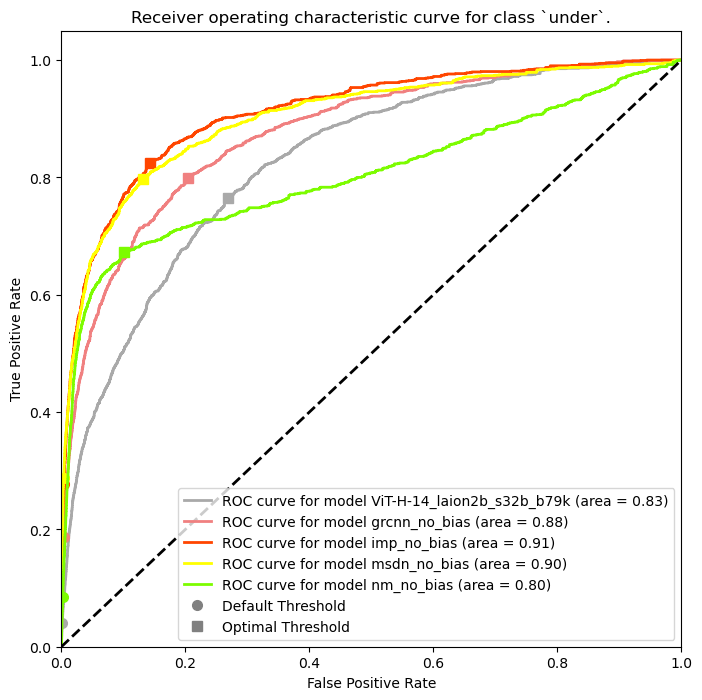

Relation: using


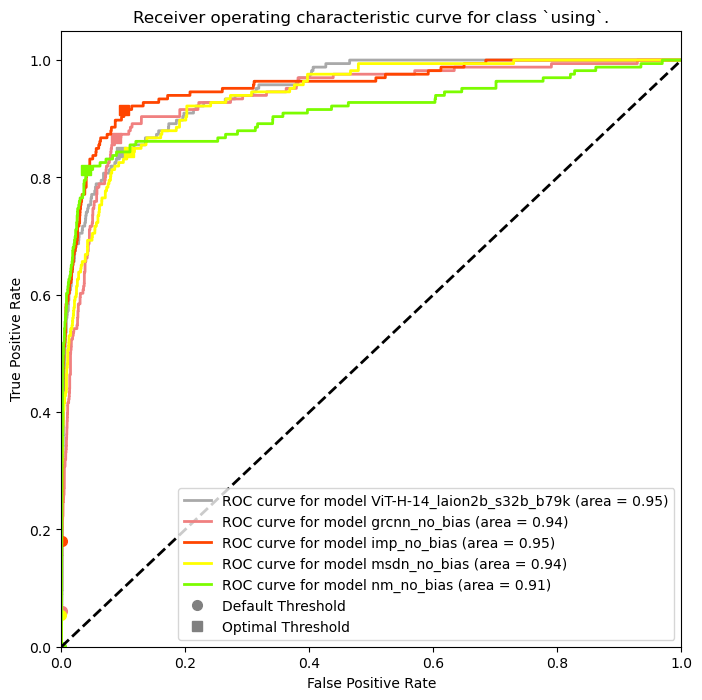

Relation: walking in


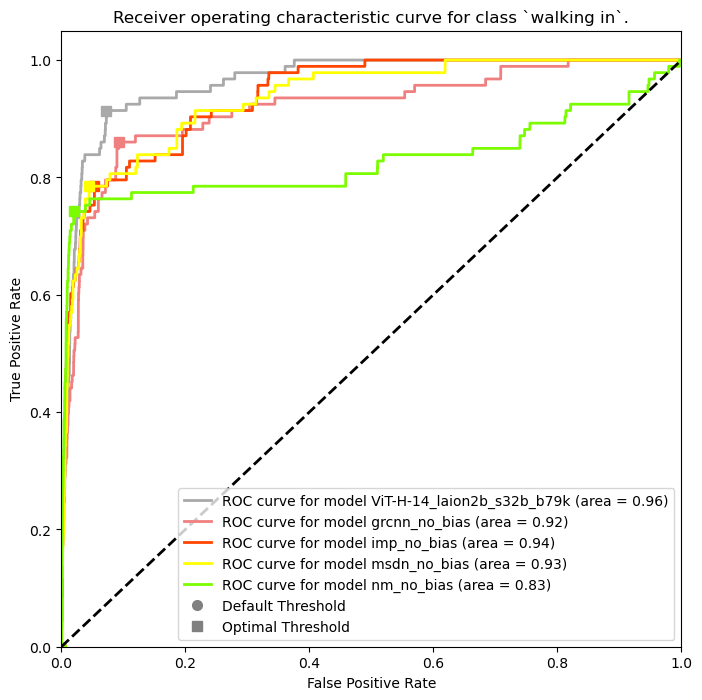

Relation: walking on


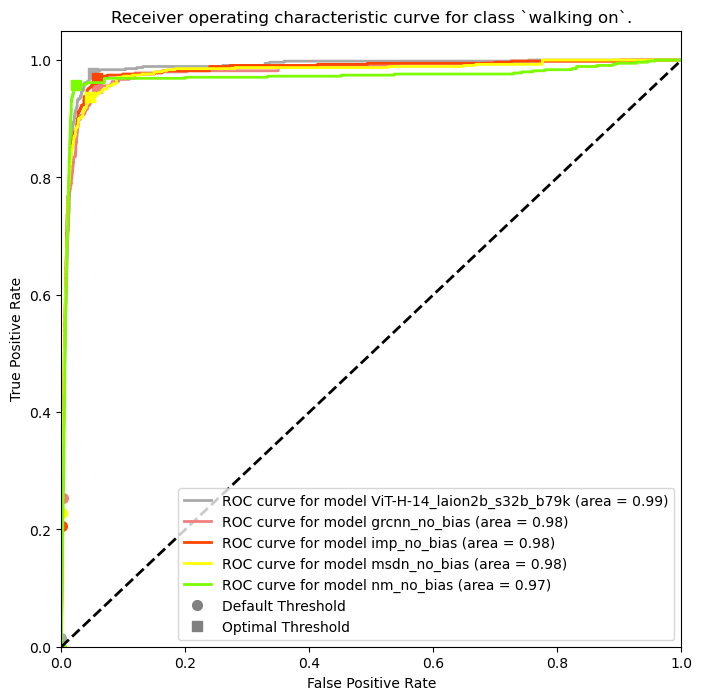

Relation: watching


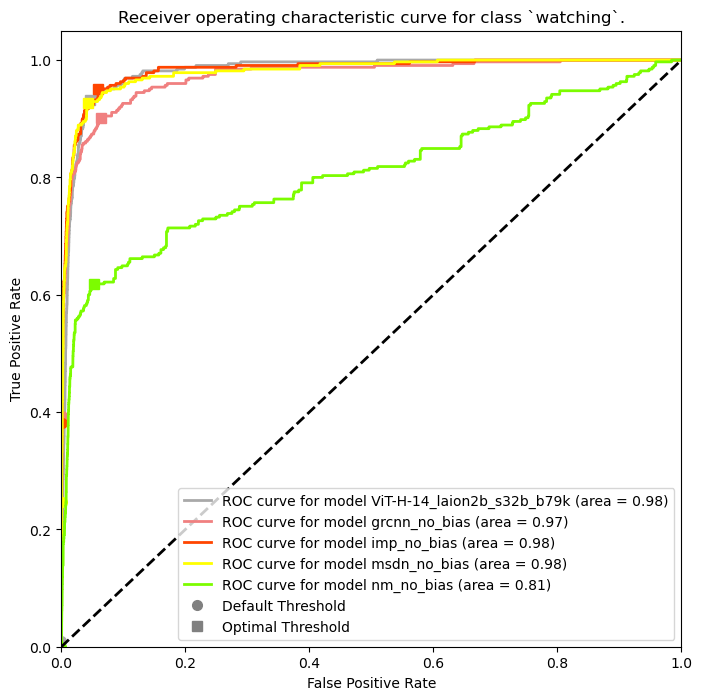

Relation: wearing


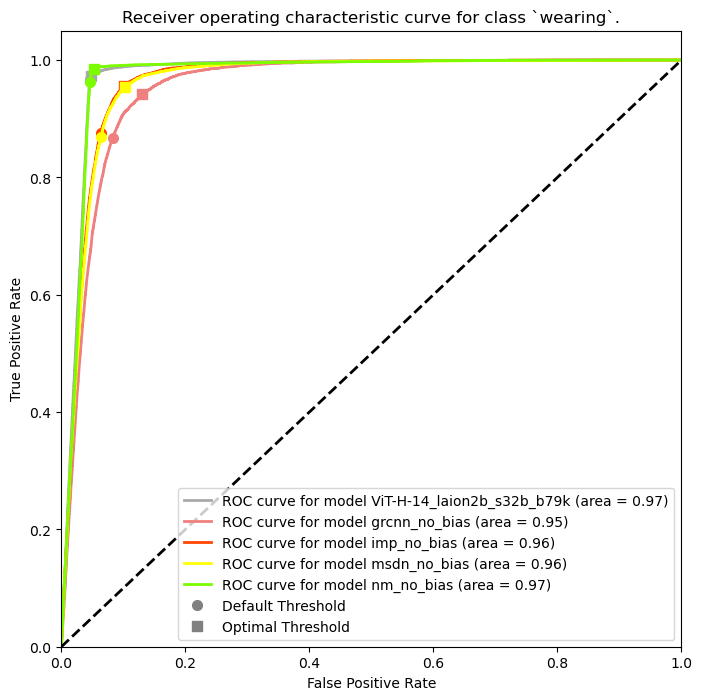

Relation: wears


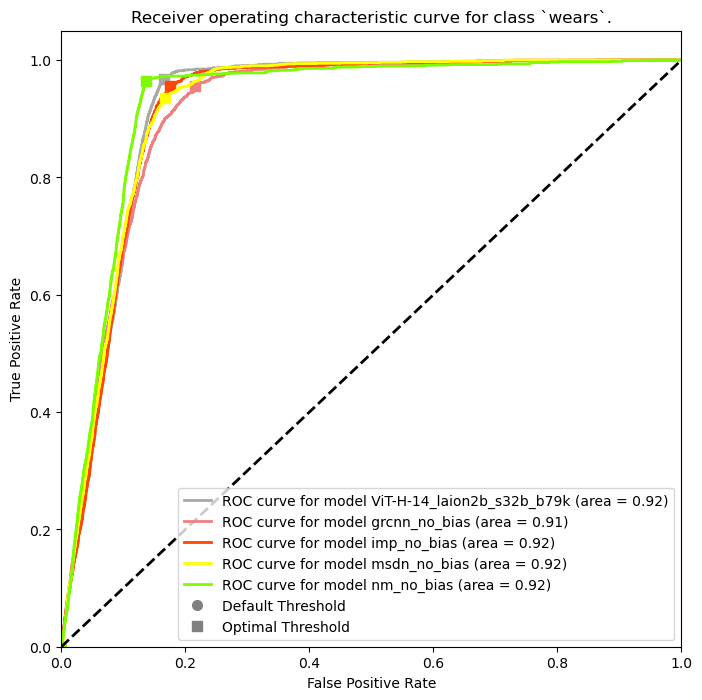

Relation: with


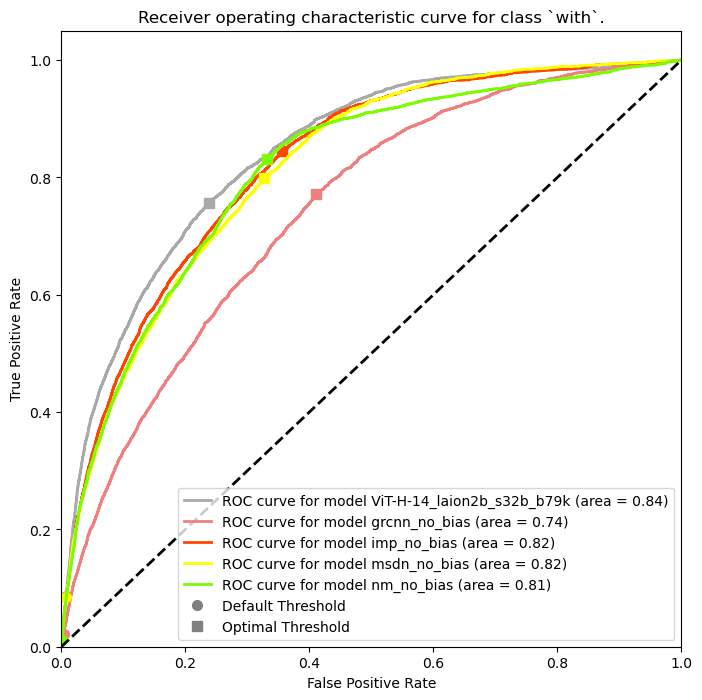

In [31]:
for ind, relationship_name in ind_to_relation.items():
    if (ind == 0):
        continue
    
    print("Relation: {}".format(relationship_name))
    plot_roc_curve(all_roc_results, relation=relationship_name, select=select_no_bias)
    print("========================================================================")

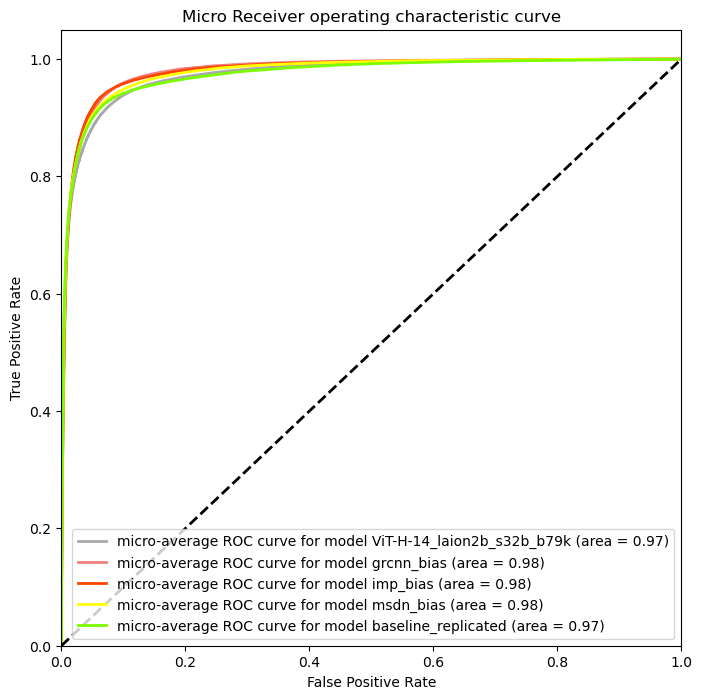

In [188]:
plot_micro_curve(all_roc_results, select=select_with_bias)

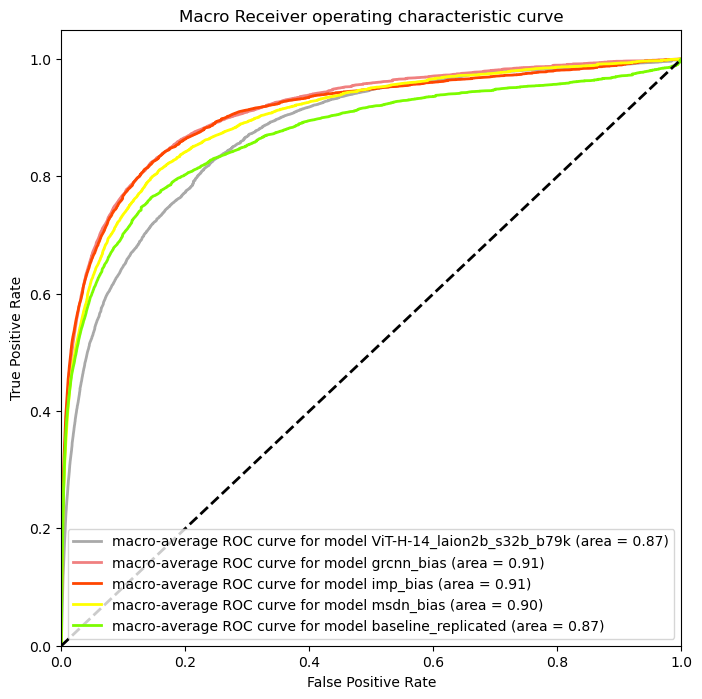

In [189]:
plot_macro_curve(all_roc_results, select=select_with_bias)

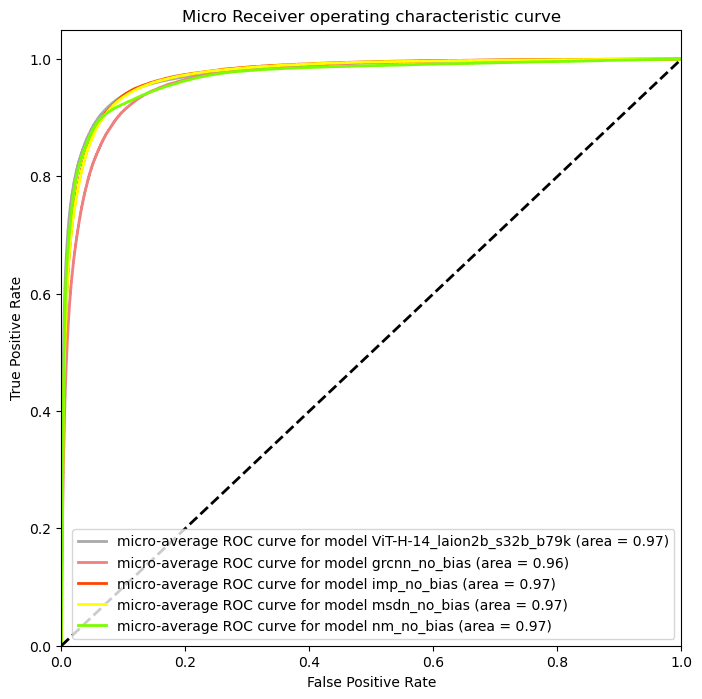

In [186]:
plot_micro_curve(all_roc_results, select=select_no_bias)

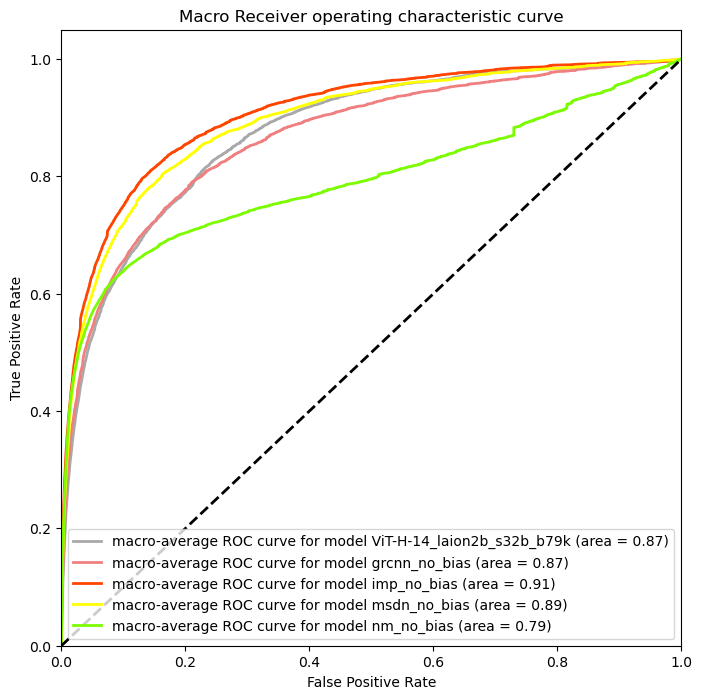

In [187]:
plot_macro_curve(all_roc_results, select=select_no_bias)

# Finetuning CLIP

## Remaining steps for tonight

1. Add custom SupCon Loss
2. Enumerate all image pairs and language triplets for all pairs
3. Create a mask for the language sentences
4. Perform dot products between the image scaled features and language scaled features
5. Cross Entropy between predictions and results based on the relevant mask


In [139]:
from torch import nn
import torch.nn.functional as F
import open_clip

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

class Mlp(nn.Module):
    def __init__(self, in_features, hidden_features=None, out_features=None,
                 act_layer=nn.GELU, drop=0.2):
        super().__init__()
        out_features = out_features or in_features
        hidden_features = hidden_features or in_features
        self.fc1 = nn.Linear(in_features, hidden_features)
        self.act = act_layer()
        self.fc2 = nn.Linear(hidden_features, out_features)
        self.drop = nn.Dropout(drop)

    def forward(self, x):
        x = self.fc1(x)
        x = self.act(x)
        x = self.drop(x)
        x = self.fc2(x)
        return x

class XEntLoss(nn.Module):

    def __init__(
            self,
            model_name=None,
            pretrained_model=None,
            local_loss=False,
            gather_with_grad=False,
            cache_labels=False,
            rank=0,
            world_size=1,
            use_horovod=False,
            use_spatial=False
    ):
        super().__init__()
        self.local_loss = local_loss
        self.gather_with_grad = gather_with_grad
        self.cache_labels = cache_labels
        self.rank = rank
        self.world_size = world_size
        self.use_horovod = use_horovod
        
        # backbone and 
        self.clip, self.preprocess = self._clip_init(model_name, pretrained_model)

        #spatial module
        if (use_spatial):
            self.fc_spatial = mlp(in_features=22, hidden_features=64, out_features=64)
        
        # cache state
        self.prev_num_logits = 0
        self.labels = {}
    
    def get_spatial_features(self, relationships, is_negative=False):
        """
        Args:
            data: see data definition in forward function
        Return:
            spatial_features: a tensor of spatial features containing coordinates of the bounding box
        """

        def spatial_delta(entity1, entity2):
            """
            entity1, entity2: [X,Y,X,Y]
            """

            width1, height1 = entity1[2] - entity1[0], entity1[3] - entity1[1]
            width2, height2 = entity2[2] - entity2[0], entity2[3] - entity2[1]

            delta_feat = [
                (entity1[0] - entity2[0]) / width2,
                (entity1[1] - entity2[1]) / height2,
                np.log(width1 / width2),
                np.log(height1 / height2),
            ]
            return delta_feat

        def spatial_coordinates(entity):
            """
            entity: [X,Y,X,Y]
            """
            width, height = entity[2] - entity[0], entity[3] - entity[1]
            coordinate_feat = [
                entity[0] / 800,
                entity[1] / 800,
                entity[2] / 800,
                entity[3] / 800,
                width * height / 800 * 800,
            ]
            return coordinate_feat

        spatial_features = []
        # iterate through every relationship pair and construct an array of spatial feature
        for subj_bbox, obj_bbox, union_bbox in zip(
            relationships["subj_bboxes"],
            relationships["obj_bboxes"],
            relationships["union_bboxes"],
        ):
            feat = []
            # XYXY
            if is_negative:
                feat.extend(spatial_delta(subj_bbox.cpu(), obj_bbox.cpu()))
                feat.extend(spatial_delta(subj_bbox.cpu(), union_bbox.cpu()))
                feat.extend(spatial_delta(union_bbox.cpu(), obj_bbox.cpu()))
                feat.extend(spatial_coordinates(subj_bbox.cpu()))
                feat.extend(spatial_coordinates(obj_bbox.cpu()))
            else:
                feat.extend(spatial_delta(subj_bbox[0], obj_bbox[0]))
                feat.extend(spatial_delta(subj_bbox[0], union_bbox))
                feat.extend(spatial_delta(union_bbox, obj_bbox[0]))
                feat.extend(spatial_coordinates(subj_bbox[0]))
                feat.extend(spatial_coordinates(obj_bbox[0]))

            spatial_features.append(torch.from_numpy(np.asarray(feat)).float().cuda())

        return torch.stack(spatial_features)
                
    def _clip_init(self, model_name, pretrained_model):
        model, preprocess, _= open_clip.create_model_and_transforms(model_name, pretrained=pretrained_model,device=device)

        #freeze all model backbone
        for param in model.parameters():
            param.requires_grad = False
        
        #unfrozen the last layer of the visual transformer
        for name, child in model.visual.transformer.resblocks.named_children():
            if (name == '10' and name == '11'):
                for param in child.parameters():
                    param.requires_grad = True

        for param in model.visual.ln_post.parameters():
            param.requires_grad = True

        model.visual.proj.requires_grad = True
            
        #unfrozen the last layer of the transformer
        for param in model.transformer.resblocks.named_children():
            if (name == '10' and name == '11'):
                for param in child.parameters():
                    param.requires_grad = True
            
        for param in model.ln_final.parameters():
            param.requires_grad = True
        
        model.text_projection.requires_grad = True
        return model, preprocess

    def encode(self, images, tokenized_text):
        image_features, text_features, logit_scale = self.clip(images, tokenized_text)
        
        return image_features, text_features, logit_scale

    def forward(self, images, tokenized_text, image_labels=[], text_labels=[], relationships={}):
        """
        """
        image_features, text_features, logit_scale  = self.encode(images, tokenized_text)
        
        if (not self.training):
            return image_features, text_features, logit_scale

        logits_per_image = logit_scale * image_features @ text_features.T
        logits_per_text = logit_scale * text_features @ image_features.T
        
        total_loss = (
            F.cross_entropy(logits_per_image, image_labels) +
            F.cross_entropy(logits_per_text, text_labels)
        ) / 2
        return total_loss

In [140]:
import wandb
import torchvision
from torch import nn, optim
from maskrcnn_benchmark.data import make_data_loader
from open_clip import ClipLoss
from itertools import chain
from collections import defaultdict

MODEL_CHECKPOINT_PATH = './models/relation_danfeiX_FPN50/openclip'
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu") 

relations = [ind_to_relation[key] for key in range(len(ind_to_relation))]
relations[0] = "has no relation with"
memo_count = {}
ind_to_relation[0] = "has no relation with"

def rate(step, model_size, factor, warmup):
    """
    Learning Rate Scheduler: we have to default the step to 1 for LambdaLR function
    to avoid zero raising to negative power.
    """
    if step == 0:
        step = 1
    
    # resets warm up every 20000 steps
    multiple = {
        0: 1,
        1: 1.5,
        2: 2.5,
        3: 4,
        4: 4
    }
    
    return factor * (
        (multiple[step // 15000] * model_size) ** (-0.5) * min(step ** (-0.5), step * warmup ** (-1.5))
    )

def get_negative_examples(triplet, gt_triplets, relations=relations, n_example=2):
    """
        Start out with random sampling
    """
    # no background included
    if ((triplet[0], triplet[2]) not in memo_count):
        count = torch.ones(len(relations))
        multinomial_distribution = torch.ones(len(relations))
        multinomial_distribution[triplet[1]] = 0
    else:
        count = memo_count[(triplet[0], triplet[2])]
        multinomial_distribution = max(count) - count
        multinomial_distribution = torch.clamp(multinomial_distribution, 1, max(torch.mean(multinomial_distribution), 25))
        multinomial_distribution[triplet[1]] = 0
        count[triplet[1]] = 0
    
    cnt_zeros = 1
    for gt_triplet in gt_triplets:
        if (triplet[0] == gt_triplet[0].item() and triplet[2] == gt_triplet[2].item()):
            multinomial_distribution[gt_triplet[1]] = 0
            cnt_zeros += 1
    
    selections = torch.multinomial(multinomial_distribution, min(49-cnt_zeros,n_example), replacement=False)
    for selection in selections:
        count[selection] += 1

    memo_count[(triplet[0], triplet[2])] = count
    return selections

def get_all_examples(triplet, relations=relations):
    selections = [i for i in range(len(relations))]
    selections.remove(triplet[1] - 1)

    return selections

def get_sentences_from_triplet(triplet, gt_triplets, n_negatives=2):
    #pick one positive and two negative <- how can we pick negative
    CLIP_TRIPLE_SENTENCE = '{} {} {}'
    
    all_sentences = [CLIP_TRIPLE_SENTENCE.format(ind_to_class[triplet[0]], ind_to_relation[triplet[1]], ind_to_class[triplet[2]])]
    mask = [1]
    
    if (n_negatives == 0):
        return all_sentences, mask
    
    neg_relations = get_negative_examples(triplet, gt_triplets, n_example=n_negatives)
#     neg_relations = get_all_examples(triplet)
    for relation in neg_relations:
        if (relation == (triplet[1])):
            print("This is not good")
        all_sentences.append(CLIP_TRIPLE_SENTENCE.format(ind_to_class[triplet[0]], ind_to_relation[relation.item()], ind_to_class[triplet[2]]))
        mask.append(0)
        
    return all_sentences, mask

def enumerate_pair_bboxes(boxes, classes, gt_triplets, gt_triplet_boxes):
    """
        Given an array of box, the following function enumerates all possible combinations of the box
        gt_triplets contains null relationship
        Args:
            boxes: ground truth object bboxes
            classes: ground truth object classes
    """
    box_subj = torch.tensor(boxes).to(device)
    box_obj = torch.tensor(boxes).to(device)
    
    box_subj = box_subj.unsqueeze(1).repeat(1, box_subj.shape[0], 1)
    box_obj = box_obj.unsqueeze(0).repeat(box_obj.shape[0], 1, 1)
    
    proposal_box_pairs_per_image = torch.cat((box_subj.view(-1, 4), box_obj.view(-1, 4)), 1)

    idx_subj = torch.arange(box_subj.shape[0]).view(-1, 1, 1).repeat(1,box_obj.shape[0], 1).view(-1, 1).to(device)
    idx_obj = torch.arange(box_obj.shape[0]).view(1, -1, 1).repeat(box_subj.shape[0], 1, 1).view(-1, 1).to(device)
    
    proposal_idx_pairs_per_image = torch.cat((idx_subj, idx_obj), 1)
    keep_idx = (proposal_idx_pairs_per_image[:, 0] != proposal_idx_pairs_per_image[:, 1]).nonzero(as_tuple=False).view(-1)
    
    #randomized keep_idx and ensure ground truth is kept
    indices_random = torch.randperm(len(keep_idx))[:min(len(keep_idx), 64)]
    keep_idx = keep_idx[indices_random]

    # Ensure that ground truth is kept
    gt_triplet_boxes_tensor = torch.tensor(gt_triplet_boxes).to(device)

    for gt_triplet, gt_triplet_box in zip(gt_triplets, gt_triplet_boxes_tensor):
        ind = torch.all(proposal_box_pairs_per_image == gt_triplet_box, dim=1).nonzero(as_tuple=True)[0]
        if (len(ind) > 1):
            ind = ind[0].unsqueeze(dim=0)
        if (ind.item() not in keep_idx):            
            keep_idx = torch.cat((keep_idx, ind))

    #filter out kept indices
    proposal_box_pairs_per_image = proposal_box_pairs_per_image[keep_idx]
    
    #idx subject and object filtered
    idx_obj = idx_obj[keep_idx]
    idx_subj = idx_subj[keep_idx]
        
    #assigned ground truth relations
    image_rel_labels = torch.zeros(proposal_box_pairs_per_image.shape[0]) # add one for null image
    behind_tensor = torch.zeros((0, gt_triplet_boxes_tensor.shape[1])).to(device)
    infront_of_tensor = torch.zeros((0, gt_triplet_boxes_tensor.shape[1])).to(device)
    
    for gt_triplet, gt_triplet_box in zip(gt_triplets, gt_triplet_boxes_tensor):
        ind = torch.all(proposal_box_pairs_per_image == gt_triplet_box, dim=1).nonzero(as_tuple=True)[0]
        
        if (ind.nelement() == 0):
            print("Errror")
        if (len(ind) > 1):
            ind = ind[0].unsqueeze(dim=0)
        
        image_rel_labels[ind.item()] = gt_triplet[1]
        if (ind_to_relation[gt_triplet[1]] == 'behind'):
            new_bbox = torch.cat((gt_triplet_box[4:], gt_triplet_box[0:4]), 0).unsqueeze(0)
            new_ind = torch.all(proposal_box_pairs_per_image == new_bbox, dim=1).nonzero(as_tuple=True)[0]
            if (image_rel_labels[ind.item()] == 0):
                image_rel_labels[ind.item()] = relation_to_ind['in front of']
            
        elif (ind_to_relation[gt_triplet[1]] == 'in front of'):
            new_bbox = torch.cat((gt_triplet_box[4:], gt_triplet_box[0:4]), 0).unsqueeze(0)
            new_ind = torch.all(proposal_box_pairs_per_image == new_bbox, dim=1).nonzero(as_tuple=True)[0]
            if (image_rel_labels[ind.item()] == 0):
                image_rel_labels[ind.item()] = relation_to_ind['behind']

    # number of negative sentences
    n_negatives = 1
    for j_neg in range(49):
        if (len(gt_triplet) * (j_neg + 1) <= 400):
            n_negatives = j_neg + 1
    
    # populate textual sentences and get image_labels
    all_sentences = []
    image_labels = []
    text_labels_dict = defaultdict(set)
    mapping = {}
    cnt = 1
    for idx_s, pred_ind, idx_o in zip(idx_subj, image_rel_labels, idx_obj):
        subj_ind = classes[idx_s].item()
        obj_ind = classes[idx_o].item()
        pred_ind = int(pred_ind.item())
        
        # check if it is ground truth triplet
        num_negatives = 0
        for gt_triplet in gt_triplets:
            if (subj_ind == gt_triplet[0].item() and obj_ind == gt_triplet[2].item()):
                num_negatives = n_negatives
        
        # get more negative examples if it is 
        sentences, _ = get_sentences_from_triplet((subj_ind, pred_ind, obj_ind), gt_triplets, n_negatives=num_negatives)
        
        #image_labels (No background text and image)
        gt_sentence = sentences[0]
        if (gt_sentence not in mapping):
            mapping[gt_sentence] = len(all_sentences)
            all_sentences.append(gt_sentence)
        image_labels.append(mapping[gt_sentence])

        for i, sentence in enumerate(sentences[1:]):
            if (sentence not in mapping):
                mapping[sentence] = len(all_sentences)
                all_sentences.append(sentence)
        
        #text_labels (image_id start at 1). 0 is for empty image
        text_labels_dict[mapping[gt_sentence]].add(cnt)
        for sentence in sentences[1:]:
            text_labels_dict[mapping[sentence]].add(0) # null image
        cnt += 1
    
    # convert text_labels_dict to text_labels (got background text and image)
    text_labels = torch.zeros((len(all_sentences) + 1, len(idx_subj) + 1))
    
    for key, label_set in text_labels_dict.items():
        for image_ind in label_set:
            text_labels[key + 1, image_ind] = 1

    return proposal_box_pairs_per_image, all_sentences, image_labels, text_labels

def _finetune_clip(model_name, pretrained_model, project_name, dataset, is_object_cls=False, chkpoint_name=None, memo_count=memo_count):
    """
        finetuning clip 
    """
    # temporary evaluate to get dimension
    model = XEntLoss(
        model_name=model_name,
        pretrained_model = pretrained_model,
        local_loss=True,
        cache_labels=True,
        rank=0,
        world_size=1,
        use_horovod=False).to(device)
    
    
    optimizer = optim.AdamW(model.parameters(), lr=0.05, betas=(0.9,0.98), eps=1e-6, weight_decay=0.0001) #Params used from paper, the lr is smaller, more safe for fine tuning to new dataset
    lr_scheduler = optim.lr_scheduler.LambdaLR(optimizer=optimizer, lr_lambda=lambda step: rate(step, 1, 1, 1000))
    
    memo_count.clear()
    learning_rates = []
    running_loss = []
    max_norm_gradient_clip = 2.0
    no_relation_image = Image.new('RGB', (32, 32))
    checkpoint_it = 0
    if (chkpoint_name is not None):
        checkpoint = get_model_checkpoint(chkpoint_name)
        optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
        if ('memo_count' in checkpoint):
            memo_count = checkpoint['memo_count']
        checkpoint_it = checkpoint['it']
    
    def crop_img(image, bbox):
        return image.crop((bbox[0],bbox[1],bbox[2],bbox[3]))
    
    for iteration, data_batch in enumerate(dataset):
        
        if (iteration <= checkpoint_it - 250):
            continue
        
        # Clear accumulating gradients
        optimizer.zero_grad()

        # Getting ground truth targets relation and bounding boxes
        image, targets, image_ids = data_batch[0], data_batch[1], data_batch[2]
        
        gt_classes = targets.get_field("labels").cpu()
        gt_boxes = targets.bbox.cpu().numpy()
        gt_rels = targets.get_field("pred_labels").cpu()

        num_gt_boxes = gt_boxes.shape[0]
        gt_relations = gt_rels.nonzero(as_tuple=False).numpy()
        gt_classes = gt_classes.view(-1, 1).numpy()

        gt_rels_view = gt_rels.contiguous().view(-1)
        gt_pred_labels = gt_rels_view[gt_rels_view.nonzero(as_tuple=False).squeeze()].contiguous().view(-1, 1).numpy()
        
        # fewer than two relations (Ignore this sample)
        num_gt_relations = gt_relations.shape[0]
        if num_gt_relations < 1:
            continue

        gt_class_scores = np.ones(num_gt_boxes)
        gt_predicate_scores = np.ones(num_gt_relations)


        gt_triplets, gt_triplet_boxes, _ = _triplet(gt_pred_labels,
                                                    gt_relations,
                                                    gt_classes,
                                                    gt_boxes,
                                                    gt_predicate_scores,
                                                    gt_class_scores)
        gt_union_boxes = boxes_union(gt_triplet_boxes[:,:4], gt_triplet_boxes[:,4:])

        if (is_object_cls):
            # Crop image into multiple object images before preprocessing it
            images = [crop_img(image, bbox) for bbox in gt_boxes]
            sentences = class_sentences
            tokenized_sentences = open_clip.tokenize(sentences).to(device)
            
            # Prepare labels
            image_labels = gt_rels - 1
            
        else:
            # Enumerate images
            pair_bboxes, all_sentences, image_labels, text_labels = enumerate_pair_bboxes(gt_boxes, gt_classes, gt_triplets, gt_triplet_boxes)
            enum_union_boxes = boxes_union(pair_bboxes[:,:4].cpu(), pair_bboxes[:,4:].cpu())
            
            # Crop image into multiple images before preprocessing it
            images = [crop_img(image, bbox) for bbox in enum_union_boxes]

            # Insert Null Relation Image
            images.insert(0, no_relation_image)
            
            # Insert Null Relation Text
            all_sentences.insert(0, 'null')
            
            # Update labels
            image_labels = [lab + 1 for lab in image_labels]            
            image_labels.insert(0, 0)
            text_labels[0, 0] = 1
            
#             print("image_labels len:",len(image_labels))
#             print("images len:",len(images))
#             print("all_sentences len:",len(all_sentences))
#             print("image_labels max:",max(image_labels))

#             for kk in range(len(images)):
#                 display(images[kk])
#                 print(all_sentences[image_labels[kk]])            

            # Perpare labels
            image_labels = torch.tensor(image_labels).to(device)
            text_labels = torch.tensor(text_labels).to(device)
            
            # Prepare images
            images = torch.stack([model.preprocess(img) for img in images]).to(device)
            
            # Prepare sentences
            tokenized_sentences = open_clip.tokenize(all_sentences).to(device)
            
#             image_features, text_features, logits_scale = model(images, tokenized_sentences, image_labels=image_labels, text_labels=text_labels)

            # Prepare labels
#             image_labels = torch.arange(image_features.shape[0]) * (n_negatives + 1)
#             image_labels[-1] = text_features.shape[0]-1
#             text_labels = torch.div(torch.arange(text_features.shape[0]), (n_negatives + 1), rounding_mode='trunc')
#             text_labels = text_labels * torch.tensor(masks)
#             text_labels[text_labels == 0] = image_features.shape[0] - 1
#             text_labels[0] = 0

        # TODO: customize loss function to take negative examples into considerations
        total_loss = model(images, tokenized_sentences, image_labels=image_labels, text_labels=text_labels)
        total_loss.backward()
        running_loss.append(total_loss.item())
        
        # Gradient Clipping
        if (max_norm_gradient_clip):
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm_gradient_clip, norm_type=2.0)

        optimizer.step()
        lr_scheduler.step()
        
        # Logging wandb every 200 steps
        if (iteration % 199 == 1):
            last_lr = lr_scheduler.get_last_lr()[0]
            learning_rates.append(last_lr)
            logging = {'running_loss': sum(running_loss)/len(running_loss), 'lr': last_lr}
            print(logging)
            wandb.log(logging, step=iteration)
            
            #reset params
            running_loss = []
        
        # create checkpoints every 10000 steps
        if (iteration % 9999 == 0):
            save_model_checkpoint(project_name, model, optimizer, iteration, memo_count)
        
    save_model_checkpoint(f'{project_name}_final', model, optimizer, iteration, memo_count)

def finetune_clip(model_name, pretrained_model_name, chkpoint_name=None, is_testing=True):
    start_iter = 0
    project_name = f'attn_finetuned_two_{model_name}_{pretrained_model_name}'
    
    if (not is_testing):
        wandb.init(project=project_name)

    train_dataloader = make_data_loader(
        cfg,
        is_train=True,
        is_distributed=False,
        start_iter=start_iter,
    )
    
    _finetune_clip(model_name, pretrained_model_name, project_name, train_dataloader.dataset, chkpoint_name=chkpoint_name)

In [ ]:
finetune_clip('ViT-B-32', 'laion400m_e32', is_testing=True)

In [143]:
# OPEN_CLIP_MODELS = ['RN50', 'RN101', 'ViT-B-16', 'ViT-B-32', 'ViT-L-14', 'ViT-L-14', 'ViT-H-14']
# OPEN_CLIP_PRETRAINED_DATASETS = ['openai', 'openai', 'laion400m_e32', 'laion2b_s34b_b79k', 'laion400m_e32', 'laion2b_s32b_b82k', 'laion2b_s32b_b79k']

OPEN_CLIP_MODELS = ['ViT-B-16','ViT-B-32', 'ViT-B-32', 'ViT-L-14', 'ViT-L-14', 'ViT-H-14']
OPEN_CLIP_PRETRAINED_DATASETS = ['laion400m_e32', 'laion400m_e32', 'laion2b_s34b_b79k', 'laion400m_e32', 'laion2b_s32b_b82k', 'laion2b_s32b_b79k']

for i in range(0, len(OPEN_CLIP_PRETRAINED_DATASETS)):
    finetune_clip(OPEN_CLIP_MODELS[i], OPEN_CLIP_PRETRAINED_DATASETS[i], is_testing=False)

lr,▁▅█
running_loss,█▂▁
lr,0.00063
running_loss,3.02444


/tmp/ipykernel_2056291/3405675702.py:327: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  text_labels = torch.tensor(text_labels).to(device)


{'running_loss': 11.759681701660156, 'lr': 3.1622776601683796e-06}
{'running_loss': 4.166422471329195, 'lr': 0.00031780890484692215}
{'running_loss': 3.059000273146222, 'lr': 0.0006324555320336759}
{'running_loss': 2.7746732822015656, 'lr': 0.0009471021592204298}
{'running_loss': 2.588318456057927, 'lr': 0.0012617487864071835}
{'running_loss': 2.558526422210674, 'lr': 0.0015763954135939373}
{'running_loss': 2.479813701243856, 'lr': 0.0014457873299156005}
{'running_loss': 2.492291407369489, 'lr': 0.001338698881504165}
{'running_loss': 2.3870707588579188, 'lr': 0.0012523503624640609}
{'running_loss': 2.3587104513417536, 'lr': 0.001180809557152266}
{'running_loss': 2.3562198649698765, 'lr': 0.0011202767873705521}
{'running_loss': 2.1719067667297383, 'lr': 0.0010681907565922822}
{'running_loss': 2.324101350415292, 'lr': 0.0010227536871615327}
{'running_loss': 2.3301986893217768, 'lr': 0.000982661586188378}
{'running_loss': 2.2741077793902487, 'lr': 0.0009469425238482128}
{'running_loss': 2

{'running_loss': 2.1906387094576756, 'lr': 0.00025883641244156964}
{'running_loss': 2.214055171264476, 'lr': 0.0002578073199879689}
{'running_loss': 2.239117823054443, 'lr': 0.00025679040525711515}
{'running_loss': 2.209862550598892, 'lr': 0.0002557854299540054}
{'running_loss': 2.2480213246752867, 'lr': 0.0002547921622611275}
{'running_loss': 2.235367332870637, 'lr': 0.000253810376613822}
{'running_loss': 2.1951123697673856, 'lr': 0.0002528398534850919}
{'running_loss': 2.2443423022576914, 'lr': 0.0002518803791793962}
{'running_loss': 2.1414367495170192, 'lr': 0.00025093174563498537}
{'running_loss': 2.1717464928351453, 'lr': 0.00024999375023436525}
{'running_loss': 2.1181300087789796, 'lr': 0.0002490661956224961}
{'running_loss': 2.1663927169301402, 'lr': 0.0002481488895323577}
{'running_loss': 2.150578096284339, 'lr': 0.00024724164461752905}
{'running_loss': 2.2183054850329107, 'lr': 0.0002463442782914525}
{'running_loss': 2.2550620349807358, 'lr': 0.0002454566125730695}
{'running_l

wandb: Network error (ReadTimeout), entering retry loop.


{'running_loss': 2.327198601847318, 'lr': 0.00011391915884007645}


wandb: Network error (ReadTimeout), entering retry loop.


{'running_loss': 2.32268975308193, 'lr': 0.00011368452534156137}
{'running_loss': 2.2560328643525667, 'lr': 0.00011345133568450562}


wandb: Network error (ReadTimeout), entering retry loop.


{'running_loss': 2.2409488585726103, 'lr': 0.00011321957512135347}
{'running_loss': 2.2303063614883616, 'lr': 0.00011298922911457768}
{'running_loss': 2.1930469220607125, 'lr': 0.00011276028333284927}
{'running_loss': 2.264332815630352, 'lr': 0.00011253272364729247}
{'running_loss': 2.2105226796775606, 'lr': 0.00011230653612782226}
{'running_loss': 2.2406858124924662, 'lr': 0.00011208170703956287}
{'running_loss': 2.255690584829704, 'lr': 0.00011185822283934446}
{'running_loss': 2.278189906522856, 'lr': 0.00011163607017227664}
{'running_loss': 2.251426335854746, 'lr': 0.00011141523586839639}
{'running_loss': 2.27236566082317, 'lr': 0.0001111957069393887}
{'running_loss': 2.2573259823286356, 'lr': 0.00011097747057537799}
{'running_loss': 2.2792148961493717, 'lr': 0.00011076051414178846}
{'running_loss': 2.226666697455411, 'lr': 0.0001105448251762719}
{'running_loss': 2.276336133779593, 'lr': 0.00011033039138570074}
{'running_loss': 2.2424328815397905, 'lr': 0.0001101172006432253}
{'runn

lr,▆█▆▅▄▄▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
running_loss,█▅▄▄▃▃▃▃▂▃▃▁▃▂▁▂▃▂▃▂▁▂▃▃▃▃▃▃▃▃▃▂▂▃▃▃▃▃▂▂
lr,0.0001
running_loss,2.30138


/tmp/ipykernel_2056291/3405675702.py:327: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  text_labels = torch.tensor(text_labels).to(device)


{'running_loss': 9.271809577941895, 'lr': 3.1622776601683796e-06}
{'running_loss': 3.7459503487126913, 'lr': 0.00031780890484692215}
{'running_loss': 3.0567746515849126, 'lr': 0.0006324555320336759}
{'running_loss': 2.7731893110514885, 'lr': 0.0009471021592204298}
{'running_loss': 2.636157108611198, 'lr': 0.0012617487864071835}
{'running_loss': 2.6460800638150928, 'lr': 0.0015763954135939373}
{'running_loss': 2.5108247647932425, 'lr': 0.0014457873299156005}
{'running_loss': 2.5560012924012225, 'lr': 0.001338698881504165}
{'running_loss': 2.4000721510930276, 'lr': 0.0012523503624640609}
{'running_loss': 2.3682829345290983, 'lr': 0.001180809557152266}
{'running_loss': 2.344199048514342, 'lr': 0.0011202767873705521}
{'running_loss': 2.1800993007032115, 'lr': 0.0010681907565922822}
{'running_loss': 2.323050004453515, 'lr': 0.0010227536871615327}
{'running_loss': 2.333847508658117, 'lr': 0.000982661586188378}
{'running_loss': 2.2773938748105684, 'lr': 0.0009469425238482128}
{'running_loss':

{'running_loss': 2.177122144243825, 'lr': 0.00025883641244156964}
{'running_loss': 2.1972561748183552, 'lr': 0.0002578073199879689}
{'running_loss': 2.2218338331984517, 'lr': 0.00025679040525711515}
{'running_loss': 2.1971368415271817, 'lr': 0.0002557854299540054}
{'running_loss': 2.225625272971302, 'lr': 0.0002547921622611275}
{'running_loss': 2.218432027191373, 'lr': 0.000253810376613822}
{'running_loss': 2.1785438968308606, 'lr': 0.0002528398534850919}
{'running_loss': 2.2350528475327707, 'lr': 0.0002518803791793962}
{'running_loss': 2.132257453460789, 'lr': 0.00025093174563498537}
{'running_loss': 2.1530025424669734, 'lr': 0.00024999375023436525}
{'running_loss': 2.1082447255077073, 'lr': 0.0002490661956224961}
{'running_loss': 2.1510828889195044, 'lr': 0.0002481488895323577}
{'running_loss': 2.1389636277553423, 'lr': 0.00024724164461752905}
{'running_loss': 2.2081064655253635, 'lr': 0.0002463442782914525}
{'running_loss': 2.2502463253299196, 'lr': 0.0002454566125730695}
{'running_

{'running_loss': 2.208898332250777, 'lr': 0.00011230653612782226}
{'running_loss': 2.230039294191341, 'lr': 0.00011208170703956287}
{'running_loss': 2.251601715782779, 'lr': 0.00011185822283934446}
{'running_loss': 2.255152900614331, 'lr': 0.00011163607017227664}
{'running_loss': 2.2381399654263827, 'lr': 0.00011141523586839639}
{'running_loss': 2.263191277657322, 'lr': 0.0001111957069393887}
{'running_loss': 2.2502729066053226, 'lr': 0.00011097747057537799}
{'running_loss': 2.276600251245738, 'lr': 0.00011076051414178846}
{'running_loss': 2.214029232161728, 'lr': 0.0001105448251762719}
{'running_loss': 2.2487777300815486, 'lr': 0.00011033039138570074}
{'running_loss': 2.2253630272108107, 'lr': 0.0001101172006432253}
{'running_loss': 2.280375345268441, 'lr': 0.00010990524098539325}
{'running_loss': 2.2518477032532047, 'lr': 0.00010969450060932968}
{'running_loss': 2.264969068555976, 'lr': 0.00010948496786997672}
{'running_loss': 2.2722466815656155, 'lr': 0.00010927663127739069}
{'runni

lr,▆█▆▅▄▄▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
running_loss,█▆▄▄▃▃▃▃▂▃▃▁▃▂▁▂▃▂▃▂▁▂▃▃▃▃▃▃▂▃▃▂▂▃▃▃▃▃▂▂
lr,0.0001
running_loss,2.29542


/tmp/ipykernel_2056291/3405675702.py:327: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  text_labels = torch.tensor(text_labels).to(device)


{'running_loss': 10.576379776000977, 'lr': 3.1622776601683796e-06}
{'running_loss': 4.5918166511621905, 'lr': 0.00031780890484692215}
{'running_loss': 3.0931308143701983, 'lr': 0.0006324555320336759}
{'running_loss': 2.624720288281465, 'lr': 0.0009471021592204298}
{'running_loss': 2.521627467481335, 'lr': 0.0012617487864071835}
{'running_loss': 2.5486376920537133, 'lr': 0.0015763954135939373}
{'running_loss': 2.459411129879592, 'lr': 0.0014457873299156005}
{'running_loss': 2.489421243044599, 'lr': 0.001338698881504165}
{'running_loss': 2.3768205903283315, 'lr': 0.0012523503624640609}
{'running_loss': 2.3284154010178457, 'lr': 0.001180809557152266}
{'running_loss': 2.31191941901068, 'lr': 0.0011202767873705521}
{'running_loss': 2.152861255197669, 'lr': 0.0010681907565922822}
{'running_loss': 2.30110653096707, 'lr': 0.0010227536871615327}
{'running_loss': 2.308562219142914, 'lr': 0.000982661586188378}
{'running_loss': 2.2369525552395, 'lr': 0.0009469425238482128}
{'running_loss': 2.31841

{'running_loss': 2.1600709788164303, 'lr': 0.00025883641244156964}
{'running_loss': 2.188438648854069, 'lr': 0.0002578073199879689}
{'running_loss': 2.209430933597699, 'lr': 0.00025679040525711515}
{'running_loss': 2.177892474972423, 'lr': 0.0002557854299540054}
{'running_loss': 2.217840312114313, 'lr': 0.0002547921622611275}
{'running_loss': 2.207772413390366, 'lr': 0.000253810376613822}
{'running_loss': 2.1607082959395556, 'lr': 0.0002528398534850919}
{'running_loss': 2.2350316387624596, 'lr': 0.0002518803791793962}
{'running_loss': 2.1173094714706266, 'lr': 0.00025093174563498537}
{'running_loss': 2.1489199046513545, 'lr': 0.00024999375023436525}
{'running_loss': 2.0851066747502465, 'lr': 0.0002490661956224961}
{'running_loss': 2.134663781329016, 'lr': 0.0002481488895323577}
{'running_loss': 2.1289775940641085, 'lr': 0.00024724164461752905}
{'running_loss': 2.1916985360521766, 'lr': 0.0002463442782914525}
{'running_loss': 2.2399027230751574, 'lr': 0.0002454566125730695}
{'running_lo

{'running_loss': 2.1955657304830885, 'lr': 0.00011230653612782226}
{'running_loss': 2.2199251756596206, 'lr': 0.00011208170703956287}
{'running_loss': 2.2320585418586156, 'lr': 0.00011185822283934446}
{'running_loss': 2.2462341300207167, 'lr': 0.00011163607017227664}
{'running_loss': 2.216934420954642, 'lr': 0.00011141523586839639}
{'running_loss': 2.248348645828477, 'lr': 0.0001111957069393887}
{'running_loss': 2.2449709758087617, 'lr': 0.00011097747057537799}
{'running_loss': 2.2621517996093137, 'lr': 0.00011076051414178846}
{'running_loss': 2.1921631160692954, 'lr': 0.0001105448251762719}
{'running_loss': 2.247740428052356, 'lr': 0.00011033039138570074}
{'running_loss': 2.2138136996695743, 'lr': 0.0001101172006432253}
{'running_loss': 2.2652242279531967, 'lr': 0.00010990524098539325}
{'running_loss': 2.247567592553757, 'lr': 0.00010969450060932968}
{'running_loss': 2.2509112223308887, 'lr': 0.00010948496786997672}
{'running_loss': 2.268070769519662, 'lr': 0.00010927663127739069}
{'r

lr,▆█▆▅▄▄▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
running_loss,█▆▄▅▃▃▄▃▂▃▃▁▃▂▁▂▃▂▃▃▁▂▃▄▃▃▄▃▃▃▃▂▂▃▃▄▄▃▂▂
lr,0.0001
running_loss,2.28225


/tmp/ipykernel_2056291/3405675702.py:327: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  text_labels = torch.tensor(text_labels).to(device)


{'running_loss': 11.318596363067627, 'lr': 3.1622776601683796e-06}
{'running_loss': 4.023938425821275, 'lr': 0.00031780890484692215}
{'running_loss': 2.982960282258652, 'lr': 0.0006324555320336759}
{'running_loss': 2.7171466674037914, 'lr': 0.0009471021592204298}
{'running_loss': 2.547108656796978, 'lr': 0.0012617487864071835}
{'running_loss': 2.5624198185738605, 'lr': 0.0015763954135939373}
{'running_loss': 2.4741863422657375, 'lr': 0.0014457873299156005}
{'running_loss': 2.4949845515902918, 'lr': 0.001338698881504165}
{'running_loss': 2.3662652478146193, 'lr': 0.0012523503624640609}
{'running_loss': 2.347187278857782, 'lr': 0.001180809557152266}
{'running_loss': 2.334644476372992, 'lr': 0.0011202767873705521}
{'running_loss': 2.168854429044915, 'lr': 0.0010681907565922822}
{'running_loss': 2.2947702244598065, 'lr': 0.0010227536871615327}
{'running_loss': 2.307565506978251, 'lr': 0.000982661586188378}
{'running_loss': 2.2458703751540066, 'lr': 0.0009469425238482128}
{'running_loss': 2

wandb: Network error (ReadTimeout), entering retry loop.


{'running_loss': 2.319667614584592, 'lr': 0.0005342782981182617}


wandb: Network error (ReadTimeout), entering retry loop.


{'running_loss': 2.2113373219667367, 'lr': 0.0005283098613411116}
{'running_loss': 2.2515909445645224, 'lr': 0.0005225370779338438}
{'running_loss': 2.297289342736479, 'lr': 0.000516949486681046}
{'running_loss': 2.269116222858429, 'lr': 0.0005115373930620641}
{'running_loss': 2.1920733630058153, 'lr': 0.0005062917984866096}
{'running_loss': 2.2185705455403832, 'lr': 0.000501204337352891}
{'running_loss': 2.270798185362888, 'lr': 0.0004962672209264406}
{'running_loss': 2.2526391013782825, 'lr': 0.0004914731871829904}
{'running_loss': 2.258348619818088, 'lr': 0.0004868154558805406}
{'running_loss': 2.2414665069412347, 'lr': 0.0004822876882283006}
{'running_loss': 2.243581404039009, 'lr': 0.0004778839506067937}
{'running_loss': 2.1969687496896966, 'lr': 0.00047359868186682785}
{'running_loss': 2.2272759035005043, 'lr': 0.00046942666379744746}
{'running_loss': 2.2819613883243735, 'lr': 0.0004653629944062125}
{'running_loss': 2.2329493500479503, 'lr': 0.0004614030637006758}
{'running_loss'

{'running_loss': 2.278607517031569, 'lr': 0.00017192386421410155}
{'running_loss': 2.2440618288576903, 'lr': 0.00017142045538689568}
{'running_loss': 2.255941434721252, 'lr': 0.00017092144290166607}
{'running_loss': 2.208169153886824, 'lr': 0.00017042676313890686}
{'running_loss': 2.259542713812248, 'lr': 0.00016993635376058998}
{'running_loss': 2.2842804605337843, 'lr': 0.00016945015367716764}
{'running_loss': 2.236499340090919, 'lr': 0.00016896810301560692}
{'running_loss': 2.2968026222895137, 'lr': 0.00016849014308841927}
{'running_loss': 2.275457681273695, 'lr': 0.00016801621636364832}
{'running_loss': 2.2904644946956156, 'lr': 0.00016754626643578077}
{'running_loss': 2.182708065114429, 'lr': 0.0001670802379975477}
{'running_loss': 2.2293831455947166, 'lr': 0.00016661807681258363}
{'running_loss': 2.2632519566833076, 'lr': 0.00016615972968891306}
{'running_loss': 2.287857883839152, 'lr': 0.00016570514445323473}
{'running_loss': 2.2791538768677255, 'lr': 0.00016525426992597584}
{'ru

{'running_loss': 2.2246789873844417, 'lr': 0.00010335521204288582}
{'running_loss': 2.1647443666530015, 'lr': 0.00010317989098705243}
{'running_loss': 2.183933241882516, 'lr': 0.00010300545910437644}
{'running_loss': 2.203994967380361, 'lr': 0.00010283190890417105}
{'running_loss': 2.2204509650043507, 'lr': 0.0001026592329837984}
{'running_loss': 2.2634496251542364, 'lr': 0.00010248742402734339}
{'running_loss': 2.2000747293084113, 'lr': 0.00010231647480431175}
{'running_loss': 2.1630208803780713, 'lr': 0.00010214637816835196}
{'running_loss': 2.2457516711560923, 'lr': 0.00010197712705600053}
{'running_loss': 2.163184181230152, 'lr': 0.00010180871448544989}
{'running_loss': 2.272761250860128, 'lr': 0.00010164113355533885}
{'running_loss': 2.2682615060303077, 'lr': 0.00010147437744356465}


lr,▆█▆▅▄▄▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
running_loss,█▆▃▄▃▃▃▃▂▃▃▁▃▂▁▂▃▂▃▂▁▂▃▃▃▃▃▃▃▃▃▂▂▃▃▃▃▃▂▂
lr,0.0001
running_loss,2.26826


/tmp/ipykernel_2056291/3405675702.py:327: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  text_labels = torch.tensor(text_labels).to(device)


{'running_loss': 10.592628955841064, 'lr': 3.1622776601683796e-06}
{'running_loss': 4.194722632666928, 'lr': 0.00031780890484692215}
{'running_loss': 3.097768195010909, 'lr': 0.0006324555320336759}
{'running_loss': 2.67775858946182, 'lr': 0.0009471021592204298}
{'running_loss': 2.506560806952529, 'lr': 0.0012617487864071835}
{'running_loss': 2.55492793285667, 'lr': 0.0015763954135939373}
{'running_loss': 2.448802498117763, 'lr': 0.0014457873299156005}
{'running_loss': 2.47508009774002, 'lr': 0.001338698881504165}
{'running_loss': 2.339299554201826, 'lr': 0.0012523503624640609}
{'running_loss': 2.320411262799747, 'lr': 0.001180809557152266}
{'running_loss': 2.299522555952695, 'lr': 0.0011202767873705521}
{'running_loss': 2.1478339459129314, 'lr': 0.0010681907565922822}
{'running_loss': 2.287270383768944, 'lr': 0.0010227536871615327}
{'running_loss': 2.276836592048856, 'lr': 0.000982661586188378}
{'running_loss': 2.235530736308601, 'lr': 0.0009469425238482128}
{'running_loss': 2.29233676

{'running_loss': 2.135695385423737, 'lr': 0.00025883641244156964}
{'running_loss': 2.148863633074353, 'lr': 0.0002578073199879689}
{'running_loss': 2.170560178744733, 'lr': 0.00025679040525711515}
{'running_loss': 2.144850377161898, 'lr': 0.0002557854299540054}
{'running_loss': 2.189159287879215, 'lr': 0.0002547921622611275}
{'running_loss': 2.18637439653502, 'lr': 0.000253810376613822}
{'running_loss': 2.1306860701522634, 'lr': 0.0002528398534850919}
{'running_loss': 2.1799821646968325, 'lr': 0.0002518803791793962}
{'running_loss': 2.0893933100616513, 'lr': 0.00025093174563498537}
{'running_loss': 2.098130204869275, 'lr': 0.00024999375023436525}
{'running_loss': 2.0475491703155653, 'lr': 0.0002490661956224961}
{'running_loss': 2.1028908772684223, 'lr': 0.0002481488895323577}
{'running_loss': 2.0874936950566183, 'lr': 0.00024724164461752905}
{'running_loss': 2.1668409606320176, 'lr': 0.0002463442782914525}
{'running_loss': 2.1947145776533, 'lr': 0.0002454566125730695}
{'running_loss': 

{'running_loss': 2.1480502498209777, 'lr': 0.00011230653612782226}
{'running_loss': 2.1760747300919574, 'lr': 0.00011208170703956287}
{'running_loss': 2.191796672703633, 'lr': 0.00011185822283934446}
{'running_loss': 2.2030090818453076, 'lr': 0.00011163607017227664}
{'running_loss': 2.183944349312902, 'lr': 0.00011141523586839639}
{'running_loss': 2.2048868824489154, 'lr': 0.0001111957069393887}
{'running_loss': 2.1968149437976243, 'lr': 0.00011097747057537799}
{'running_loss': 2.2323323745823385, 'lr': 0.00011076051414178846}
{'running_loss': 2.1732200872358964, 'lr': 0.0001105448251762719}
{'running_loss': 2.205746169665351, 'lr': 0.00011033039138570074}
{'running_loss': 2.1853036979335037, 'lr': 0.0001101172006432253}
{'running_loss': 2.2222615809895885, 'lr': 0.00010990524098539325}
{'running_loss': 2.2059882076541384, 'lr': 0.00010969450060932968}
{'running_loss': 2.2185276540080507, 'lr': 0.00010948496786997672}
{'running_loss': 2.2278172793100826, 'lr': 0.00010927663127739069}
{

In [144]:
OPEN_CLIP_MODELS = ['ViT-B-16','ViT-B-32', 'ViT-B-32']
OPEN_CLIP_PRETRAINED_DATASETS = ['laion400m_e32', 'laion400m_e32', 'laion2b_s34b_b79k']

for i in range(0, len(OPEN_CLIP_PRETRAINED_DATASETS)):
    finetune_clip(OPEN_CLIP_MODELS[i], OPEN_CLIP_PRETRAINED_DATASETS[i], is_testing=False)

lr,▆█▆▅▄▄▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
running_loss,█▆▄▅▃▃▄▃▂▃▃▁▃▂▁▂▃▂▃▂▁▂▃▃▃▃▃▃▃▃▃▂▂▃▃▃▃▃▂▂
lr,0.0001
running_loss,2.24516


/tmp/ipykernel_2056291/3405675702.py:327: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  text_labels = torch.tensor(text_labels).to(device)


{'running_loss': 11.85323715209961, 'lr': 3.1622776601683796e-06}
{'running_loss': 4.157833168255025, 'lr': 0.00031780890484692215}
{'running_loss': 3.1524431843254432, 'lr': 0.0006324555320336759}
{'running_loss': 2.7075289565714162, 'lr': 0.0009471021592204298}
{'running_loss': 2.5376769939259667, 'lr': 0.0012617487864071835}
{'running_loss': 2.5524409341452707, 'lr': 0.0015763954135939373}
{'running_loss': 2.489618248675936, 'lr': 0.0014457873299156005}
{'running_loss': 2.493671623306658, 'lr': 0.001338698881504165}
{'running_loss': 2.3793974306116152, 'lr': 0.0012523503624640609}
{'running_loss': 2.3525246657318806, 'lr': 0.001180809557152266}
{'running_loss': 2.3613280495207514, 'lr': 0.0011202767873705521}
{'running_loss': 2.174870925782314, 'lr': 0.0010681907565922822}
{'running_loss': 2.323182217290054, 'lr': 0.0010227536871615327}
{'running_loss': 2.3287344287388287, 'lr': 0.000982661586188378}
{'running_loss': 2.2677624396343328, 'lr': 0.0009469425238482128}
{'running_loss': 

{'running_loss': 2.1940166752542085, 'lr': 0.00025883641244156964}
{'running_loss': 2.2147687451923312, 'lr': 0.0002578073199879689}
{'running_loss': 2.2425255529844583, 'lr': 0.00025679040525711515}
{'running_loss': 2.210987879702793, 'lr': 0.0002557854299540054}
{'running_loss': 2.2444553111665813, 'lr': 0.0002547921622611275}
{'running_loss': 2.230981664142417, 'lr': 0.000253810376613822}
{'running_loss': 2.193835812297898, 'lr': 0.0002528398534850919}
{'running_loss': 2.241241562606102, 'lr': 0.0002518803791793962}
{'running_loss': 2.144811541441098, 'lr': 0.00025093174563498537}
{'running_loss': 2.1724197370323104, 'lr': 0.00024999375023436525}
{'running_loss': 2.1250581953992795, 'lr': 0.0002490661956224961}
{'running_loss': 2.164234144304266, 'lr': 0.0002481488895323577}
{'running_loss': 2.1489566010446404, 'lr': 0.00024724164461752905}
{'running_loss': 2.2176746793428257, 'lr': 0.0002463442782914525}
{'running_loss': 2.2506398639487264, 'lr': 0.0002454566125730695}
{'running_lo

{'running_loss': 2.211236781061594, 'lr': 0.00011230653612782226}
{'running_loss': 2.2420487806725142, 'lr': 0.00011208170703956287}
{'running_loss': 2.2499616589378473, 'lr': 0.00011185822283934446}
{'running_loss': 2.2769249809447247, 'lr': 0.00011163607017227664}
{'running_loss': 2.249005577672067, 'lr': 0.00011141523586839639}
{'running_loss': 2.270958523055417, 'lr': 0.0001111957069393887}
{'running_loss': 2.2560687214884925, 'lr': 0.00011097747057537799}
{'running_loss': 2.286693625114671, 'lr': 0.00011076051414178846}
{'running_loss': 2.223700035756557, 'lr': 0.0001105448251762719}
{'running_loss': 2.2680742036757158, 'lr': 0.00011033039138570074}
{'running_loss': 2.2459521886691376, 'lr': 0.0001101172006432253}
{'running_loss': 2.294619997542108, 'lr': 0.00010990524098539325}
{'running_loss': 2.265229579791352, 'lr': 0.00010969450060932968}
{'running_loss': 2.2706799917484646, 'lr': 0.00010948496786997672}
{'running_loss': 2.290158169503188, 'lr': 0.00010927663127739069}
{'runn

lr,▆█▆▅▄▄▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
running_loss,█▅▄▅▃▃▄▃▂▃▃▁▃▂▁▂▃▂▃▂▁▂▃▄▃▃▃▃▃▃▃▂▂▃▃▃▃▃▂▂
lr,0.0001
running_loss,2.29905


/tmp/ipykernel_2056291/3405675702.py:327: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  text_labels = torch.tensor(text_labels).to(device)


{'running_loss': 7.924135208129883, 'lr': 3.1622776601683796e-06}
{'running_loss': 3.7014298307236713, 'lr': 0.00031780890484692215}
{'running_loss': 2.966312282049476, 'lr': 0.0006324555320336759}
{'running_loss': 2.725524914624104, 'lr': 0.0009471021592204298}
{'running_loss': 2.551260376096371, 'lr': 0.0012617487864071835}
{'running_loss': 2.5723992181782744, 'lr': 0.0015763954135939373}
{'running_loss': 2.476374838819456, 'lr': 0.0014457873299156005}
{'running_loss': 2.4932745365641225, 'lr': 0.001338698881504165}
{'running_loss': 2.387348265803639, 'lr': 0.0012523503624640609}
{'running_loss': 2.3466331045232227, 'lr': 0.001180809557152266}
{'running_loss': 2.334898865702164, 'lr': 0.0011202767873705521}
{'running_loss': 2.182252500524473, 'lr': 0.0010681907565922822}
{'running_loss': 2.3206754374743706, 'lr': 0.0010227536871615327}
{'running_loss': 2.323569486189128, 'lr': 0.000982661586188378}
{'running_loss': 2.260156830201796, 'lr': 0.0009469425238482128}
{'running_loss': 2.33

{'running_loss': 2.1846248506002093, 'lr': 0.00025883641244156964}
{'running_loss': 2.2032535791996137, 'lr': 0.0002578073199879689}
{'running_loss': 2.243196765981128, 'lr': 0.00025679040525711515}
{'running_loss': 2.202546836443283, 'lr': 0.0002557854299540054}
{'running_loss': 2.247358498860843, 'lr': 0.0002547921622611275}
{'running_loss': 2.2277017511315083, 'lr': 0.000253810376613822}
{'running_loss': 2.1929429730578285, 'lr': 0.0002528398534850919}
{'running_loss': 2.249035806212593, 'lr': 0.0002518803791793962}
{'running_loss': 2.1438779681172204, 'lr': 0.00025093174563498537}
{'running_loss': 2.1645381768145153, 'lr': 0.00024999375023436525}
{'running_loss': 2.1155072537498856, 'lr': 0.0002490661956224961}
{'running_loss': 2.158700491615276, 'lr': 0.0002481488895323577}
{'running_loss': 2.1480544549436424, 'lr': 0.00024724164461752905}
{'running_loss': 2.2088384074182366, 'lr': 0.0002463442782914525}
{'running_loss': 2.2452598738310923, 'lr': 0.0002454566125730695}
{'running_l

wandb: Network error (ReadTimeout), entering retry loop.


{'running_loss': 2.209854649239449, 'lr': 0.0002428501052621867}
{'running_loss': 2.1034891662286155, 'lr': 0.00024199954920365964}
{'running_loss': 2.1741639994197155, 'lr': 0.0002411578679371902}
{'running_loss': 2.1814180651501793, 'lr': 0.0002403249081944156}
{'running_loss': 2.1973833184146403, 'lr': 0.00023950052038729607}
{'running_loss': 2.2218349848560353, 'lr': 0.00023868455849526636}
{'running_loss': 2.2686038778055853, 'lr': 0.00023787687995658805}
{'running_loss': 2.184137559116785, 'lr': 0.0002370773455637187}
{'running_loss': 2.207075198092053, 'lr': 0.00023628581936252372}
{'running_loss': 2.134080579532451, 'lr': 0.00018241919536197737}
{'running_loss': 2.1074664067083866, 'lr': 0.00018181818181818183}
{'running_loss': 2.157901470685125, 'lr': 0.00018122306984589263}
{'running_loss': 2.20408799390697, 'lr': 0.00018063376349027301}
{'running_loss': 2.134312844605901, 'lr': 0.00018005016896658493}
{'running_loss': 2.207333780413297, 'lr': 0.00017947219459749303}
{'runnin

{'running_loss': 2.169465307314791, 'lr': 0.00010865868575231889}
{'running_loss': 2.2693310454862203, 'lr': 0.0001084550218581683}
{'running_loss': 2.322827727650877, 'lr': 0.00010825249889705102}
{'running_loss': 2.277359084268311, 'lr': 0.00010805110625601186}
{'running_loss': 2.2573122151532963, 'lr': 0.00010785083345979373}
{'running_loss': 2.3049044093894, 'lr': 0.000107651670168549}
{'running_loss': 2.2726994848730575, 'lr': 0.0001074536061755975}
{'running_loss': 2.2679462073436336, 'lr': 0.00010725663140522925}
{'running_loss': 2.2667032384393204, 'lr': 0.00010706073591055182}
{'running_loss': 2.296215725903535, 'lr': 0.00010686590987138043}
{'running_loss': 2.291497367111283, 'lr': 0.00010667214359217027}
{'running_loss': 2.3123610665151224, 'lr': 0.00010647942749998998}
{'running_loss': 2.3128734335827468, 'lr': 0.00010628775214253511}
{'running_loss': 2.3245759828006802, 'lr': 0.00010609710818618086}
{'running_loss': 2.3183782645805397, 'lr': 0.00010590748641407307}
{'runni

lr,▆█▆▅▄▄▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
running_loss,█▅▄▅▃▃▄▃▂▃▃▁▃▂▁▂▃▂▃▂▁▂▃▃▃▃▃▃▃▃▃▂▂▃▃▃▃▃▂▂
lr,0.0001
running_loss,2.29343


/tmp/ipykernel_2056291/3405675702.py:327: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  text_labels = torch.tensor(text_labels).to(device)


{'running_loss': 8.785263299942017, 'lr': 3.1622776601683796e-06}
{'running_loss': 3.7699572147436475, 'lr': 0.00031780890484692215}
{'running_loss': 3.089412421437364, 'lr': 0.0006324555320336759}
{'running_loss': 2.7920861987013312, 'lr': 0.0009471021592204298}
{'running_loss': 2.6661908225198485, 'lr': 0.0012617487864071835}
{'running_loss': 2.641466172496278, 'lr': 0.0015763954135939373}
{'running_loss': 2.4887740444298365, 'lr': 0.0014457873299156005}
{'running_loss': 2.5054892052957163, 'lr': 0.001338698881504165}
{'running_loss': 2.3940418335660616, 'lr': 0.0012523503624640609}
{'running_loss': 2.3514266912661603, 'lr': 0.001180809557152266}
{'running_loss': 2.329624811009546, 'lr': 0.0011202767873705521}
{'running_loss': 2.1710602073513683, 'lr': 0.0010681907565922822}
{'running_loss': 2.3103044371509074, 'lr': 0.0010227536871615327}
{'running_loss': 2.326810722375036, 'lr': 0.000982661586188378}
{'running_loss': 2.2701828485757263, 'lr': 0.0009469425238482128}
{'running_loss':

{'running_loss': 2.1789983602324923, 'lr': 0.00025883641244156964}
{'running_loss': 2.19593667684488, 'lr': 0.0002578073199879689}
{'running_loss': 2.2208893778336107, 'lr': 0.00025679040525711515}
{'running_loss': 2.190952906356984, 'lr': 0.0002557854299540054}
{'running_loss': 2.2158552962331917, 'lr': 0.0002547921622611275}
{'running_loss': 2.2177655879576603, 'lr': 0.000253810376613822}
{'running_loss': 2.177948644412822, 'lr': 0.0002528398534850919}
{'running_loss': 2.226442369983424, 'lr': 0.0002518803791793962}
{'running_loss': 2.134481101329602, 'lr': 0.00025093174563498537}
{'running_loss': 2.152924965074913, 'lr': 0.00024999375023436525}
{'running_loss': 2.1028041260026806, 'lr': 0.0002490661956224961}
{'running_loss': 2.1485499859455244, 'lr': 0.0002481488895323577}
{'running_loss': 2.1383851534457663, 'lr': 0.00024724164461752905}
{'running_loss': 2.199870080504585, 'lr': 0.0002463442782914525}
{'running_loss': 2.2460948726040635, 'lr': 0.0002454566125730695}
{'running_loss

{'running_loss': 2.196163911316263, 'lr': 0.00011230653612782226}
{'running_loss': 2.2259677256172026, 'lr': 0.00011208170703956287}
{'running_loss': 2.25128257035011, 'lr': 0.00011185822283934446}
{'running_loss': 2.254771251474793, 'lr': 0.00011163607017227664}
{'running_loss': 2.226482826561185, 'lr': 0.00011141523586839639}
{'running_loss': 2.2678347478559866, 'lr': 0.0001111957069393887}
{'running_loss': 2.2448452231872023, 'lr': 0.00011097747057537799}
{'running_loss': 2.280296527560632, 'lr': 0.00011076051414178846}
{'running_loss': 2.2061094770479444, 'lr': 0.0001105448251762719}
{'running_loss': 2.2439429541329043, 'lr': 0.00011033039138570074}
{'running_loss': 2.2295080123834277, 'lr': 0.0001101172006432253}
{'running_loss': 2.2680203552222133, 'lr': 0.00010990524098539325}
{'running_loss': 2.2469215117507244, 'lr': 0.00010969450060932968}
{'running_loss': 2.2618219193501687, 'lr': 0.00010948496786997672}
{'running_loss': 2.2781593878964084, 'lr': 0.00010927663127739069}
{'ru

In [34]:
finetune_clip(OPEN_CLIP_MODELS[0], OPEN_CLIP_PRETRAINED_DATASETS[0], is_testing=False)

'laion400m_e32'

# Visualization color

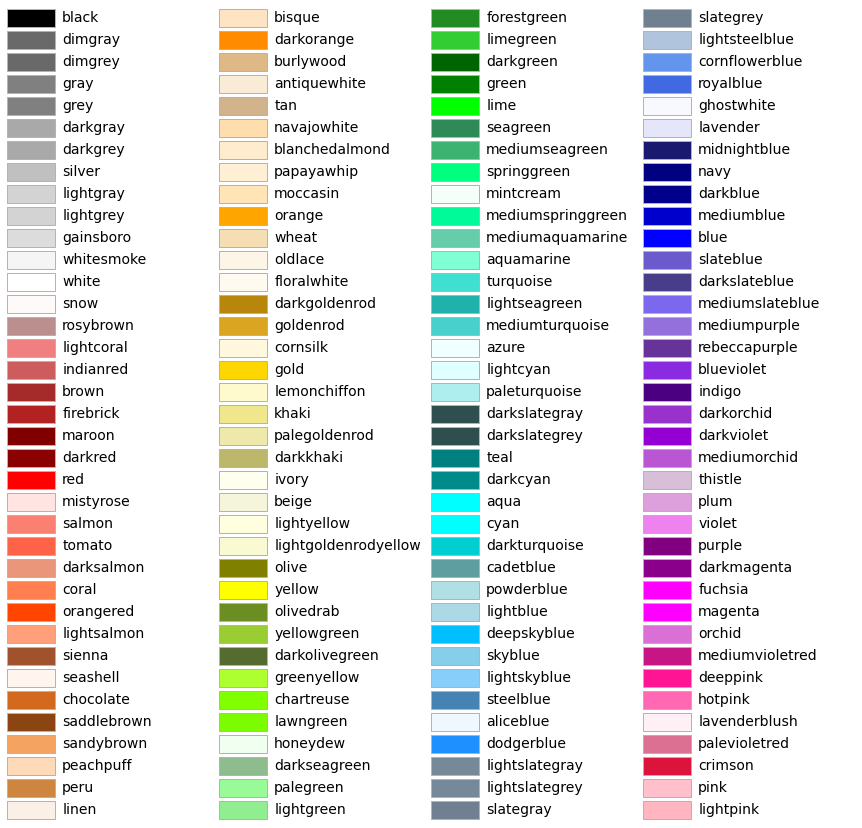

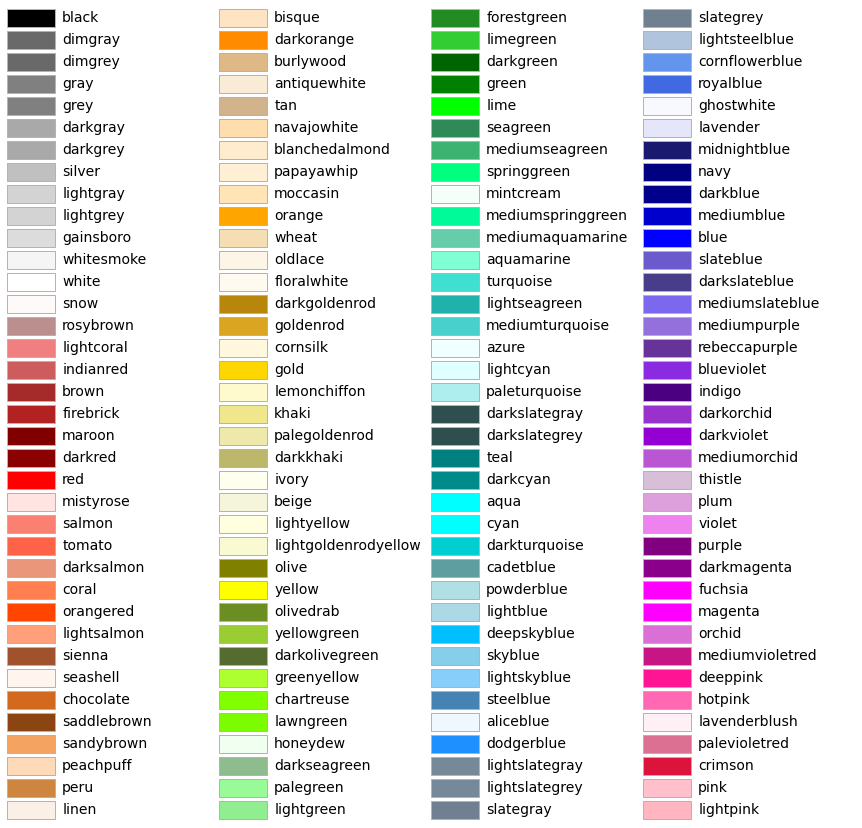

In [34]:
from matplotlib.patches import Rectangle
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors


def plot_colortable(colors, sort_colors=True, emptycols=0):

    cell_width = 212
    cell_height = 22
    swatch_width = 48
    margin = 12

    # Sort colors by hue, saturation, value and name.
    if sort_colors is True:
        by_hsv = sorted((tuple(mcolors.rgb_to_hsv(mcolors.to_rgb(color))),
                         name)
                        for name, color in colors.items())
        names = [name for hsv, name in by_hsv]
    else:
        names = list(colors)

    n = len(names)
    ncols = 4 - emptycols
    nrows = n // ncols + int(n % ncols > 0)

    width = cell_width * 4 + 2 * margin
    height = cell_height * nrows + 2 * margin
    dpi = 72

    fig, ax = plt.subplots(figsize=(width / dpi, height / dpi), dpi=dpi)
    fig.subplots_adjust(margin/width, margin/height,
                        (width-margin)/width, (height-margin)/height)
    ax.set_xlim(0, cell_width * 4)
    ax.set_ylim(cell_height * (nrows-0.5), -cell_height/2.)
    ax.yaxis.set_visible(False)
    ax.xaxis.set_visible(False)
    ax.set_axis_off()

    for i, name in enumerate(names):
        row = i % nrows
        col = i // nrows
        y = row * cell_height

        swatch_start_x = cell_width * col
        text_pos_x = cell_width * col + swatch_width + 7

        ax.text(text_pos_x, y, name, fontsize=14,
                horizontalalignment='left',
                verticalalignment='center')

        ax.add_patch(
            Rectangle(xy=(swatch_start_x, y-9), width=swatch_width,
                      height=18, facecolor=colors[name], edgecolor='0.7')
        )

    return fig
plot_colortable(mcolors.CSS4_COLORS)